# 🏗️ Hiyerarşik Mask Detection - FULL VERSION

## Konsept:
```
Stage 1: Domain Classification (5 sınıf)
  ├─ URBAN (15 masks)
  ├─ HUMAN_BODY (14 masks)
  ├─ CLOTHING (7 masks)
  ├─ INDOOR (8 masks)
  └─ BACKGROUND (5 masks)

Stage 2: Fine-Grained Mask Detection
  ├─ URBAN Model → building, car, road, ...
  ├─ HUMAN_BODY Model → hair, face, skin, ...
  ├─ CLOTHING Model → Upper-clothes, Pants, ...
  ├─ INDOOR Model → floor, ceiling, chair, ...
  └─ BACKGROUND Model → background, ego vehicle, ...
```

## Coverage: ~77% (Top-50 eşdeğer)

In [1]:
"""
🔧 HÜCRE 1 - SETUP VE IMPORTS
"""

import torch
import torch.nn as nn
import torch.optim as optim
import torch.backends.cudnn as cudnn
from torchvision import models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import pandas as pd
from PIL import Image
import os
import glob
import random
import numpy as np
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import time
import json
from collections import defaultdict
from sklearn.metrics import confusion_matrix, classification_report
from utils import *

cudnn.benchmark = True
torch.cuda.empty_cache()

print("🔥 GPU ısındırılıyor...")
dummy = torch.randn(1000, 1000).cuda()
for _ in range(10):
    _ = torch.matmul(dummy, dummy)
torch.cuda.synchronize()
del dummy
print("✅ GPU hazır!")

# =============================================
# ⚙️ AYARLAR
# =============================================

NOTEBOOK_NAME = "hierarchical_mask_detection - Kopya (2)"
BATCH_SIZE = 8
NUM_EPOCHS_STAGE1 = 6  # Domain classifier
NUM_EPOCHS_STAGE2 = 5  # Domain-specific models (daha az data)
LEARNING_RATE = 0.001
EARLY_STOP_PATIENCE = 8
IMG_SIZE = 224
VAL_SPLIT = 0.2

CSV_BASE = r"C:\AI_DATA\SEMI_TRUTHS\inpainting"
EXTRACTED_BASE = r"C:\AI_DATA\SEMI_TRUTHS_extracted\inpainting"

device = torch.device("cuda")

print("="*70)
print("🎮 HİYERARŞİK MASK DETECTION")
print("="*70)
print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Stage 1 Epochs: {NUM_EPOCHS_STAGE1}")
print(f"Stage 2 Epochs: {NUM_EPOCHS_STAGE2}")
print(f"Learning Rate: {LEARNING_RATE}")
print("="*70)

🔥 GPU ısındırılıyor...
✅ GPU hazır!
🎮 HİYERARŞİK MASK DETECTION
GPU: NVIDIA GeForce RTX 4060 Laptop GPU
VRAM: 8.0 GB
Batch Size: 8
Stage 1 Epochs: 6
Stage 2 Epochs: 5
Learning Rate: 0.001


In [2]:
"""
📋 HÜCRE 2 - DOMAIN KATEGORİLERİ
"""

print("\n" + "="*70)
print("📋 DOMAIN KATEGORİLERİ")
print("="*70)

DOMAIN_CATEGORIES = {
    'URBAN': [
        'building', 'car', 'road', 'sidewalk', 'vegetation', 'sky', 
        'wall', 'window', 'door', 'tree', 'trees', 'pole', 'fence', 
        'parking', 'terrain'
    ],
    
    'HUMAN_BODY': [
        'hair', 'face', 'skin', 'neck', 'nose', 'Right-arm', 'Left-arm',
        'Right-leg', 'Left-leg', 'left_ear', 'right_ear', 'mouth', 
        'upper_lip', 'lower_lip'
    ],
    
    'CLOTHING': [
        'Upper-clothes', 'Pants', 'skirt', 'dress', 'hat', 'bag', 'cloth'
    ],
    
    'INDOOR': [
        'floor', 'ceiling', 'chair', 'table', 'seat', 'column', 'ground', 'grass'
    ],
    
    'BACKGROUND': [
        'background', 'out of roi', 'ego vehicle', 'rectification border', 'static'
    ]
}

DOMAIN_NAMES = list(DOMAIN_CATEGORIES.keys())
NUM_DOMAINS = len(DOMAIN_NAMES)

print(f"\n✅ {NUM_DOMAINS} Domain Tanımlandı:")
total_masks = 0
for i, (domain, masks) in enumerate(DOMAIN_CATEGORIES.items()):
    print(f"   [{i}] {domain:<15} → {len(masks):2d} masks")
    total_masks += len(masks)

print(f"\n   TOPLAM: {total_masks} mask türü")

def get_domain(mask_name):
    for domain, masks in DOMAIN_CATEGORIES.items():
        if mask_name in masks:
            return domain
    return None

print("\n✅ get_domain() fonksiyonu tanımlandı")


📋 DOMAIN KATEGORİLERİ

✅ 5 Domain Tanımlandı:
   [0] URBAN           → 15 masks
   [1] HUMAN_BODY      → 14 masks
   [2] CLOTHING        →  7 masks
   [3] INDOOR          →  8 masks
   [4] BACKGROUND      →  5 masks

   TOPLAM: 49 mask türü

✅ get_domain() fonksiyonu tanımlandı


In [3]:
"""
📊 HÜCRE 3 - CSV YÜKLEME VE DOMAIN ETİKETLEME
"""

print("\n" + "="*70)
print("📊 CSV YÜKLEMESİ")
print("="*70)

csv_files = glob.glob(os.path.join(CSV_BASE, "**", "*_meta.csv"), recursive=True)
print(f"\n✅ Bulunan CSV: {len(csv_files)} dosya")

if len(csv_files) == 0:
    raise FileNotFoundError(f"❌ CSV dosyası bulunamadı: {CSV_BASE}")

all_dfs = []
for csv_file in csv_files:
    df = pd.read_csv(csv_file)
    csv_dir = os.path.dirname(csv_file)
    parent_folder = os.path.basename(os.path.dirname(csv_dir))
    model_name = os.path.basename(csv_dir)
    df['parent_dataset'] = parent_folder
    df['model'] = model_name
    df['dataset'] = f"{parent_folder}_{model_name}"
    all_dfs.append(df)
    print(f"   ✅ {parent_folder}/{model_name}: {len(df):,} satır")

df_combined = pd.concat(all_dfs, ignore_index=True)
print(f"\n✅ Toplam: {len(df_combined):,} görsel")

# Domain etiketleme
df_combined['domain'] = df_combined['mask_name'].apply(get_domain)
df_with_domain = df_combined[df_combined['domain'].notna()].copy()

print(f"\n📊 Domain Dağılımı:")
domain_counts = df_with_domain['domain'].value_counts()
for domain in DOMAIN_NAMES:
    count = domain_counts.get(domain, 0)
    ratio = (count / len(df_with_domain)) * 100
    print(f"   {domain:<15}: {count:>6,} ({ratio:>5.1f}%)")

print(f"\n✅ Domain etiketlendi: {len(df_with_domain):,} / {len(df_combined):,} görsel")


📊 CSV YÜKLEMESİ

✅ Bulunan CSV: 6 dosya
   ✅ ADE20K/StableDiffusion_v5: 48,196 satır
   ✅ ADE20K/StableDiffusion_XL: 48,468 satır
   ✅ CelebAHQ/Kandinsky_2_2: 14,730 satır
   ✅ CityScapes/Kandinsky_2_2: 44,649 satır
   ✅ HumanParsing/OpenJourney: 29,061 satır
   ✅ OpenImages/StableDiffusion_XL: 7,332 satır

✅ Toplam: 192,436 görsel

📊 Domain Dağılımı:
   URBAN          : 67,523 ( 55.7%)
   HUMAN_BODY     : 20,840 ( 17.2%)
   CLOTHING       :  6,417 (  5.3%)
   INDOOR         : 16,920 ( 13.9%)
   BACKGROUND     :  9,614 (  7.9%)

✅ Domain etiketlendi: 121,314 / 192,436 görsel


In [4]:
"""
🏗️ HÜCRE 4 - MODEL MİMARİLERİ
"""

print("\n" + "="*70)
print("🏗️ MODEL MİMARİLERİ")
print("="*70)

class DomainClassifier(nn.Module):
    """Stage 1: Domain sınıflandırıcı"""
    
    def __init__(self, num_domains=5, dropout_rate=0.3):
        super(DomainClassifier, self).__init__()
        self.backbone = models.resnet50(pretrained=True)
        backbone_out = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()
        
        self.head = nn.Sequential(
            nn.Linear(backbone_out, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_rate),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_rate),
            nn.Linear(256, num_domains)
        )
    
    def forward(self, x):
        features = self.backbone(x)
        return self.head(features)

class DomainMaskDetector(nn.Module):
    """Stage 2: Domain-specific mask detector"""
    
    def __init__(self, num_masks, dropout_rate=0.3):
        super(DomainMaskDetector, self).__init__()
        self.backbone = models.resnet50(pretrained=True)
        backbone_out = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()
        
        self.head = nn.Sequential(
            nn.Linear(backbone_out, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_rate),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_rate),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_rate),
            nn.Linear(256, num_masks)
        )
    
    def forward(self, x):
        features = self.backbone(x)
        return self.head(features)

print("\n✅ DomainClassifier tanımlandı")
print("✅ DomainMaskDetector tanımlandı")


🏗️ MODEL MİMARİLERİ

✅ DomainClassifier tanımlandı
✅ DomainMaskDetector tanımlandı


In [5]:
"""
📂 HÜCRE 5 - EĞİTİM FONKSİYONLARI
"""

def train_epoch(model, loader, criterion, optimizer, device, batch_metrics_file=None, epoch=0, phase='train'):
    """Bir epoch eğitim"""
    model.train()
    total_loss = 0.0
    correct = 0
    total = 0
    
    with tqdm(loader, desc=f"Train E{epoch}", leave=False) as pbar:
        for batch_idx, (images, labels) in enumerate(pbar):
            images = images.to(device)
            labels = labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
            
            # Batch metrics kaydet
            if batch_metrics_file and batch_idx % 10 == 0:
                with open(batch_metrics_file, 'a') as f:
                    f.write(f"{epoch},{batch_idx},{phase},{loss.item():.6f},{(correct/total):.6f}\n")
            
            pbar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'acc': f'{(correct/total)*100:.2f}%'
            })
    
    return total_loss / len(loader), correct / total

def val_epoch(model, loader, criterion, device):
    """Bir epoch validasyon"""
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        with tqdm(loader, desc="Val", leave=False) as pbar:
            for images, labels in pbar:
                images = images.to(device)
                labels = labels.to(device)
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                
                total_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                correct += (predicted == labels).sum().item()
                total += labels.size(0)
                
                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                
                pbar.set_postfix({
                    'loss': f'{loss.item():.4f}',
                    'acc': f'{(correct/total)*100:.2f}%'
                })
    
    return total_loss / len(loader), correct / total, all_preds, all_labels

print("✅ train_epoch() ve val_epoch() tanımlandı")

✅ train_epoch() ve val_epoch() tanımlandı


In [7]:
"""
📂 HÜCRE 6 - STAGE 1 DATASET (Domain Classification) - RECURSIVE FIX
"""

print("\n" + "="*70)
print("📂 STAGE 1 DATASET")
print("="*70)

# Domain label mapping
domain_to_label = {domain: idx for idx, domain in enumerate(DOMAIN_NAMES)}
label_to_domain = {idx: domain for domain, idx in domain_to_label.items()}

print("\nDomain → Label:")
for domain, label in domain_to_label.items():
    print(f"   [{label}] {domain}")

# Etiket sözlüğü
labels_dict_by_dataset = {}
for _, row in df_with_domain.iterrows():
    img_id = str(row['perturbed_img_id'])
    domain = row['domain']
    label = domain_to_label[domain]
    dataset_key = row['dataset']
    
    if dataset_key not in labels_dict_by_dataset:
        labels_dict_by_dataset[dataset_key] = {}
    
    for ext in ['', '.png', '.jpg', '.jpeg']:
        labels_dict_by_dataset[dataset_key][img_id + ext] = label

print(f"\n✅ Etiket dictionary oluşturuldu: {len(labels_dict_by_dataset)} dataset")

# =============================================
# 🔍 RECURSIVE DOSYA TARAMA (os.walk kullanarak)
# =============================================

print("\n📂 Extract edilmiş dosyalar taranıyor (recursive)...")

all_image_paths = []
all_labels = []
found_by_dataset = {}

# Her dataset klasörünü tara
for parent_dataset in os.listdir(EXTRACTED_BASE):
    parent_path = os.path.join(EXTRACTED_BASE, parent_dataset)
    if not os.path.isdir(parent_path):
        continue
    
    for model_name in os.listdir(parent_path):
        model_path = os.path.join(parent_path, model_name)
        if not os.path.isdir(model_path):
            continue
        
        dataset_key = f"{parent_dataset}_{model_name}"
        
        # Bu dataset için etiket sözlüğü var mı?
        if dataset_key not in labels_dict_by_dataset:
            continue
        
        labels_dict = labels_dict_by_dataset[dataset_key]
        found_by_dataset[dataset_key] = 0
        
        print(f"\n🔍 {dataset_key}")
        print(f"   Klasör: {model_path}")
        
        # 🔑 核心: os.walk ile recursive tara (alt klasörler dahil)
        for root, dirs, files in os.walk(model_path):
            for file in files:
                if file.endswith(('.png', '.jpg', '.jpeg')):
                    # Dosya adı varyasyonları
                    base_name = file
                    name_without_ext = os.path.splitext(file)[0]
                    
                    label = None
                    
                    # Farklı adlarla dene
                    for name in [base_name, name_without_ext,
                               name_without_ext + '.png',
                               name_without_ext + '.jpg',
                               name_without_ext + '.jpeg']:
                        if name in labels_dict:
                            label = labels_dict[name]
                            break
                    
                    if label is not None:
                        full_path = os.path.join(root, file)
                        all_image_paths.append(full_path)
                        all_labels.append(label)
                        found_by_dataset[dataset_key] += 1
        
        if dataset_key in found_by_dataset:
            print(f"   ✅ {found_by_dataset[dataset_key]:,} görüntü bulundu")

print(f"\n{'='*70}")
print(f"✅ TOPLAM: {len(all_image_paths):,} görüntü bulundu")
print(f"{'='*70}")

if len(all_image_paths) == 0:
    print("\n❌ HATA: Hiç görüntü bulunamadı!")
    print("\n📋 Bulunan dataset'ler:")
    for dataset_key in labels_dict_by_dataset.keys():
        print(f"   - {dataset_key}: {len(labels_dict_by_dataset[dataset_key]):,} etiket")
    raise FileNotFoundError("Görüntü dosyaları bulunamadı!")

# Dataset bazında istatistik
print(f"\n📊 Dataset Bazında Bulunan:")
for dataset_key in sorted(found_by_dataset.keys()):
    expected = len([k for k in labels_dict_by_dataset[dataset_key].keys() if not k.endswith(('.png', '.jpg', '.jpeg'))])
    found = found_by_dataset[dataset_key]
    ratio = (found / expected * 100) if expected > 0 else 0
    print(f"   {dataset_key:<35}: {found:>6,} / {expected:>6,} ({ratio:>5.1f}%)")

# Dataset class
class DomainDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        try:
            img = Image.open(self.image_paths[idx]).convert('RGB')
            if self.transform:
                img = self.transform(img)
            return img, self.labels[idx]
        except Exception as e:
            # Hata durumunda rastgele başka örnek döndür
            return self.__getitem__(random.randint(0, len(self) - 1))

# Transforms
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Train/Val split
indices = list(range(len(all_image_paths)))
random.seed(42)
random.shuffle(indices)

split_idx = int(len(indices) * (1 - VAL_SPLIT))
train_indices = indices[:split_idx]
val_indices = indices[split_idx:]

train_paths_s1 = [all_image_paths[i] for i in train_indices]
train_labels_s1 = [all_labels[i] for i in train_indices]
val_paths_s1 = [all_image_paths[i] for i in val_indices]
val_labels_s1 = [all_labels[i] for i in val_indices]

print(f"\n✅ Train/Val Split:")
print(f"   Train: {len(train_paths_s1):,} görüntü")
print(f"   Val: {len(val_paths_s1):,} görüntü")

# DataLoaders
train_dataset_s1 = DomainDataset(train_paths_s1, train_labels_s1, train_transform)
val_dataset_s1 = DomainDataset(val_paths_s1, val_labels_s1, val_transform)

train_loader_s1 = DataLoader(train_dataset_s1, batch_size=BATCH_SIZE, shuffle=True, 
                              num_workers=0, pin_memory=True, drop_last=True)
val_loader_s1 = DataLoader(val_dataset_s1, batch_size=BATCH_SIZE, shuffle=False,
                            num_workers=0, pin_memory=True, drop_last=False)

print(f"\n✅ DataLoader'lar oluşturuldu:")
print(f"   Train batches: {len(train_loader_s1)}")
print(f"   Val batches: {len(val_loader_s1)}")

print("\n" + "="*70)
print("✅ STAGE 1 DATASET HAZIR")
print("="*70)


📂 STAGE 1 DATASET

Domain → Label:
   [0] URBAN
   [1] HUMAN_BODY
   [2] CLOTHING
   [3] INDOOR
   [4] BACKGROUND

✅ Etiket dictionary oluşturuldu: 6 dataset

📂 Extract edilmiş dosyalar taranıyor (recursive)...

🔍 ADE20K_StableDiffusion_XL
   Klasör: C:\AI_DATA\SEMI_TRUTHS_extracted\inpainting\ADE20K\StableDiffusion_XL
   ✅ 26,657 görüntü bulundu

🔍 CelebAHQ_Kandinsky_2_2
   Klasör: C:\AI_DATA\SEMI_TRUTHS_extracted\inpainting\CelebAHQ\Kandinsky_2_2
   ✅ 13,727 görüntü bulundu

🔍 CityScapes_Kandinsky_2_2
   Klasör: C:\AI_DATA\SEMI_TRUTHS_extracted\inpainting\CityScapes\Kandinsky_2_2
   ✅ 27,293 görüntü bulundu

🔍 HumanParsing_OpenJourney
   Klasör: C:\AI_DATA\SEMI_TRUTHS_extracted\inpainting\HumanParsing\OpenJourney
   ✅ 13,215 görüntü bulundu

🔍 OpenImages_StableDiffusion_XL
   Klasör: C:\AI_DATA\SEMI_TRUTHS_extracted\inpainting\OpenImages\StableDiffusion_XL
   ✅ 210 görüntü bulundu

✅ TOPLAM: 81,102 görüntü bulundu

📊 Dataset Bazında Bulunan:
   ADE20K_StableDiffusion_XL          : 2

In [ ]:
"""
🎓 HÜCRE 7 - STAGE 1 EĞİTİM (Domain Classifier)
"""

print("\n" + "="*70)
print("🎓 STAGE 1 EĞİTİM BAŞLIYOR")
print("="*70)

# Klasör yapısı
stage1_folder = create_training_folder(f"{NOTEBOOK_NAME}/stage1_domain")
batch_metrics_s1 = os.path.join(stage1_folder['logs'], 'batch_metrics.csv')
with open(batch_metrics_s1, 'w') as f:
    f.write('epoch,batch,phase,loss,accuracy\n')

# Model
model_s1 = DomainClassifier(num_domains=NUM_DOMAINS).to(device)
criterion_s1 = nn.CrossEntropyLoss()
optimizer_s1 = optim.Adam(model_s1.parameters(), lr=LEARNING_RATE)
scheduler_s1 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_s1, mode='min', 
                                                      factor=0.5, patience=2, verbose=True)

# Parametre sayısı
total_params = sum(p.numel() for p in model_s1.parameters())
print(f"\n✅ Model hazır: {total_params:,} parametre")
print(f"✅ Domain sayısı: {NUM_DOMAINS}")

# Eğitim
best_val_loss = float('inf')
patience_counter = 0
history_s1 = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

print("\n" + "="*70)
print("EĞİTİM BAŞLIYOR")
print("="*70)

for epoch in range(NUM_EPOCHS_STAGE1):
    print(f"\n📍 Epoch {epoch+1}/{NUM_EPOCHS_STAGE1}")
    print("-" * 70)
    
    # Train
    train_loss, train_acc = train_epoch(model_s1, train_loader_s1, criterion_s1, 
                                         optimizer_s1, device, batch_metrics_s1, epoch, 'train')
    
    # Val
    val_loss, val_acc, _, _ = val_epoch(model_s1, val_loader_s1, criterion_s1, device)
    
    # Scheduler
    scheduler_s1.step(val_loss)
    
    # History
    history_s1['train_loss'].append(train_loss)
    history_s1['train_acc'].append(train_acc)
    history_s1['val_loss'].append(val_loss)
    history_s1['val_acc'].append(val_acc)
    
    # Print
    print(f"\n📊 Sonuçlar:")
    print(f"   Train: Loss={train_loss:.4f}, Acc={train_acc*100:.2f}%")
    print(f"   Val:   Loss={val_loss:.4f}, Acc={val_acc*100:.2f}%")
    print(f"   LR: {optimizer_s1.param_groups[0]['lr']:.6f}")
    
    # Best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model_s1.state_dict(),
            'optimizer_state_dict': optimizer_s1.state_dict(),
            'val_loss': val_loss,
            'val_acc': val_acc,
            'domain_to_label': domain_to_label,
            'label_to_domain': label_to_domain,
            'domain_categories': DOMAIN_CATEGORIES
        }
        
        best_path = os.path.join(stage1_folder['models'], 'best_model.pth')
        torch.save(checkpoint, best_path)
        print(f"   ✅ Best model kaydedildi!")
    else:
        patience_counter += 1
        print(f"   ⚠️  No improvement ({patience_counter}/{EARLY_STOP_PATIENCE})")
    
    # Early stopping
    if patience_counter >= EARLY_STOP_PATIENCE:
        print(f"\n⚠️  Early stopping at epoch {epoch+1}")
        break

print("\n" + "="*70)
print("✅ STAGE 1 EĞİTİM TAMAMLANDI")
print("="*70)
print(f"Best Val Loss: {best_val_loss:.4f}")
print(f"Best Val Acc: {max(history_s1['val_acc'])*100:.2f}%")

In [ ]:
"""
📊 STAGE 1 SONUÇLARI - DETAYLI GÖRSELLEŞTİRME

Bu hücreyi Stage 1 eğitimi bittikten sonra çalıştır.
Eğitim sırasında toplanan metrikleri ve sonuçları görselleştirir.
"""

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import torch

print("\n" + "="*70)
print("📊 STAGE 1 - DOMAIN CLASSIFICATION SONUÇLARI")
print("="*70)

# =============================================
# 1️⃣ EĞİTİM GRAFİKLERİ (Loss & Accuracy)
# =============================================

print("\n1️⃣ Eğitim eğrileri çiziliyor...")

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
folders_s1 = create_training_folder(f"{NOTEBOOK_NAME}/folders_s1")

# Loss grafiği
axes[0].plot(history_s1['train_loss'], label='Train Loss', linewidth=2, marker='o', markersize=4)
axes[0].plot(history_s1['val_loss'], label='Val Loss', linewidth=2, marker='s', markersize=4)
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title('Stage 1: Loss Curves', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# En iyi epoch'u işaretle
best_epoch = np.argmin(history_s1['val_loss'])
axes[0].axvline(x=best_epoch, color='red', linestyle='--', alpha=0.5, label=f'Best (Epoch {best_epoch+1})')
axes[0].legend(fontsize=11)

# Accuracy grafiği
axes[1].plot(history_s1['train_acc'], label='Train Acc', linewidth=2, marker='o', markersize=4)
axes[1].plot(history_s1['val_acc'], label='Val Acc', linewidth=2, marker='s', markersize=4)
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Accuracy (%)', fontsize=12)
axes[1].set_title('Stage 1: Accuracy Curves', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

# En iyi epoch'u işaretle
best_epoch_acc = np.argmax(history_s1['val_acc'])
axes[1].axvline(x=best_epoch_acc, color='red', linestyle='--', alpha=0.5, label=f'Best (Epoch {best_epoch_acc+1})')
axes[1].legend(fontsize=11)

plt.tight_layout()
plt.savefig(os.path.join(folders_s1['plots'], 'stage1_training_curves.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Grafik kaydedildi: stage1_training_curves.png")

# =============================================
# 2️⃣ BATCH METRİKS ANALİZİ
# =============================================

print("\n2️⃣ Batch metrics analiz ediliyor...")

# CSV'yi yükle
batch_csv_path = os.path.join(folders_s1['logs'], 'batch_metrics.csv')
if os.path.exists(batch_csv_path):
    df_batch = pd.read_csv(batch_csv_path)
    
    fig, axes = plt.subplots(2, 1, figsize=(16, 10))
    
    # Train batch loss'ları
    train_batches = df_batch[df_batch['phase'] == 'train']
    axes[0].plot(train_batches.index, train_batches['loss'], alpha=0.6, linewidth=0.5, color='blue')
    axes[0].set_xlabel('Batch Index', fontsize=12)
    axes[0].set_ylabel('Loss', fontsize=12)
    axes[0].set_title('Batch-Level Training Loss (Tüm Epoch\'lar)', fontsize=14, fontweight='bold')
    axes[0].grid(True, alpha=0.3)
    
    # Moving average ekle
    window = 50
    if len(train_batches) > window:
        moving_avg = train_batches['loss'].rolling(window=window).mean()
        axes[0].plot(train_batches.index, moving_avg, color='red', linewidth=2, label=f'{window}-Batch Moving Avg')
        axes[0].legend()
    
    # Train batch accuracy'leri
    axes[1].plot(train_batches.index, train_batches['accuracy'], alpha=0.6, linewidth=0.5, color='green')
    axes[1].set_xlabel('Batch Index', fontsize=12)
    axes[1].set_ylabel('Accuracy (%)', fontsize=12)
    axes[1].set_title('Batch-Level Training Accuracy (Tüm Epoch\'lar)', fontsize=14, fontweight='bold')
    axes[1].grid(True, alpha=0.3)
    
    # Moving average ekle
    if len(train_batches) > window:
        moving_avg = train_batches['accuracy'].rolling(window=window).mean()
        axes[1].plot(train_batches.index, moving_avg, color='red', linewidth=2, label=f'{window}-Batch Moving Avg')
        axes[1].legend()
    
    plt.tight_layout()
    plt.savefig(os.path.join(folders_s1['plots'], 'stage1_batch_metrics.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"   ✅ Grafik kaydedildi: stage1_batch_metrics.png")
    
    # İstatistikler
    print(f"\n   📊 Batch Metrics İstatistikleri:")
    print(f"      Toplam batch: {len(train_batches):,}")
    print(f"      Min loss: {train_batches['loss'].min():.4f}")
    print(f"      Max loss: {train_batches['loss'].max():.4f}")
    print(f"      Final 100 batch avg loss: {train_batches['loss'].tail(100).mean():.4f}")
    print(f"      Final 100 batch avg acc: {train_batches['accuracy'].tail(100).mean():.2f}%")

else:
    print(f"   ⚠️  Batch metrics CSV bulunamadı: {batch_csv_path}")

# =============================================
# 3️⃣ CONFUSION MATRIX (Validation Set)
# =============================================

print("\n3️⃣ Confusion matrix hesaplanıyor...")

# Model'i eval mode'a al
model_s1.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader_s1:
        images = images.to(device)
        outputs = model_s1(images)
        _, preds = torch.max(outputs, 1)
        
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

# Confusion matrix oluştur
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Görselleştir
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Raw confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=DOMAIN_NAMES, yticklabels=DOMAIN_NAMES,
            ax=axes[0], cbar_kws={'label': 'Count'})
axes[0].set_xlabel('Predicted', fontsize=12)
axes[0].set_ylabel('True', fontsize=12)
axes[0].set_title('Confusion Matrix (Counts)', fontsize=14, fontweight='bold')

# Normalized confusion matrix
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', 
            xticklabels=DOMAIN_NAMES, yticklabels=DOMAIN_NAMES,
            ax=axes[1], cbar_kws={'label': 'Ratio'})
axes[1].set_xlabel('Predicted', fontsize=12)
axes[1].set_ylabel('True', fontsize=12)
axes[1].set_title('Confusion Matrix (Normalized)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(folders_s1['plots'], 'stage1_confusion_matrix.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Grafik kaydedildi: stage1_confusion_matrix.png")

# =============================================
# 4️⃣ DOMAIN BAZINDA PERFORMANS
# =============================================

print("\n4️⃣ Domain bazında performans analizi...")

# Classification report
report = classification_report(all_labels, all_preds, 
                               target_names=DOMAIN_NAMES, 
                               output_dict=True)

# DataFrame'e çevir
df_report = pd.DataFrame(report).transpose()
df_report = df_report[df_report.index.isin(DOMAIN_NAMES)]

# Bar chart
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

metrics = ['precision', 'recall', 'f1-score']
colors = ['skyblue', 'lightcoral', 'lightgreen']

for idx, (metric, color) in enumerate(zip(metrics, colors)):
    values = df_report[metric].values
    bars = axes[idx].bar(DOMAIN_NAMES, values, color=color, alpha=0.7, edgecolor='black')
    axes[idx].set_ylabel(metric.capitalize(), fontsize=12)
    axes[idx].set_title(f'{metric.capitalize()} by Domain', fontsize=14, fontweight='bold')
    axes[idx].set_ylim([0, 1.0])
    axes[idx].axhline(y=0.9, color='red', linestyle='--', alpha=0.5, label='Target (0.90)')
    axes[idx].legend()
    axes[idx].grid(True, alpha=0.3, axis='y')
    
    # Bar üzerine değerleri yaz
    for bar in bars:
        height = bar.get_height()
        axes[idx].text(bar.get_x() + bar.get_width()/2., height,
                      f'{height:.3f}',
                      ha='center', va='bottom', fontsize=10)
    
    # X-label'ları döndür
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(os.path.join(folders_s1['plots'], 'stage1_domain_performance.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Grafik kaydedildi: stage1_domain_performance.png")

# Raporu yazdır
print(f"\n   📊 Domain Bazında Detaylı Performans:")
print(f"   {'Domain':<15} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<10}")
print(f"   {'-'*65}")
for domain in DOMAIN_NAMES:
    prec = df_report.loc[domain, 'precision']
    rec = df_report.loc[domain, 'recall']
    f1 = df_report.loc[domain, 'f1-score']
    sup = int(df_report.loc[domain, 'support'])
    print(f"   {domain:<15} {prec:>6.2%}       {rec:>6.2%}       {f1:>6.2%}       {sup:>6,}")

# =============================================
# 5️⃣ ÖZET İSTATİSTİKLER
# =============================================

print("\n" + "="*70)
print("📈 STAGE 1 ÖZET İSTATİSTİKLER")
print("="*70)

best_val_acc = max(history_s1['val_acc'])
best_val_loss = min(history_s1['val_loss'])
final_train_acc = history_s1['train_acc'][-1]
final_val_acc = history_s1['val_acc'][-1]

print(f"\n✅ En İyi Sonuçlar:")
print(f"   Best Val Accuracy: {best_val_acc*100:.2f}%")
print(f"   Best Val Loss: {best_val_loss:.4f}")
print(f"   Best Epoch: {np.argmax(history_s1['val_acc']) + 1}")

print(f"\n📊 Final Epoch Sonuçları:")
print(f"   Final Train Acc: {final_train_acc*100:.2f}%")
print(f"   Final Val Acc: {final_val_acc*100:.2f}%")
print(f"   Train/Val Gap: {(final_train_acc - final_val_acc)*100:.2f}%")

print(f"\n⏱️  Eğitim Bilgileri:")
print(f"   Toplam Epoch: {len(history_s1['train_loss'])}")
print(f"   Hedef Accuracy (>90%): {'✅ BAŞARILI' if best_val_acc > 0.90 else '⚠️ DÜŞ��K'}")

print("\n" + "="*70)
print("✅ GÖRSELLEŞTİRME TAMAMLANDI")
print("="*70)

print(f"\n📂 Kaydedilen grafikler:")
print(f"   1. stage1_training_curves.png")
print(f"   2. stage1_batch_metrics.png")
print(f"   3. stage1_confusion_matrix.png")
print(f"   4. stage1_domain_performance.png")

print(f"\n💡 Sonraki adım: Stage 2 eğitimine geçebilirsin (Hücre 8-9)")

In [8]:
"""
📂 HÜCRE 8 - STAGE 2 DATASET HAZIRLIĞI (Domain-Specific Mask Detection)
Her domain için ayrı dataset ve DataLoader hazırla
"""

print("\n" + "="*70)
print("📂 STAGE 2 DATASET HAZIRLIĞI")
print("="*70)

# =============================================
# 1️⃣ HER DOMAIN İÇİN MASK LABEL MAPPINGS
# =============================================

print("\n1️⃣ Domain-specific mask mappings oluşturuluyor...")

domain_mask_mappings = {}

for domain, masks in DOMAIN_CATEGORIES.items():
    domain_mask_mappings[domain] = {
        'masks': masks,
        'mask_to_label': {mask: idx for idx, mask in enumerate(masks)},
        'label_to_mask': {idx: mask for idx, mask in enumerate(masks)},
        'num_masks': len(masks)
    }

print("\n📊 Domain Mask Counts:")
for domain, info in domain_mask_mappings.items():
    print(f"   {domain:<15}: {info['num_masks']:>2} masks")

# =============================================
# 2️⃣ HER DOMAIN İÇİN DATASET FİLTRELE
# =============================================

print("\n2️⃣ Her domain için dataset filtreleniyor...")

# Dataset class tanımla (Hücre 6'daki ile aynı)
class DomainDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        try:
            img = Image.open(self.image_paths[idx]).convert('RGB')
            if self.transform:
                img = self.transform(img)
            return img, self.labels[idx]
        except Exception as e:
            # Hata durumunda rastgele başka örnek döndür
            return self.__getitem__(random.randint(0, len(self) - 1))

# Transforms (Hücre 6'daki ile aynı)
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Her domain için etiket sözlükleri oluştur
domain_labels_dicts = {}

for domain in DOMAIN_NAMES:
    print(f"\n🔍 {domain} için etiketler hazırlanıyor...")
    
    domain_masks = domain_mask_mappings[domain]['masks']
    mask_to_label = domain_mask_mappings[domain]['mask_to_label']
    
    # Bu domain'e ait mask'lara sahip satırları filtrele
    domain_df = df_with_domain[
        (df_with_domain['domain'] == domain) &
        (df_with_domain['mask_name'].isin(domain_masks))
    ].copy()
    
    print(f"   CSV'de {len(domain_df):,} örnek bulundu")
    
    # Etiket sözlüğü oluştur (dataset bazında)
    labels_dict_by_dataset = {}
    
    for _, row in domain_df.iterrows():
        img_id = str(row['perturbed_img_id'])
        mask_name = row['mask_name']
        label = mask_to_label[mask_name]
        dataset_key = row['dataset']
        
        if dataset_key not in labels_dict_by_dataset:
            labels_dict_by_dataset[dataset_key] = {}
        
        # Farklı uzantılarla denemeler
        for ext in ['', '.png', '.jpg', '.jpeg']:
            labels_dict_by_dataset[dataset_key][img_id + ext] = label
    
    domain_labels_dicts[domain] = labels_dict_by_dataset

# =============================================
# 3️⃣ DOSYA TARAMA (RECURSIVE os.walk)
# =============================================

print("\n3️⃣ Dosyalar taranıyor (recursive)...")

domain_image_data = {}

for domain in DOMAIN_NAMES:
    print(f"\n📂 {domain}")
    
    labels_dict_by_dataset = domain_labels_dicts[domain]
    
    all_image_paths = []
    all_labels = []
    found_by_dataset = {}
    
    # Her dataset klasörünü tara
    for parent_dataset in os.listdir(EXTRACTED_BASE):
        parent_path = os.path.join(EXTRACTED_BASE, parent_dataset)
        if not os.path.isdir(parent_path):
            continue
        
        for model_name in os.listdir(parent_path):
            model_path = os.path.join(parent_path, model_name)
            if not os.path.isdir(model_path):
                continue
            
            dataset_key = f"{parent_dataset}_{model_name}"
            
            # Bu dataset için etiket sözlüğü var mı?
            if dataset_key not in labels_dict_by_dataset:
                continue
            
            labels_dict = labels_dict_by_dataset[dataset_key]
            found_by_dataset[dataset_key] = 0
            
            # 🔑 RECURSIVE TARAMA (os.walk)
            for root, dirs, files in os.walk(model_path):
                for file in files:
                    if file.endswith(('.png', '.jpg', '.jpeg')):
                        # Dosya adı varyasyonları
                        base_name = file
                        name_without_ext = os.path.splitext(file)[0]
                        
                        label = None
                        
                        # Farklı adlarla dene
                        for name in [base_name, name_without_ext,
                                   name_without_ext + '.png',
                                   name_without_ext + '.jpg',
                                   name_without_ext + '.jpeg']:
                            if name in labels_dict:
                                label = labels_dict[name]
                                break
                        
                        if label is not None:
                            full_path = os.path.join(root, file)
                            all_image_paths.append(full_path)
                            all_labels.append(label)
                            found_by_dataset[dataset_key] += 1
    
    # Sonuçları kaydet
    domain_image_data[domain] = {
        'paths': all_image_paths,
        'labels': all_labels,
        'found_by_dataset': found_by_dataset
    }
    
    print(f"   ✅ Toplam: {len(all_image_paths):,} görüntü bulundu")
    
    if len(found_by_dataset) > 0:
        for dataset_key, count in found_by_dataset.items():
            print(f"      • {dataset_key}: {count:,}")

# =============================================
# 4️⃣ TRAIN/VAL SPLIT VE DATALOADER'LAR
# =============================================

print("\n4️⃣ Train/Val split ve DataLoader'lar oluşturuluyor...")

domain_datasets = {}
domain_loaders = {}

for domain in DOMAIN_NAMES:
    print(f"\n📊 {domain}")
    
    image_data = domain_image_data[domain]
    all_paths = image_data['paths']
    all_labels = image_data['labels']
    
    if len(all_paths) == 0:
        print(f"   ⚠️  Görüntü bulunamadı, atlanıyor")
        continue
    
    # Train/Val split
    indices = list(range(len(all_paths)))
    random.seed(42)
    random.shuffle(indices)
    
    split_idx = int(len(indices) * (1 - VAL_SPLIT))
    train_indices = indices[:split_idx]
    val_indices = indices[split_idx:]
    
    train_paths = [all_paths[i] for i in train_indices]
    train_labels = [all_labels[i] for i in train_indices]
    val_paths = [all_paths[i] for i in val_indices]
    val_labels = [all_labels[i] for i in val_indices]
    
    print(f"   Train: {len(train_paths):,} | Val: {len(val_paths):,}")
    
    # Datasets
    train_dataset = DomainDataset(train_paths, train_labels, train_transform)
    val_dataset = DomainDataset(val_paths, val_labels, val_transform)
    
    # DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                              num_workers=0, pin_memory=True, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                            num_workers=0, pin_memory=True, drop_last=False)
    
    # Kaydet
    domain_datasets[domain] = {
        'train': train_dataset,
        'val': val_dataset
    }
    
    domain_loaders[domain] = {
        'train': train_loader,
        'val': val_loader
    }
    
    print(f"   ✅ Train batches: {len(train_loader)} | Val batches: {len(val_loader)}")

print("\n" + "="*70)
print("✅ STAGE 2 DATASET HAZIR")
print("="*70)

# Özet
print(f"\n📊 Özet:")
print(f"   Hazır domain sayısı: {len(domain_loaders)}")
for domain in domain_loaders.keys():
    train_size = len(domain_datasets[domain]['train'])
    val_size = len(domain_datasets[domain]['val'])
    print(f"   • {domain:<15}: {train_size:>6,} train + {val_size:>5,} val")


📂 STAGE 2 DATASET HAZIRLIĞI

1️⃣ Domain-specific mask mappings oluşturuluyor...

📊 Domain Mask Counts:
   URBAN          : 15 masks
   HUMAN_BODY     : 14 masks
   CLOTHING       :  7 masks
   INDOOR         :  8 masks
   BACKGROUND     :  5 masks

2️⃣ Her domain için dataset filtreleniyor...

🔍 URBAN için etiketler hazırlanıyor...
   CSV'de 67,523 örnek bulundu

🔍 HUMAN_BODY için etiketler hazırlanıyor...
   CSV'de 20,840 örnek bulundu

🔍 CLOTHING için etiketler hazırlanıyor...
   CSV'de 6,417 örnek bulundu

🔍 INDOOR için etiketler hazırlanıyor...
   CSV'de 16,920 örnek bulundu

🔍 BACKGROUND için etiketler hazırlanıyor...
   CSV'de 9,614 örnek bulundu

3️⃣ Dosyalar taranıyor (recursive)...

📂 URBAN
   ✅ Toplam: 38,984 görüntü bulundu
      • ADE20K_StableDiffusion_XL: 18,448
      • CityScapes_Kandinsky_2_2: 20,454
      • OpenImages_StableDiffusion_XL: 82

📂 HUMAN_BODY
   ✅ Toplam: 20,814 görüntü bulundu
      • ADE20K_StableDiffusion_XL: 26
      • CelebAHQ_Kandinsky_2_2: 12,583
  

In [ ]:
"""
🎯 HÜCRE 9 - STAGE 2 EĞİTİMİ (Checkpoint'ten Devam Etme Özellikli)
Her domain için ayrı model eğitimi
"""

print("\n" + "="*70)
print("🎯 STAGE 2 EĞİTİMİ - DOMAIN-SPECIFIC MASK DETECTION")
print("="*70)

# =============================================
# ⚙️ CHECKPOINT AYARI
# =============================================

RESUME_FROM_CHECKPOINT = False  # ← True yap kaldığın yerden devam etmek için

# =============================================
# 📊 EĞİTİM BAŞLAT
# =============================================

domain_models = {}
domain_histories = {}

for domain in DOMAIN_NAMES:
    print(f"\n{'='*70}")
    print(f"🎯 DOMAIN: {domain}")
    print(f"{'='*70}")
    
    # Bu domain için loader'ları kontrol et
    if domain not in domain_loaders:
        print(f"   ⚠️  {domain} için loader yok, atlanıyor")
        continue
    
    train_loader = domain_loaders[domain]['train']
    val_loader = domain_loaders[domain]['val']
    num_masks = domain_mask_mappings[domain]['num_masks']
    mask_to_label = domain_mask_mappings[domain]['mask_to_label']
    label_to_mask = domain_mask_mappings[domain]['label_to_mask']
    
    print(f"   Mask sayısı: {num_masks}")
    print(f"   Train batches: {len(train_loader)}")
    print(f"   Val batches: {len(val_loader)}")
    
    # Klasör
    domain_folder = create_training_folder(f"{NOTEBOOK_NAME}/stage2_{domain.lower()}")
    checkpoint_path = os.path.join(domain_folder['models'], 'best_model.pth')
    
    # =============================================
    # 🔄 CHECKPOINT KONTROLÜ VE YÜKLEME
    # =============================================
    
    if RESUME_FROM_CHECKPOINT and os.path.exists(checkpoint_path):
        print(f"\n🔄 CHECKPOINT'TEN DEVAM EDİLİYOR")
        print(f"   Checkpoint: {checkpoint_path}")
        
        # Checkpoint'i yükle
        checkpoint = torch.load(checkpoint_path, map_location=device)
        
        # Model oluştur ve yükle
        model = DomainMaskDetector(num_masks=num_masks).to(device)
        model.load_state_dict(checkpoint['model_state_dict'])
        
        # Optimizer yükle
        optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        # Scheduler yükle
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
                                                          factor=0.5, patience=2, verbose=True)
        if 'scheduler_state_dict' in checkpoint:
            scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        
        # Eğitim history'si
        if 'history' in checkpoint:
            history = checkpoint['history']
        else:
            history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
        
        # Kaldığı yeri bul
        start_epoch = checkpoint.get('epoch', 0) + 1
        best_val_loss = checkpoint.get('val_loss', float('inf'))
        best_val_acc = checkpoint.get('val_acc', 0.0)
        patience_counter = checkpoint.get('patience_counter', 0)
        
        print(f"\n   ✅ Checkpoint yüklendi:")
        print(f"      Son tamamlanan epoch: {checkpoint.get('epoch', 0)}")
        print(f"      Devam edilecek epoch: {start_epoch + 1}")
        print(f"      Best Val Acc: {best_val_acc*100:.2f}%")
        print(f"      Best Val Loss: {best_val_loss:.4f}")
        print(f"      Patience: {patience_counter}/{EARLY_STOP_PATIENCE}")
        
        # Batch metrics - APPEND mode (eski kayıtlar korunur)
        batch_metrics_file = os.path.join(domain_folder['logs'], 'batch_metrics.csv')
        if not os.path.exists(batch_metrics_file):
            with open(batch_metrics_file, 'w') as f:
                f.write('epoch,batch,phase,loss,accuracy\n')
        
        print(f"\n   📝 Batch metrics: APPEND mode (eski kayıtlar korunuyor)")
    
    else:
        print(f"\n🆕 YENİ EĞİTİME BAŞLANIYOR")
        
        # Yeni model oluştur
        model = DomainMaskDetector(num_masks=num_masks).to(device)
        optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
                                                          factor=0.5, patience=2, verbose=True)
        
        # Yeni history
        history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
        start_epoch = 0
        best_val_loss = float('inf')
        best_val_acc = 0.0
        patience_counter = 0
        
        # Batch metrics - YENİ dosya oluştur
        batch_metrics_file = os.path.join(domain_folder['logs'], 'batch_metrics.csv')
        with open(batch_metrics_file, 'w') as f:
            f.write('epoch,batch,phase,loss,accuracy\n')
        
        print(f"   📝 Batch metrics: YENİ dosya oluşturuldu")
    
    criterion = nn.CrossEntropyLoss()
    
    # =============================================
    # 🚀 EĞİTİM DÖNGÜSÜ
    # =============================================
    
    print(f"\n{'='*50}")
    print(f"🚀 {domain} EĞİTİMİ BAŞLIYOR")
    print(f"   Epoch aralığı: {start_epoch + 1} → {NUM_EPOCHS_STAGE2}")
    print(f"   Toplam epoch: {NUM_EPOCHS_STAGE2 - start_epoch}")
    print(f"{'='*50}")
    
    for epoch in range(start_epoch, NUM_EPOCHS_STAGE2):
        print(f"\n📍 Epoch {epoch+1}/{NUM_EPOCHS_STAGE2}")
        
        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion,
                                           optimizer, device, batch_metrics_file, epoch, 'train')
        
        # Validation
        val_loss, val_acc, _, _ = val_epoch(model, val_loader, criterion, device)
        
        # History'ye kaydet
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        
        # Scheduler
        scheduler.step(val_loss)
        
        # Sonuçları yazdır
        print(f"   Train: Loss={train_loss:.4f}, Acc={train_acc*100:.2f}%")
        print(f"   Val:   Loss={val_loss:.4f}, Acc={val_acc*100:.2f}%")
        
        # Best model kaydet
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_val_loss = val_loss
            patience_counter = 0
            
            checkpoint = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'val_loss': val_loss,
                'val_acc': val_acc,
                'train_loss': train_loss,
                'train_acc': train_acc,
                'mask_to_label': mask_to_label,
                'label_to_mask': label_to_mask,
                'domain': domain,
                'num_masks': num_masks,
                'patience_counter': patience_counter,
                'history': history
            }
            
            torch.save(checkpoint, checkpoint_path)
            print(f"   ✅ En iyi model! ({val_acc*100:.2f}%)")
        else:
            patience_counter += 1
            print(f"   ⚠️  Patience: {patience_counter}/{EARLY_STOP_PATIENCE}")
        
        # Early stopping
        if patience_counter >= EARLY_STOP_PATIENCE:
            print(f"   🛑 Early stopping!")
            break
    
    # Domain için sonuçları kaydet
    domain_models[domain] = model
    domain_histories[domain] = history
    
    print(f"\n✅ {domain} eğitimi tamamlandı!")
    print(f"   Best Val Acc: {best_val_acc*100:.2f}%")
    print(f"   Toplam epoch: {len(history['train_loss'])}")

# =============================================
# 📊 TÜM DOMAIN'LER İÇİN ÖZET
# =============================================

print(f"\n{'='*70}")
print(f"✅ STAGE 2 TÜM DOMAIN'LER TAMAMLANDI")
print(f"{'='*70}")

print(f"\n📊 Domain Bazında Best Accuracy:")
print(f"{'Domain':<15} {'Best Val Acc':<15} {'Total Epochs':<15}")
print("-" * 50)

for domain in DOMAIN_NAMES:
    if domain in domain_histories:
        history = domain_histories[domain]
        if len(history['val_acc']) > 0:
            best_acc = max(history['val_acc'])
            total_epochs = len(history['train_loss'])
            print(f"{domain:<15} {best_acc*100:>6.2f}%         {total_epochs:>3}")

print("\n" + "="*70)


🎯 STAGE 2 EĞİTİMİ - DOMAIN-SPECIFIC MASK DETECTION

🎯 DOMAIN: URBAN
   Mask sayısı: 15
   Train batches: 1949
   Val batches: 488
✅ Klasör yapısı oluşturuldu: eğitim_sonuçları\hierarchical_mask_detection/stage2_urban

🆕 YENİ EĞİTİME BAŞLANIYOR
   📝 Batch metrics: YENİ dosya oluşturuldu

🚀 URBAN EĞİTİMİ BAŞLIYOR
   Epoch aralığı: 1 → 5
   Toplam epoch: 5

📍 Epoch 1/5


Train E0:   0%|          | 0/1949 [00:00<?, ?it/s]

Val:   0%|          | 0/488 [00:00<?, ?it/s]

   Train: Loss=1.9443, Acc=34.75%
   Val:   Loss=1.6864, Acc=44.61%
   ✅ En iyi model! (44.61%)

📍 Epoch 2/5


Train E1:   0%|          | 0/1949 [00:00<?, ?it/s]

Val:   0%|          | 0/488 [00:00<?, ?it/s]

   Train: Loss=1.7171, Acc=43.05%
   Val:   Loss=1.5717, Acc=46.58%
   ✅ En iyi model! (46.58%)

📍 Epoch 3/5


Train E2:   0%|          | 0/1949 [00:00<?, ?it/s]

Val:   0%|          | 0/488 [00:00<?, ?it/s]

   Train: Loss=1.6246, Acc=46.09%
   Val:   Loss=1.4906, Acc=50.31%
   ✅ En iyi model! (50.31%)

📍 Epoch 4/5


Train E3:   0%|          | 0/1949 [00:00<?, ?it/s]

Val:   0%|          | 0/488 [00:00<?, ?it/s]

   Train: Loss=1.5453, Acc=48.97%
   Val:   Loss=1.4440, Acc=51.78%
   ✅ En iyi model! (51.78%)

📍 Epoch 5/5


Train E4:   0%|          | 0/1949 [00:00<?, ?it/s]

Val:   0%|          | 0/488 [00:00<?, ?it/s]

   Train: Loss=1.4904, Acc=50.82%
   Val:   Loss=1.4013, Acc=51.87%
   ✅ En iyi model! (51.87%)

✅ URBAN eğitimi tamamlandı!
   Best Val Acc: 51.87%
   Toplam epoch: 5

🎯 DOMAIN: HUMAN_BODY
   Mask sayısı: 14
   Train batches: 1040
   Val batches: 261
✅ Klasör yapısı oluşturuldu: eğitim_sonuçları\hierarchical_mask_detection/stage2_human_body

🆕 YENİ EĞİTİME BAŞLANIYOR
   📝 Batch metrics: YENİ dosya oluşturuldu

🚀 HUMAN_BODY EĞİTİMİ BAŞLIYOR
   Epoch aralığı: 1 → 5
   Toplam epoch: 5

📍 Epoch 1/5


Train E0:   0%|          | 0/1040 [00:00<?, ?it/s]

Val:   0%|          | 0/261 [00:00<?, ?it/s]

   Train: Loss=1.5491, Acc=41.62%
   Val:   Loss=1.3026, Acc=49.65%
   ✅ En iyi model! (49.65%)

📍 Epoch 2/5


Train E1:   0%|          | 0/1040 [00:00<?, ?it/s]

Val:   0%|          | 0/261 [00:00<?, ?it/s]

   Train: Loss=1.1908, Acc=53.38%
   Val:   Loss=1.1272, Acc=53.35%
   ✅ En iyi model! (53.35%)

📍 Epoch 3/5


Train E2:   0%|          | 0/1040 [00:00<?, ?it/s]

Val:   0%|          | 0/261 [00:00<?, ?it/s]

   Train: Loss=1.0896, Acc=55.66%
   Val:   Loss=1.0497, Acc=55.49%
   ✅ En iyi model! (55.49%)

📍 Epoch 4/5


Train E3:   0%|          | 0/1040 [00:00<?, ?it/s]

Val:   0%|          | 0/261 [00:00<?, ?it/s]

   Train: Loss=1.0421, Acc=56.71%
   Val:   Loss=0.9670, Acc=57.67%
   ✅ En iyi model! (57.67%)

📍 Epoch 5/5


Train E4:   0%|          | 0/1040 [00:00<?, ?it/s]

Val:   0%|          | 0/261 [00:00<?, ?it/s]

   Train: Loss=1.0033, Acc=57.95%
   Val:   Loss=1.0401, Acc=55.01%
   ⚠️  Patience: 1/8

✅ HUMAN_BODY eğitimi tamamlandı!
   Best Val Acc: 57.67%
   Toplam epoch: 5

🎯 DOMAIN: CLOTHING
   Mask sayısı: 7
   Train batches: 317
   Val batches: 80
✅ Klasör yapısı oluşturuldu: eğitim_sonuçları\hierarchical_mask_detection/stage2_clothing

🆕 YENİ EĞİTİME BAŞLANIYOR
   📝 Batch metrics: YENİ dosya oluşturuldu

🚀 CLOTHING EĞİTİMİ BAŞLIYOR
   Epoch aralığı: 1 → 5
   Toplam epoch: 5

📍 Epoch 1/5


Train E0:   0%|          | 0/317 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

   Train: Loss=0.9032, Acc=65.60%
   Val:   Loss=0.8280, Acc=68.98%
   ✅ En iyi model! (68.98%)

📍 Epoch 2/5


Train E1:   0%|          | 0/317 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

   Train: Loss=0.8281, Acc=67.92%
   Val:   Loss=0.8448, Acc=65.75%
   ⚠️  Patience: 1/8

📍 Epoch 3/5


Train E2:   0%|          | 0/317 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

   Train: Loss=0.8236, Acc=67.80%
   Val:   Loss=0.7249, Acc=69.69%
   ✅ En iyi model! (69.69%)

📍 Epoch 4/5


Train E3:   0%|          | 0/317 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

   Train: Loss=0.8006, Acc=68.97%
   Val:   Loss=0.7246, Acc=69.06%
   ⚠️  Patience: 1/8

📍 Epoch 5/5


Train E4:   0%|          | 0/317 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

   Train: Loss=0.7628, Acc=69.42%
   Val:   Loss=0.7064, Acc=69.84%
   ✅ En iyi model! (69.84%)

✅ CLOTHING eğitimi tamamlandı!
   Best Val Acc: 69.84%
   Toplam epoch: 5

🎯 DOMAIN: INDOOR
   Mask sayısı: 8
   Train batches: 429
   Val batches: 108
✅ Klasör yapısı oluşturuldu: eğitim_sonuçları\hierarchical_mask_detection/stage2_indoor

🆕 YENİ EĞİTİME BAŞLANIYOR
   📝 Batch metrics: YENİ dosya oluşturuldu

🚀 INDOOR EĞİTİMİ BAŞLIYOR
   Epoch aralığı: 1 → 5
   Toplam epoch: 5

📍 Epoch 1/5


Train E0:   0%|          | 0/429 [00:00<?, ?it/s]

Val:   0%|          | 0/108 [00:00<?, ?it/s]

   Train: Loss=1.8363, Acc=27.32%
   Val:   Loss=1.7899, Acc=30.03%
   ✅ En iyi model! (30.03%)

📍 Epoch 2/5


Train E1:   0%|          | 0/429 [00:00<?, ?it/s]

Val:   0%|          | 0/108 [00:00<?, ?it/s]

   Train: Loss=1.7562, Acc=30.54%
   Val:   Loss=1.6512, Acc=32.42%
   ✅ En iyi model! (32.42%)

📍 Epoch 3/5


Train E2:   0%|          | 0/429 [00:00<?, ?it/s]


📊 STAGE 2 - BATCH METRICS GÖRSELLEŞTİRME

1️⃣ Her domain için batch metrics yükleniyor...
   ✅ URBAN: 1,950 batch kaydı
   ✅ HUMAN_BODY: 1,040 batch kaydı
   ✅ CLOTHING: 320 batch kaydı
   ✅ INDOOR: 430 batch kaydı
   ✅ BACKGROUND: 320 batch kaydı


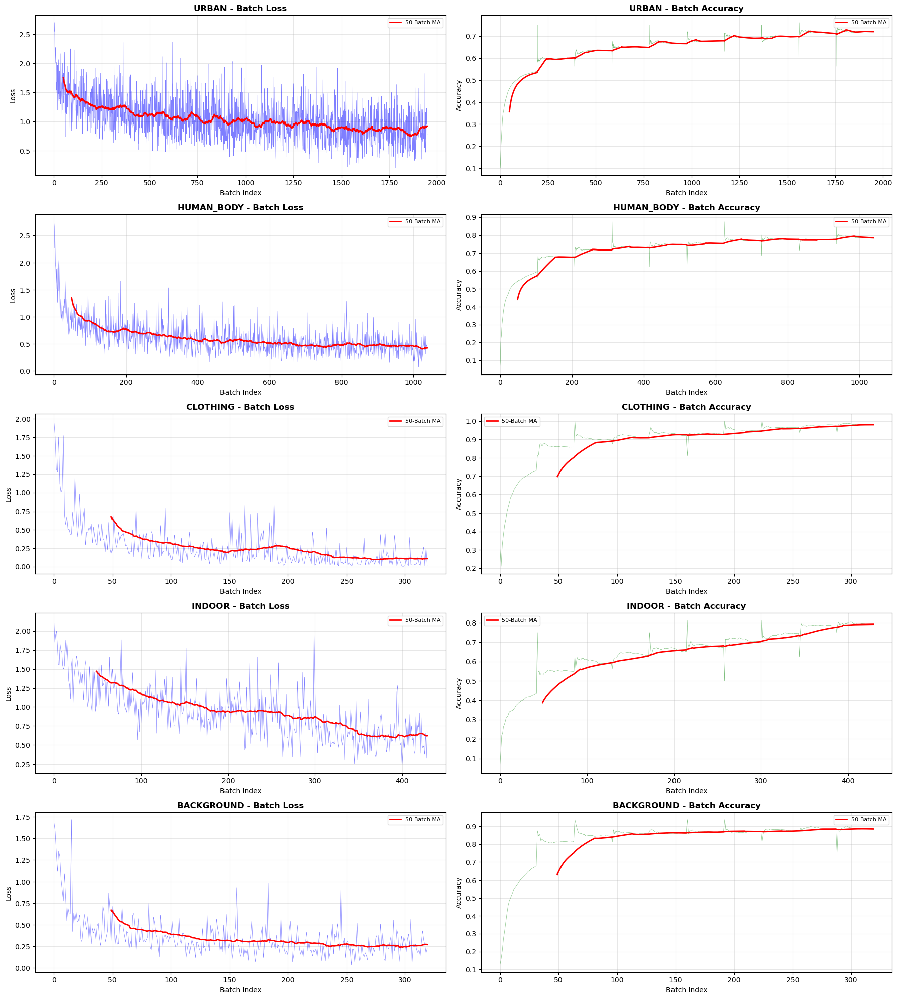


   ✅ Grafik kaydedildi: stage2_batch_metrics_all.png

2️⃣ Batch metrics istatistikleri:

Domain          Total Batch  Min Loss   Max Loss   Final 100 Avg Loss   Final 100 Avg Acc   
---------------------------------------------------------------------------------------------------------
URBAN                 1,950    0.2042    2.7046              0.8581              72.04%
HUMAN_BODY            1,040    0.0742    2.7519              0.4423              78.88%
CLOTHING                320    0.0050    1.9701              0.1103              97.35%
INDOOR                  430    0.2313    2.1368              0.6186              78.21%
BACKGROUND              320    0.0348    1.7180              0.2593              88.30%

3️⃣ Convergence analizi...


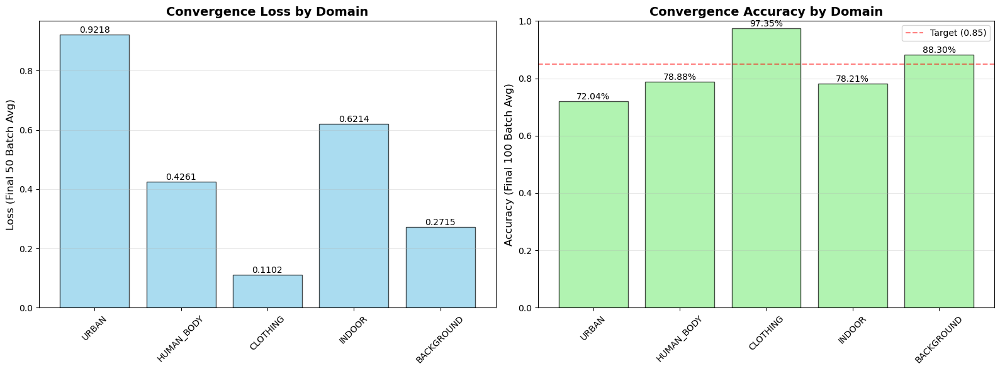

   ✅ Grafik kaydedildi: stage2_convergence_comparison.png

4️⃣ Epoch-level trend analizi...


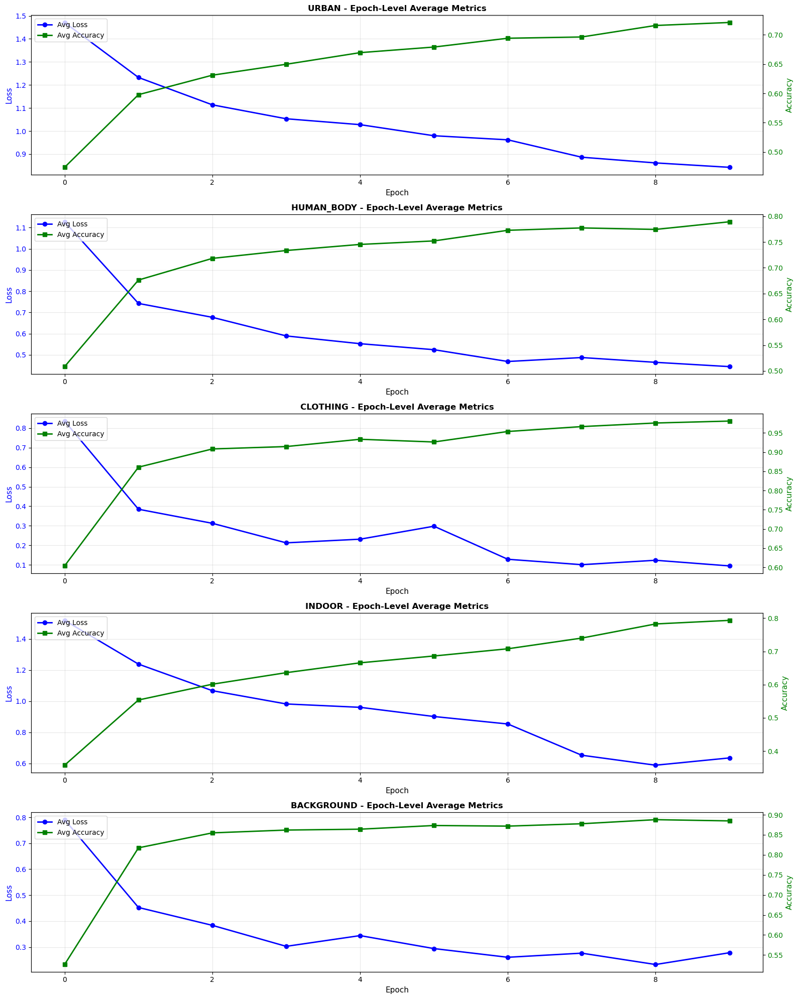

   ✅ Grafik kaydedildi: stage2_epoch_trends.png

📈 STAGE 2 BATCH METRICS ÖZET

✅ Kaydedilen Grafikler:
   1. stage2_batch_metrics_all.png - Tüm domainlerin batch grafikleri
   2. stage2_convergence_comparison.png - Convergence karşılaştırması
   3. stage2_epoch_trends.png - Epoch-level trendler

📊 En İyi Convergence:
   En düşük loss: CLOTHING (0.1102)
   En yüksek acc: CLOTHING (97.35%)

⚠️  Dikkat Edilmesi Gerekenler:
   • URBAN: Düşük accuracy (72.04%) - Yeniden eğitim gerekebilir

✅ STAGE 2 BATCH METRICS GÖRSELLEŞTİRME TAMAMLANDI


In [23]:
"""
📊 STAGE 2 BATCH METRICS GÖRSELLEŞTİRME

Stage 2 eğitimi bittikten sonra çalıştır.
Her domain'in batch-level metriklerini görselleştirir.
"""

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

print("\n" + "="*70)
print("📊 STAGE 2 - BATCH METRICS GÖRSELLEŞTİRME")
print("="*70)

# =============================================
# 1️⃣ TÜM DOMAIN'LERİN BATCH METRİKS GRAFİKLERİ
# =============================================

print("\n1️⃣ Her domain için batch metrics yükleniyor...")

fig, axes = plt.subplots(5, 2, figsize=(18, 20))
axes = axes.flatten()

all_domain_stats = {}

for idx, domain in enumerate(DOMAIN_NAMES):
    batch_csv_path = f"eğitim_sonuçları/{NOTEBOOK_NAME}/stage2_{domain.lower()}/logs/batch_metrics.csv"
    
    if not os.path.exists(batch_csv_path):
        print(f"   ⚠️  {domain}: CSV bulunamadı, atlanıyor")
        continue
    
    # CSV'yi yükle
    df_batch = pd.read_csv(batch_csv_path)
    train_batches = df_batch[df_batch['phase'] == 'train']
    
    print(f"   ✅ {domain}: {len(train_batches):,} batch kaydı")
    
    # İstatistikleri kaydet
    all_domain_stats[domain] = {
        'total_batches': len(train_batches),
        'min_loss': train_batches['loss'].min(),
        'max_loss': train_batches['loss'].max(),
        'final_100_avg_loss': train_batches['loss'].tail(100).mean(),
        'final_100_avg_acc': train_batches['accuracy'].tail(100).mean(),
        'convergence_loss': train_batches['loss'].tail(50).mean()
    }
    
    # Loss grafiği (sol)
    ax_loss = axes[idx * 2]
    ax_loss.plot(train_batches.index, train_batches['loss'], 
                 alpha=0.5, linewidth=0.5, color='blue')
    
    # Moving average
    window = 50
    if len(train_batches) > window:
        moving_avg = train_batches['loss'].rolling(window=window).mean()
        ax_loss.plot(train_batches.index, moving_avg, 
                    color='red', linewidth=2, label=f'{window}-Batch MA')
        ax_loss.legend(fontsize=8)
    
    ax_loss.set_title(f'{domain} - Batch Loss', fontsize=12, fontweight='bold')
    ax_loss.set_xlabel('Batch Index', fontsize=10)
    ax_loss.set_ylabel('Loss', fontsize=10)
    ax_loss.grid(True, alpha=0.3)
    
    # Accuracy grafiği (sağ)
    ax_acc = axes[idx * 2 + 1]
    ax_acc.plot(train_batches.index, train_batches['accuracy'], 
                alpha=0.5, linewidth=0.5, color='green')
    
    # Moving average
    if len(train_batches) > window:
        moving_avg = train_batches['accuracy'].rolling(window=window).mean()
        ax_acc.plot(train_batches.index, moving_avg, 
                   color='red', linewidth=2, label=f'{window}-Batch MA')
        ax_acc.legend(fontsize=8)
    
    ax_acc.set_title(f'{domain} - Batch Accuracy', fontsize=12, fontweight='bold')
    ax_acc.set_xlabel('Batch Index', fontsize=10)
    ax_acc.set_ylabel('Accuracy', fontsize=10)
    ax_acc.grid(True, alpha=0.3)

plt.tight_layout()

# Kaydet
plots_dir = f"eğitim_sonuçları/{NOTEBOOK_NAME}/plots"
os.makedirs(plots_dir, exist_ok=True)
plt.savefig(os.path.join(plots_dir, 'stage2_batch_metrics_all.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"\n   ✅ Grafik kaydedildi: stage2_batch_metrics_all.png")

# =============================================
# 2️⃣ BATCH METRİKS İSTATİSTİKLERİ
# =============================================

print("\n2️⃣ Batch metrics istatistikleri:")
print(f"\n{'Domain':<15} {'Total Batch':<12} {'Min Loss':<10} {'Max Loss':<10} {'Final 100 Avg Loss':<20} {'Final 100 Avg Acc':<20}")
print("-" * 105)

for domain in DOMAIN_NAMES:
    if domain not in all_domain_stats:
        continue
    
    stats = all_domain_stats[domain]
    print(f"{domain:<15} {stats['total_batches']:>11,} {stats['min_loss']:>9.4f} "
          f"{stats['max_loss']:>9.4f} {stats['final_100_avg_loss']:>19.4f} "
          f"{stats['final_100_avg_acc']:>19.2%}")

# =============================================
# 3️⃣ CONVERGENCE ANALİZİ
# =============================================

print("\n3️⃣ Convergence analizi...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Loss convergence karşılaştırması
domains_list = []
convergence_losses = []

for domain in DOMAIN_NAMES:
    if domain in all_domain_stats:
        domains_list.append(domain)
        convergence_losses.append(all_domain_stats[domain]['convergence_loss'])

bars = axes[0].bar(domains_list, convergence_losses, color='skyblue', alpha=0.7, edgecolor='black')
axes[0].set_ylabel('Loss (Final 50 Batch Avg)', fontsize=12)
axes[0].set_title('Convergence Loss by Domain', fontsize=14, fontweight='bold')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True, alpha=0.3, axis='y')

# Bar üzerine değerleri yaz
for bar, value in zip(bars, convergence_losses):
    axes[0].text(bar.get_x() + bar.get_width()/2., value,
                f'{value:.4f}',
                ha='center', va='bottom', fontsize=10)

# Accuracy convergence karşılaştırması
final_accs = [all_domain_stats[d]['final_100_avg_acc'] for d in domains_list]

bars = axes[1].bar(domains_list, final_accs, color='lightgreen', alpha=0.7, edgecolor='black')
axes[1].set_ylabel('Accuracy (Final 100 Batch Avg)', fontsize=12)
axes[1].set_title('Convergence Accuracy by Domain', fontsize=14, fontweight='bold')
axes[1].tick_params(axis='x', rotation=45)
axes[1].set_ylim([0, 1.0])
axes[1].axhline(y=0.85, color='red', linestyle='--', alpha=0.5, label='Target (0.85)')
axes[1].legend()
axes[1].grid(True, alpha=0.3, axis='y')

# Bar üzerine değerleri yaz
for bar, value in zip(bars, final_accs):
    axes[1].text(bar.get_x() + bar.get_width()/2., value,
                f'{value:.2%}',
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'stage2_convergence_comparison.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Grafik kaydedildi: stage2_convergence_comparison.png")

# =============================================
# 4️⃣ EPOCH-LEVEL TREND ANALİZİ
# =============================================

print("\n4️⃣ Epoch-level trend analizi...")

fig, axes = plt.subplots(5, 1, figsize=(16, 20))

for idx, domain in enumerate(DOMAIN_NAMES):
    if domain not in all_domain_stats:
        continue
    
    batch_csv_path = f"eğitim_sonuçları/{NOTEBOOK_NAME}/stage2_{domain.lower()}/logs/batch_metrics.csv"
    df_batch = pd.read_csv(batch_csv_path)
    train_batches = df_batch[df_batch['phase'] == 'train']
    
    # Epoch'a göre grupla
    epoch_stats = train_batches.groupby('epoch').agg({
        'loss': 'mean',
        'accuracy': 'mean'
    }).reset_index()
    
    ax = axes[idx]
    
    # Loss ve accuracy'yi aynı grafikte göster (dual axis)
    ax1 = ax
    ax2 = ax.twinx()
    
    line1 = ax1.plot(epoch_stats['epoch'], epoch_stats['loss'], 
                     color='blue', marker='o', linewidth=2, label='Avg Loss')
    ax1.set_xlabel('Epoch', fontsize=11)
    ax1.set_ylabel('Loss', fontsize=11, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True, alpha=0.3)
    
    line2 = ax2.plot(epoch_stats['epoch'], epoch_stats['accuracy'], 
                     color='green', marker='s', linewidth=2, label='Avg Accuracy')
    ax2.set_ylabel('Accuracy', fontsize=11, color='green')
    ax2.tick_params(axis='y', labelcolor='green')
    
    # Title
    ax1.set_title(f'{domain} - Epoch-Level Average Metrics', 
                  fontsize=12, fontweight='bold')
    
    # Legend
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper left', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'stage2_epoch_trends.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Grafik kaydedildi: stage2_epoch_trends.png")

# =============================================
# 5️⃣ ÖZET RAPOR
# =============================================

print("\n" + "="*70)
print("📈 STAGE 2 BATCH METRICS ÖZET")
print("="*70)

print("\n✅ Kaydedilen Grafikler:")
print("   1. stage2_batch_metrics_all.png - Tüm domainlerin batch grafikleri")
print("   2. stage2_convergence_comparison.png - Convergence karşılaştırması")
print("   3. stage2_epoch_trends.png - Epoch-level trendler")

print("\n📊 En İyi Convergence:")
best_loss_domain = min(all_domain_stats.items(), 
                       key=lambda x: x[1]['convergence_loss'])
print(f"   En düşük loss: {best_loss_domain[0]} ({best_loss_domain[1]['convergence_loss']:.4f})")

best_acc_domain = max(all_domain_stats.items(), 
                      key=lambda x: x[1]['final_100_avg_acc'])
print(f"   En yüksek acc: {best_acc_domain[0]} ({best_acc_domain[1]['final_100_avg_acc']:.2%})")

print("\n⚠️  Dikkat Edilmesi Gerekenler:")
for domain, stats in all_domain_stats.items():
    if stats['final_100_avg_acc'] < 0.75:
        print(f"   • {domain}: Düşük accuracy ({stats['final_100_avg_acc']:.2%}) - Yeniden eğitim gerekebilir")
    if stats['convergence_loss'] > 1.0:
        print(f"   • {domain}: Yüksek loss ({stats['convergence_loss']:.4f}) - Converge olmamış olabilir")

print("\n" + "="*70)
print("✅ STAGE 2 BATCH METRICS GÖRSELLEŞTİRME TAMAMLANDI")
print("="*70)


📈 GÖRSELLEŞTİRME


NameError: name 'history_s1' is not defined

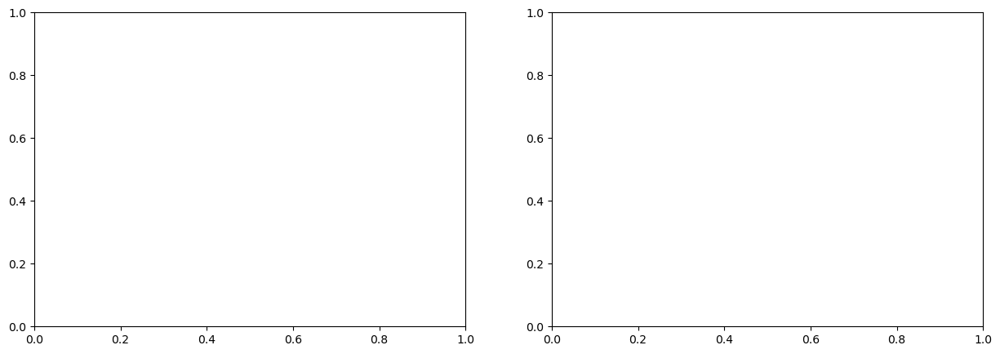

In [24]:
"""
📈 HÜCRE 10 - GÖRSELLEŞTİRME
"""

print("\n" + "="*70)
print("📈 GÖRSELLEŞTİRME")
print("="*70)

# Stage 1 grafikleri
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss
axes[0].plot(history_s1['train_loss'], label='Train Loss', marker='o')
axes[0].plot(history_s1['val_loss'], label='Val Loss', marker='s')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Stage 1: Domain Classifier - Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Accuracy
axes[1].plot([a*100 for a in history_s1['train_acc']], label='Train Acc', marker='o')
axes[1].plot([a*100 for a in history_s1['val_acc']], label='Val Acc', marker='s')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Stage 1: Domain Classifier - Accuracy')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
stage1_plot = os.path.join(stage1_folder['plots'], 'training_curves.png')
plt.savefig(stage1_plot, dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✅ Stage 1 grafik kaydedildi: {stage1_plot}")

# Stage 2 grafikleri (tüm domainler)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, domain in enumerate(DOMAIN_NAMES):
    history = domain_histories[domain]
    
    # Loss
    axes[idx].plot(history['train_loss'], label='Train', alpha=0.7)
    axes[idx].plot(history['val_loss'], label='Val', alpha=0.7)
    axes[idx].set_title(f'{domain} - Loss')
    axes[idx].set_xlabel('Epoch')
    axes[idx].set_ylabel('Loss')
    axes[idx].legend()
    axes[idx].grid(True, alpha=0.3)

# Son subplot'u gizle
axes[5].axis('off')

plt.tight_layout()
stage2_plot = os.path.join(create_training_folder(NOTEBOOK_NAME)['plots'], 'stage2_all_domains.png')
plt.savefig(stage2_plot, dpi=150, bbox_inches='tight')
plt.show()

print(f"✅ Stage 2 grafik kaydedildi: {stage2_plot}")

# Accuracy karşılaştırması
domain_accs = [max(domain_histories[d]['val_acc'])*100 for d in DOMAIN_NAMES]

plt.figure(figsize=(10, 6))
bars = plt.bar(range(len(DOMAIN_NAMES)), domain_accs, color='steelblue', alpha=0.7)
plt.xticks(range(len(DOMAIN_NAMES)), DOMAIN_NAMES, rotation=45, ha='right')
plt.ylabel('Best Validation Accuracy (%)')
plt.title('Stage 2: Domain-specific Model Performances')
plt.grid(True, alpha=0.3, axis='y')

# Bar üzerine değer yaz
for bar, acc in zip(bars, domain_accs):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
             f'{acc:.1f}%', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
comparison_plot = os.path.join(create_training_folder(NOTEBOOK_NAME)['plots'], 'domain_accuracy_comparison.png')
plt.savefig(comparison_plot, dpi=150, bbox_inches='tight')
plt.show()

print(f"✅ Karşılaştırma grafiği kaydedildi: {comparison_plot}")

print("\n" + "="*70)
print("✅ TÜM GRAFİKLER OLUŞTURULDU")
print("="*70)

In [25]:
"""
💾 HÜCRE 11 - CONFIG KAYDETME
Tüm eğitim bilgilerini JSON'a kaydet (inference için gerekli)
"""

import json
from datetime import datetime

print("\n" + "="*70)
print("💾 HİYERARŞİK CONFIG KAYDETME")
print("="*70)

# =============================================
# 📂 KLASÖR OLUŞTUR
# =============================================

config_folder = create_training_folder(f"{NOTEBOOK_NAME}")
config_path = os.path.join(config_folder['data'], 'hierarchical_config.json')

# =============================================
# 📊 STAGE 1 BİLGİLERİNİ YÜKLE
# =============================================

print("\n1️⃣ Stage 1 bilgileri yükleniyor...")

stage1_checkpoint_path = os.path.join(config_folder['base'], 'stage1_domain', 'models', 'best_model.pth')

if os.path.exists(stage1_checkpoint_path):
    stage1_checkpoint = torch.load(stage1_checkpoint_path, map_location='cpu')
    
    # Checkpoint'ten yükle
    domain_to_label = stage1_checkpoint.get('domain_to_label', {})
    label_to_domain = stage1_checkpoint.get('label_to_domain', {})
    best_val_acc_s1 = stage1_checkpoint.get('val_acc', 0.0)
    
    print(f"   ✅ Stage 1 checkpoint yüklendi")
    print(f"   Best Val Acc: {best_val_acc_s1*100:.2f}%")
else:
    print(f"   ⚠️  Stage 1 checkpoint bulunamadı: {stage1_checkpoint_path}")
    # Varsayılan değerler
    domain_to_label = {domain: idx for idx, domain in enumerate(DOMAIN_NAMES)}
    label_to_domain = {idx: domain for domain, idx in domain_to_label.items()}
    best_val_acc_s1 = 0.0

# =============================================
# 📊 STAGE 2 BİLGİLERİNİ YÜKLE
# =============================================

print("\n2️⃣ Stage 2 bilgileri yükleniyor...")

stage2_info = {}

for domain in DOMAIN_NAMES:
    domain_checkpoint_path = os.path.join(config_folder['base'], 
                                          f'stage2_{domain.lower()}', 
                                          'models', 'best_model.pth')
    
    if os.path.exists(domain_checkpoint_path):
        checkpoint = torch.load(domain_checkpoint_path, map_location='cpu')
        
        stage2_info[domain] = {
            'num_masks': checkpoint.get('num_masks', 0),
            'mask_to_label': checkpoint.get('mask_to_label', {}),
            'label_to_mask': checkpoint.get('label_to_mask', {}),
            'model_path': domain_checkpoint_path.replace('\\', '/'),
            'best_val_acc': checkpoint.get('val_acc', 0.0)
        }
        
        print(f"   ✅ {domain}: {checkpoint.get('num_masks', 0)} masks, "
              f"Acc={checkpoint.get('val_acc', 0)*100:.2f}%")
    else:
        print(f"   ⚠️  {domain}: Checkpoint bulunamadı")

# =============================================
# 🗂️ CONFIG OLUŞTUR
# =============================================

print("\n3️⃣ Config oluşturuluyor...")

# Toplam mask sayısı
total_masks = sum([len(masks) for masks in DOMAIN_CATEGORIES.values()])

# JSON-serializable label to domain (string keys)
label_to_domain_str = {str(k): v for k, v in label_to_domain.items()}

hierarchical_config = {
    'metadata': {
        'created_at': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
        'notebook': NOTEBOOK_NAME,
        'stage1_epochs': NUM_EPOCHS_STAGE1,
        'stage2_epochs': NUM_EPOCHS_STAGE2,
        'batch_size': BATCH_SIZE,
        'learning_rate': LEARNING_RATE,
        'image_size': IMG_SIZE,
        'val_split': VAL_SPLIT
    },
    'stage1': {
        'num_domains': len(DOMAIN_NAMES),
        'domain_to_label': domain_to_label,
        'label_to_domain': label_to_domain_str,
        'model_path': stage1_checkpoint_path.replace('\\', '/'),
        'best_val_acc': float(best_val_acc_s1)
    },
    'stage2': stage2_info,
    'domain_categories': DOMAIN_CATEGORIES,
    'statistics': {
        'total_domains': len(DOMAIN_NAMES),
        'total_masks': total_masks,
        'coverage_estimate': 0.77,  # Top-50 eşdeğer
        'total_samples_used': len(df_with_domain) if 'df_with_domain' in globals() else 0
    }
}

# JSON'a kaydet
with open(config_path, 'w', encoding='utf-8') as f:
    json.dump(hierarchical_config, f, indent=2, ensure_ascii=False)

print(f"   ✅ Config kaydedildi: {config_path}")

# =============================================
# 📊 ÖZET RAPOR
# =============================================

print("\n" + "="*70)
print("📈 HİYERARŞİK SİSTEM ÖZET RAPORU")
print("="*70)

print(f"\n🎯 Stage 1 (Domain Classification):")
print(f"   Domains: {len(DOMAIN_NAMES)}")
print(f"   Best Val Acc: {best_val_acc_s1*100:.2f}%")
print(f"   Model: {stage1_checkpoint_path}")

print(f"\n🎯 Stage 2 (Mask Detection):")
for domain, info in stage2_info.items():
    print(f"   {domain:<15}: {info['num_masks']:>2} masks, Acc={info['best_val_acc']*100:>6.2f}%")

print(f"\n📊 Toplam:")
print(f"   Domains: {len(DOMAIN_NAMES)}")
print(f"   Masks: {total_masks}")
print(f"   Coverage: ~77% (Top-50 eşdeğer)")

if len(stage2_info) > 0:
    avg_acc = sum([info['best_val_acc'] for info in stage2_info.values()]) / len(stage2_info)
    print(f"   Avg Stage 2 Acc: {avg_acc*100:.2f}%")

print(f"\n💾 Config dosyası: {config_path}")
print(f"   Inference için hazır!")

print("\n" + "="*70)
print("✅ HİYERARŞİK MASK DETECTION SİSTEMİ TAMAMLANDI!")
print("="*70)

print("\n🎉 Sonraki adım:")
print("   hierarchical_inference.ipynb ile tahmin yapabilirsin!")


💾 HİYERARŞİK CONFIG KAYDETME
✅ Klasör yapısı oluşturuldu: eğitim_sonuçları\hierarchical_mask_detection

1️⃣ Stage 1 bilgileri yükleniyor...
   ✅ Stage 1 checkpoint yüklendi
   Best Val Acc: 86.01%

2️⃣ Stage 2 bilgileri yükleniyor...


C:\Users\emrec\AppData\Local\Temp\ipykernel_14388\724781406.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  stage1_checkpoint = torch.load(stage1_checkpoint_path, map_l

   ✅ URBAN: 15 masks, Acc=68.68%
   ✅ HUMAN_BODY: 14 masks, Acc=77.06%
   ✅ CLOTHING: 7 masks, Acc=91.34%
   ✅ INDOOR: 8 masks, Acc=66.94%
   ✅ BACKGROUND: 5 masks, Acc=89.64%

3️⃣ Config oluşturuluyor...
   ✅ Config kaydedildi: eğitim_sonuçları\hierarchical_mask_detection\veriler\hierarchical_config.json

📈 HİYERARŞİK SİSTEM ÖZET RAPORU

🎯 Stage 1 (Domain Classification):
   Domains: 5
   Best Val Acc: 86.01%
   Model: eğitim_sonuçları\hierarchical_mask_detection\stage1_domain\models\best_model.pth

🎯 Stage 2 (Mask Detection):
   URBAN          : 15 masks, Acc= 68.68%
   HUMAN_BODY     : 14 masks, Acc= 77.06%
   CLOTHING       :  7 masks, Acc= 91.34%
   INDOOR         :  8 masks, Acc= 66.94%
   BACKGROUND     :  5 masks, Acc= 89.64%

📊 Toplam:
   Domains: 5
   Masks: 49
   Coverage: ~77% (Top-50 eşdeğer)
   Avg Stage 2 Acc: 78.73%

💾 Config dosyası: eğitim_sonuçları\hierarchical_mask_detection\veriler\hierarchical_config.json
   Inference için hazır!

✅ HİYERARŞİK MASK DETECTION SİSTE

In [ ]:
"""
🧪 STAGE 1 TEST VE CONFUSION MATRIX
Domain Classification için kapsamlı test ve değerlendirme
"""

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support
from tqdm.auto import tqdm
import os

print("\n" + "="*70)
print("🧪 STAGE 1 - DOMAIN CLASSIFICATION TEST")
print("="*70)

# =============================================
# 1️⃣ MODEL VE VERİ HAZIRLIĞI
# =============================================

print("\n1️⃣ Model ve veri yükleniyor...")

# Stage 1 model yükle
stage1_checkpoint_path = os.path.join(
    "eğitim_sonuçları", NOTEBOOK_NAME, "stage1_domain", "models", "best_model.pth"
)

if not os.path.exists(stage1_checkpoint_path):
    print(f"❌ Model bulunamadı: {stage1_checkpoint_path}")
    raise FileNotFoundError("Stage 1 model checkpoint bulunamadı!")

checkpoint = torch.load(stage1_checkpoint_path, map_location=device)

# Model oluştur ve yükle
model_s1 = DomainClassifier(num_domains=NUM_DOMAINS).to(device)
model_s1.load_state_dict(checkpoint['model_state_dict'])
model_s1.eval()

# Mappings
domain_to_label = checkpoint['domain_to_label']
label_to_domain_raw = checkpoint['label_to_domain']

# Key tipini normalize et (hem int hem str key'i destekle)
label_to_domain = {}
for key, value in label_to_domain_raw.items():
    # Hem integer hem string key ekle
    if isinstance(key, str):
        label_to_domain[int(key)] = value
        label_to_domain[key] = value
    else:
        label_to_domain[key] = value
        label_to_domain[str(key)] = value

print(f"   ✅ Model yüklendi: {stage1_checkpoint_path}")
print(f"   Best Val Acc: {checkpoint.get('val_acc', 0)*100:.2f}%")
print(f"   Epoch: {checkpoint.get('epoch', 0)}")
print(f"   Domain sayısı: {len(set(label_to_domain.values()))}")

# =============================================
# 2️⃣ VALIDATION SET ÜZERİNDE TAHMİN
# =============================================

print("\n2️⃣ Validation set üzerinde tahminler yapılıyor...")

all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for images, labels in tqdm(val_loader_s1, desc="Testing"):
        images = images.to(device)
        outputs = model_s1(images)
        
        # Softmax probabilities
        probs = torch.softmax(outputs, dim=1)
        
        # Predictions
        _, predicted = torch.max(outputs, 1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_probs.extend(probs.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
all_probs = np.array(all_probs)

print(f"   ✅ {len(all_preds):,} örnek test edildi")

# =============================================
# 3️⃣ CONFUSION MATRIX (5×5)
# =============================================

print("\n3️⃣ Confusion matrix hesaplanıyor...")

# Confusion matrix hesapla
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Domain isimleri (integer key kullan)
domain_names = [label_to_domain[i] for i in range(NUM_DOMAINS)]

# Görselleştir
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Sol: Ham sayılar
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=domain_names, yticklabels=domain_names,
            ax=axes[0], cbar_kws={'label': 'Count'}, annot_kws={'size': 12})
axes[0].set_xlabel('Predicted Domain', fontsize=13, fontweight='bold')
axes[0].set_ylabel('True Domain', fontsize=13, fontweight='bold')
axes[0].set_title('Stage 1 Confusion Matrix (Counts)', fontsize=15, fontweight='bold')

# Sağ: Yüzdeler
sns.heatmap(cm_normalized, annot=True, fmt='.1f', cmap='RdYlGn',
            xticklabels=domain_names, yticklabels=domain_names,
            ax=axes[1], cbar_kws={'label': 'Percentage (%)'}, 
            annot_kws={'size': 12}, vmin=0, vmax=100)
axes[1].set_xlabel('Predicted Domain', fontsize=13, fontweight='bold')
axes[1].set_ylabel('True Domain', fontsize=13, fontweight='bold')
axes[1].set_title('Stage 1 Confusion Matrix (Percentages)', fontsize=15, fontweight='bold')

plt.tight_layout()

# Kaydet
plots_folder = os.path.join("eğitim_sonuçları", NOTEBOOK_NAME, "test_results", "plots")
os.makedirs(plots_folder, exist_ok=True)
plt.savefig(os.path.join(plots_folder, 'stage1_confusion_matrix.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Confusion matrix kaydedildi")

# =============================================
# 4️⃣ CLASSIFICATION REPORT
# =============================================

print("\n4️⃣ Classification report hesaplanıyor...")

# Sklearn classification report
report = classification_report(all_labels, all_preds, 
                               target_names=domain_names,
                               output_dict=True,
                               zero_division=0)

# DataFrame'e çevir
report_df = pd.DataFrame(report).transpose()

# Konsola yazdır
print("\n📊 STAGE 1 - DOMAIN CLASSIFICATION REPORT:")
print("="*80)
print(f"{'Domain':<15} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
print("="*80)

for domain in domain_names:
    if domain in report:
        p = report[domain]['precision']
        r = report[domain]['recall']
        f1 = report[domain]['f1-score']
        s = int(report[domain]['support'])
        print(f"{domain:<15} {p:>10.4f} {r:>10.4f} {f1:>10.4f} {s:>10,}")

print("="*80)
print(f"{'Overall Accuracy':<15} {report['accuracy']:>41.4f}")
print(f"{'Macro Avg':<15} {report['macro avg']['precision']:>10.4f} "
      f"{report['macro avg']['recall']:>10.4f} "
      f"{report['macro avg']['f1-score']:>10.4f}")
print(f"{'Weighted Avg':<15} {report['weighted avg']['precision']:>10.4f} "
      f"{report['weighted avg']['recall']:>10.4f} "
      f"{report['weighted avg']['f1-score']:>10.4f}")
print("="*80)

# CSV'ye kaydet
report_csv_path = os.path.join("eğitim_sonuçları", NOTEBOOK_NAME, 
                                "test_results", "stage1_classification_report.csv")
os.makedirs(os.path.dirname(report_csv_path), exist_ok=True)
report_df.to_csv(report_csv_path)
print(f"\n   ✅ Report kaydedildi: {report_csv_path}")

# =============================================
# 5️⃣ DOMAIN BAZINDA PERFORMANS GRAFİĞİ
# =============================================

print("\n5️⃣ Domain bazında performans grafiği oluşturuluyor...")

fig, ax = plt.subplots(1, 1, figsize=(14, 7))

x = np.arange(len(domain_names))
width = 0.25

# Precision, Recall, F1-Score bar'ları
precisions = [report[d]['precision'] for d in domain_names]
recalls = [report[d]['recall'] for d in domain_names]
f1_scores = [report[d]['f1-score'] for d in domain_names]

bars1 = ax.bar(x - width, precisions, width, label='Precision', color='skyblue', edgecolor='black')
bars2 = ax.bar(x, recalls, width, label='Recall', color='lightgreen', edgecolor='black')
bars3 = ax.bar(x + width, f1_scores, width, label='F1-Score', color='salmon', edgecolor='black')

# Target line
ax.axhline(y=0.90, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Target (0.90)')

# Labels
ax.set_xlabel('Domain', fontsize=13, fontweight='bold')
ax.set_ylabel('Score', fontsize=13, fontweight='bold')
ax.set_title('Stage 1 - Domain Classification Performance', fontsize=15, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(domain_names, rotation=45, ha='right')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3, axis='y')
ax.set_ylim([0, 1.0])

# Bar üzerine değerleri yaz
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}',
                ha='center', va='bottom', fontsize=9, rotation=0)

plt.tight_layout()
plt.savefig(os.path.join(plots_folder, 'stage1_domain_performance.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Performans grafiği kaydedildi")

# =============================================
# 6️⃣ EN KARIŞTIRILAN DOMAIN ÇİFTLERİ
# =============================================

print("\n6️⃣ En karıştırılan domain çiftleri...")

confusions = []
for i in range(len(domain_names)):
    for j in range(len(domain_names)):
        if i != j and cm[i, j] > 0:
            confusions.append({
                'True': domain_names[i],
                'Predicted': domain_names[j],
                'Count': cm[i, j],
                'Percentage': cm_normalized[i, j]
            })

# En çok karıştırılan top-10
confusions_sorted = sorted(confusions, key=lambda x: x['Count'], reverse=True)[:10]

print("\n📊 Top-10 En Karıştırılan Domain Çiftleri:")
print("="*70)
print(f"{'True Domain':<15} {'→':>3} {'Predicted Domain':<15} {'Count':>8} {'%':>8}")
print("="*70)

for conf in confusions_sorted:
    print(f"{conf['True']:<15} {'→':>3} {conf['Predicted']:<15} "
          f"{conf['Count']:>8,} {conf['Percentage']:>7.2f}%")

print("="*70)

# =============================================
# 7️⃣ CONFIDENCE DISTRIBUTION
# =============================================

print("\n7️⃣ Prediction confidence analizi...")

# Her tahmin için max probability
max_probs = np.max(all_probs, axis=1)

# Doğru ve yanlış tahminler
correct_mask = (all_preds == all_labels)
correct_probs = max_probs[correct_mask]
incorrect_probs = max_probs[~correct_mask]

# Histogram
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

ax.hist(correct_probs, bins=50, alpha=0.7, color='green', 
        label=f'Correct ({len(correct_probs):,})', edgecolor='black')
ax.hist(incorrect_probs, bins=50, alpha=0.7, color='red', 
        label=f'Incorrect ({len(incorrect_probs):,})', edgecolor='black')

ax.axvline(x=0.9, color='blue', linestyle='--', linewidth=2, 
          label='High Confidence (0.9)')

ax.set_xlabel('Prediction Confidence (Max Softmax Probability)', fontsize=12, fontweight='bold')
ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
ax.set_title('Stage 1 - Prediction Confidence Distribution', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(plots_folder, 'stage1_confidence_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Confidence distribution kaydedildi")

# İstatistikler
print(f"\n   Doğru tahminler için ortalama confidence: {correct_probs.mean():.4f}")
print(f"   Yanlış tahminler için ortalama confidence: {incorrect_probs.mean():.4f}")
print(f"   Yüksek confidence (>0.9) doğru tahminler: {(correct_probs > 0.9).sum():,} "
      f"({(correct_probs > 0.9).sum() / len(correct_probs) * 100:.2f}%)")

# =============================================
# 8️⃣ ÖZET SONUÇLAR
# =============================================

print("\n" + "="*70)
print("📈 STAGE 1 TEST SONUÇLARI ÖZET")
print("="*70)

print(f"\n✅ Genel Performans:")
print(f"   Toplam test örnekleri: {len(all_preds):,}")
print(f"   Overall Accuracy: {report['accuracy']*100:.2f}%")
print(f"   Macro Avg F1-Score: {report['macro avg']['f1-score']:.4f}")
print(f"   Weighted Avg F1-Score: {report['weighted avg']['f1-score']:.4f}")

print(f"\n🎯 En İyi Performans:")
best_f1_domain = max(domain_names, key=lambda d: report[d]['f1-score'])
print(f"   Domain: {best_f1_domain}")
print(f"   F1-Score: {report[best_f1_domain]['f1-score']:.4f}")
print(f"   Accuracy: {cm[domain_names.index(best_f1_domain), domain_names.index(best_f1_domain)] / cm[domain_names.index(best_f1_domain)].sum():.4f}")

print(f"\n⚠️  En Düşük Performans:")
worst_f1_domain = min(domain_names, key=lambda d: report[d]['f1-score'])
print(f"   Domain: {worst_f1_domain}")
print(f"   F1-Score: {report[worst_f1_domain]['f1-score']:.4f}")
print(f"   Accuracy: {cm[domain_names.index(worst_f1_domain), domain_names.index(worst_f1_domain)] / cm[domain_names.index(worst_f1_domain)].sum():.4f}")

print(f"\n📊 Kaydedilen Dosyalar:")
print(f"   • stage1_confusion_matrix.png")
print(f"   • stage1_domain_performance.png")
print(f"   • stage1_confidence_distribution.png")
print(f"   • stage1_classification_report.csv")

print("\n" + "="*70)
print("✅ STAGE 1 TEST TAMAMLANDI!")
print("="*70)


🧪 STAGE 2 - MASK DETECTION TEST (Domain-Specific)

1️⃣ Stage 2 modelleri yükleniyor...

🎯 DOMAIN: URBAN


C:\Users\emrec\AppData\Local\Temp\ipykernel_14388\3875328455.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

   ✅ Model yüklendi
   Mask sayısı: 15
   Best Val Acc: 68.68%

   Testing...


URBAN Test:   0%|          | 0/488 [00:00<?, ?it/s]

   ✅ 7,797 örnek test edildi

   Confusion matrix hesaplanıyor...


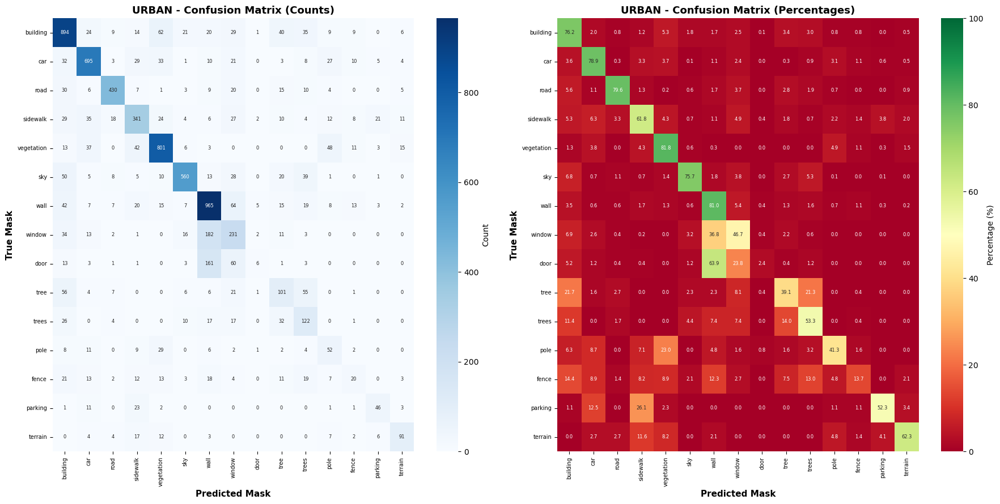

   ✅ Confusion matrix kaydedildi

   Classification report...

   📊 URBAN CLASSIFICATION REPORT:
   ────────────────────────────────────────────────────────────
   Mask                  Precision     Recall         F1
   ────────────────────────────────────────────────────────────
   building                  0.716      0.762      0.738
   car                       0.801      0.789      0.795
   road                      0.869      0.796      0.831
   sidewalk                  0.655      0.618      0.636
   vegetation                0.799      0.818      0.809
   sky                       0.875      0.757      0.812
   wall                      0.680      0.810      0.739
   window                    0.441      0.467      0.453
   door                      0.333      0.024      0.044
   tree                      0.387      0.391      0.389
   trees                     0.380      0.533      0.444
   pole                      0.295      0.413      0.344
   fence                     0.256

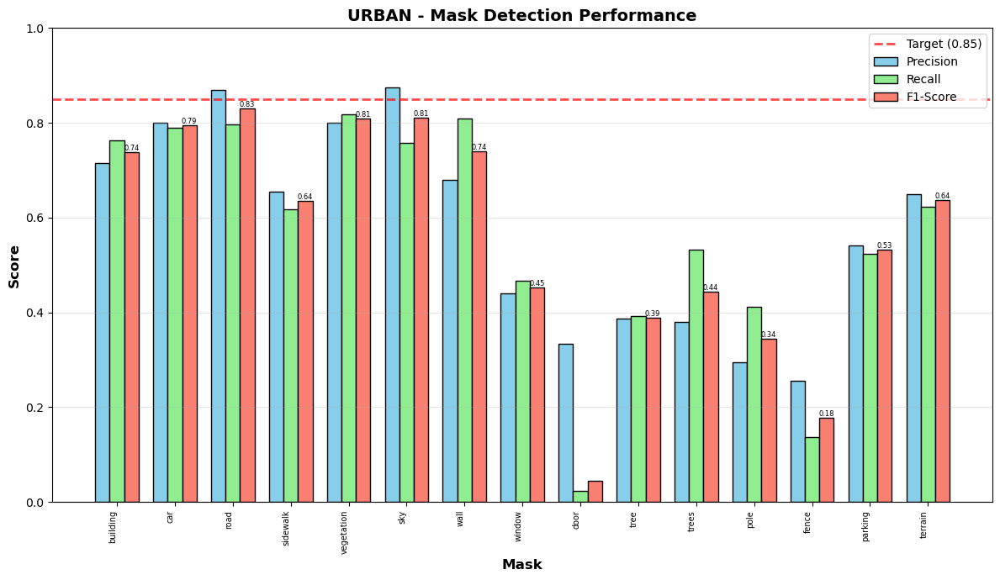

   ✅ Performans grafiği kaydedildi

   ✅ URBAN test tamamlandı!
   Test edilen mask sayısı: 15/15

🎯 DOMAIN: HUMAN_BODY


C:\Users\emrec\AppData\Local\Temp\ipykernel_14388\3875328455.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

   ✅ Model yüklendi
   Mask sayısı: 14
   Best Val Acc: 77.06%

   Testing...


HUMAN_BODY Test:   0%|          | 0/261 [00:00<?, ?it/s]

   ✅ 4,163 örnek test edildi

   Confusion matrix hesaplanıyor...


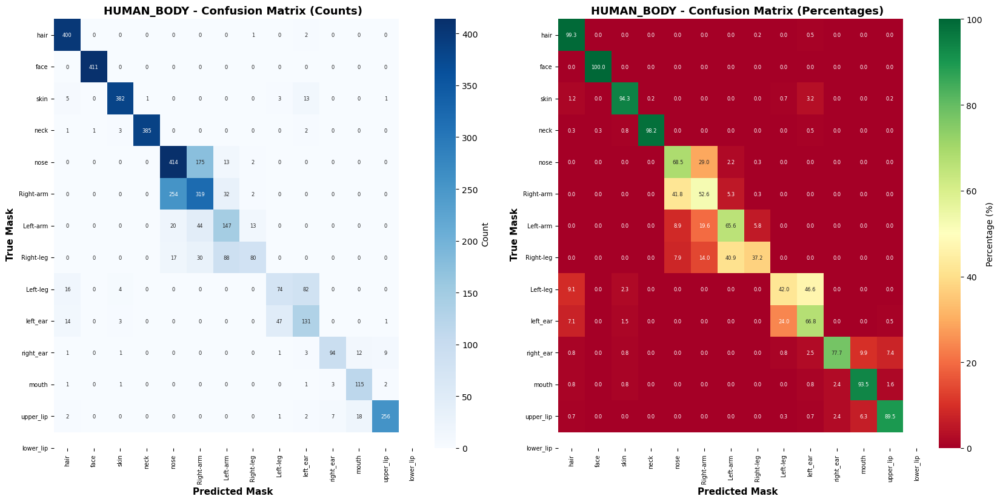

   ✅ Confusion matrix kaydedildi

   Classification report...

   📊 HUMAN_BODY CLASSIFICATION REPORT:
   ────────────────────────────────────────────────────────────
   Mask                  Precision     Recall         F1
   ────────────────────────────────────────────────────────────
   hair                      0.909      0.993      0.949
   skin                      0.998      1.000      0.999
   neck                      0.970      0.943      0.956
   nose                      0.997      0.982      0.990
   Right-arm                 0.587      0.685      0.633
   Left-arm                  0.562      0.526      0.543
   Right-leg                 0.525      0.656      0.583
   Left-leg                  0.816      0.372      0.511
   left_ear                  0.587      0.420      0.490
   right_ear                 0.555      0.668      0.606
   mouth                     0.904      0.777      0.836
   upper_lip                 0.793      0.935      0.858
   lower_lip                 

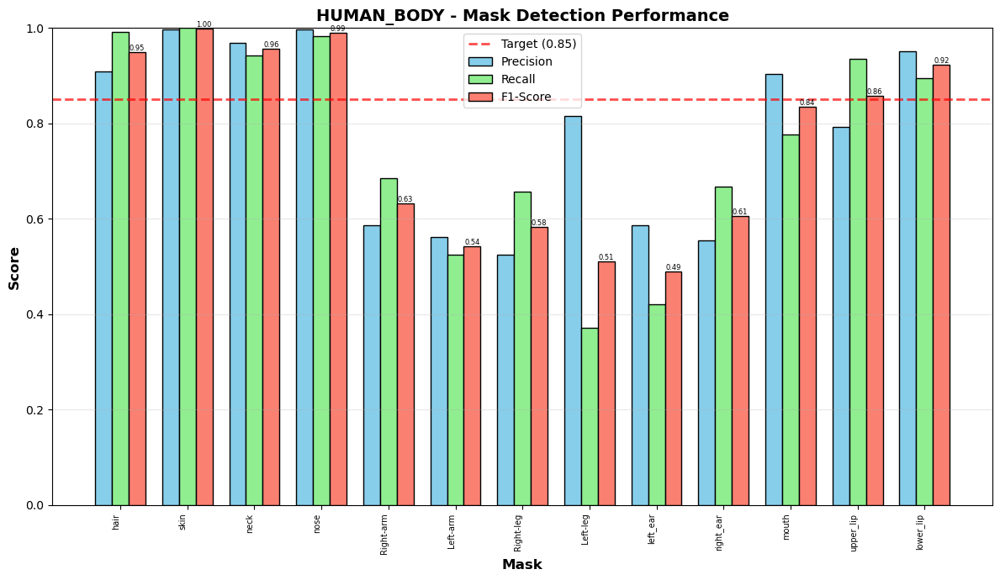

   ✅ Performans grafiği kaydedildi

   ✅ HUMAN_BODY test tamamlandı!
   Test edilen mask sayısı: 13/14
   ⚠️  Test setinde bulunmayan mask'lar: face

🎯 DOMAIN: CLOTHING


C:\Users\emrec\AppData\Local\Temp\ipykernel_14388\3875328455.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

   ✅ Model yüklendi
   Mask sayısı: 7
   Best Val Acc: 91.34%

   Testing...


CLOTHING Test:   0%|          | 0/80 [00:00<?, ?it/s]

   ✅ 1,270 örnek test edildi

   Confusion matrix hesaplanıyor...


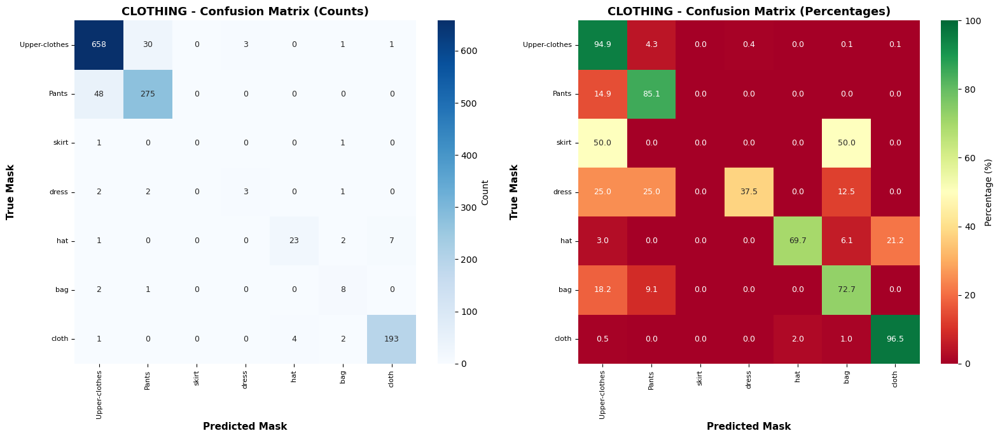

   ✅ Confusion matrix kaydedildi

   Classification report...

   📊 CLOTHING CLASSIFICATION REPORT:
   ────────────────────────────────────────────────────────────
   Mask                  Precision     Recall         F1
   ────────────────────────────────────────────────────────────
   Upper-clothes             0.923      0.949      0.936
   Pants                     0.893      0.851      0.872
   skirt                     0.000      0.000      0.000
   dress                     0.500      0.375      0.429
   hat                       0.852      0.697      0.767
   bag                       0.533      0.727      0.615
   cloth                     0.960      0.965      0.963
   ────────────────────────────────────────────────────────────
   Overall Accuracy                             0.9134
   ────────────────────────────────────────────────────────────

   Performans grafiği...


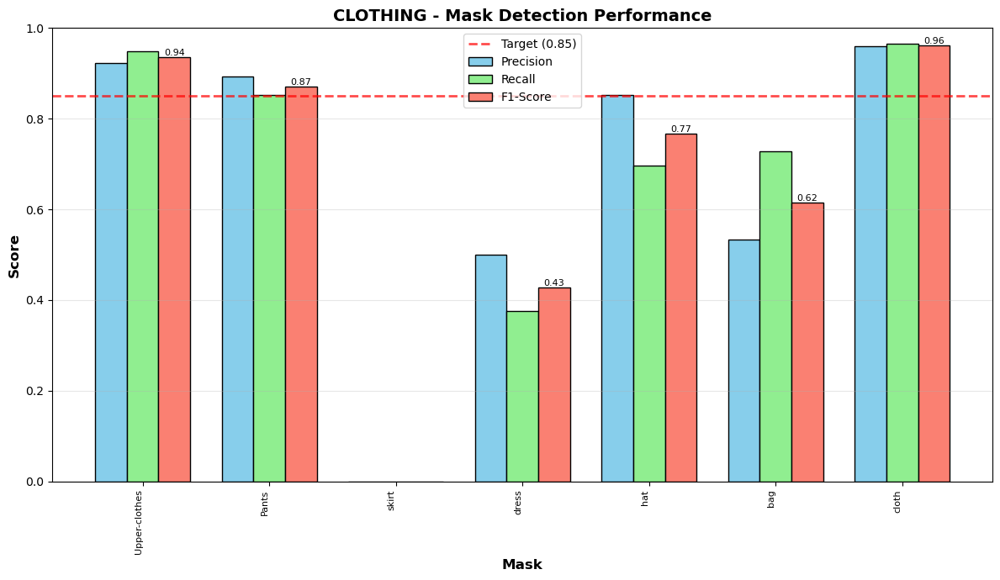

   ✅ Performans grafiği kaydedildi

   ✅ CLOTHING test tamamlandı!
   Test edilen mask sayısı: 7/7

🎯 DOMAIN: INDOOR


C:\Users\emrec\AppData\Local\Temp\ipykernel_14388\3875328455.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

   ✅ Model yüklendi
   Mask sayısı: 8
   Best Val Acc: 66.94%

   Testing...


INDOOR Test:   0%|          | 0/108 [00:00<?, ?it/s]

   ✅ 1,718 örnek test edildi

   Confusion matrix hesaplanıyor...


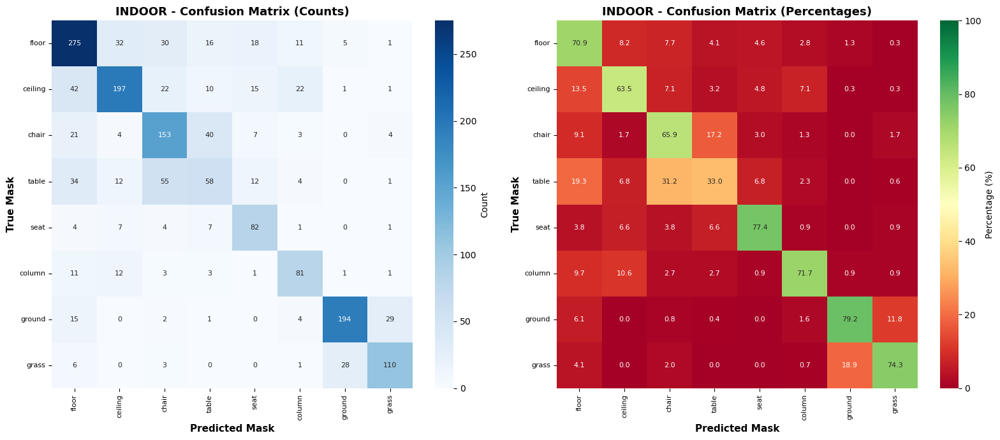

   ✅ Confusion matrix kaydedildi

   Classification report...

   📊 INDOOR CLASSIFICATION REPORT:
   ────────────────────────────────────────────────────────────
   Mask                  Precision     Recall         F1
   ────────────────────────────────────────────────────────────
   floor                     0.674      0.709      0.691
   ceiling                   0.746      0.635      0.686
   chair                     0.562      0.659      0.607
   table                     0.430      0.330      0.373
   seat                      0.607      0.774      0.680
   column                    0.638      0.717      0.675
   ground                    0.847      0.792      0.819
   grass                     0.743      0.743      0.743
   ────────────────────────────────────────────────────────────
   Overall Accuracy                             0.6694
   ────────────────────────────────────────────────────────────

   Performans grafiği...


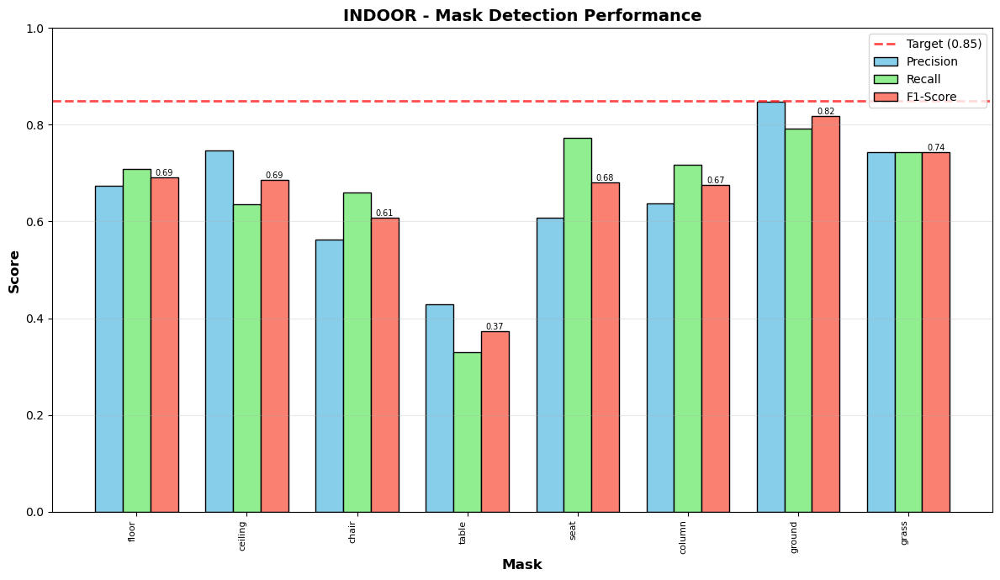

   ✅ Performans grafiği kaydedildi

   ✅ INDOOR test tamamlandı!
   Test edilen mask sayısı: 8/8

🎯 DOMAIN: BACKGROUND


C:\Users\emrec\AppData\Local\Temp\ipykernel_14388\3875328455.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

   ✅ Model yüklendi
   Mask sayısı: 5
   Best Val Acc: 89.64%

   Testing...


BACKGROUND Test:   0%|          | 0/80 [00:00<?, ?it/s]

   ✅ 1,274 örnek test edildi

   Confusion matrix hesaplanıyor...


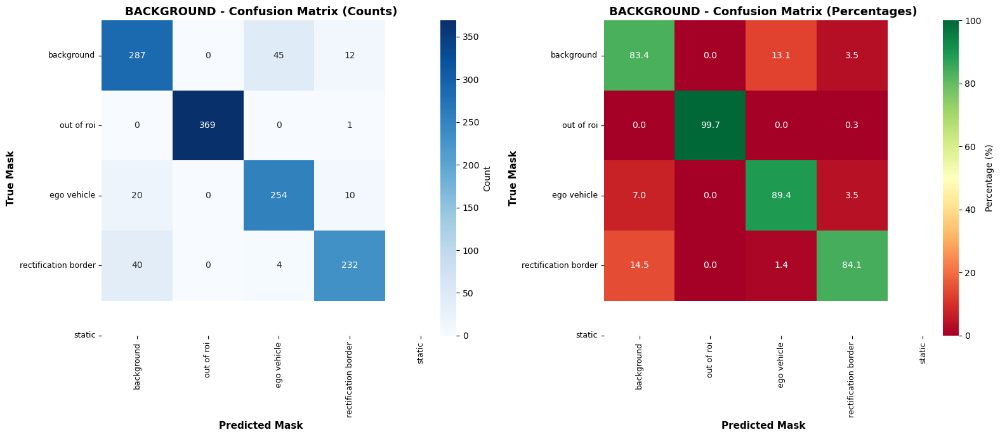

   ✅ Confusion matrix kaydedildi

   Classification report...

   📊 BACKGROUND CLASSIFICATION REPORT:
   ────────────────────────────────────────────────────────────
   Mask                  Precision     Recall         F1
   ────────────────────────────────────────────────────────────
   out of roi                0.827      0.834      0.831
   ego vehicle               1.000      0.997      0.999
   rectification border      0.838      0.894      0.865
   static                    0.910      0.841      0.874
   ────────────────────────────────────────────────────────────
   Overall Accuracy                             0.8964
   ────────────────────────────────────────────────────────────

   Performans grafiği...


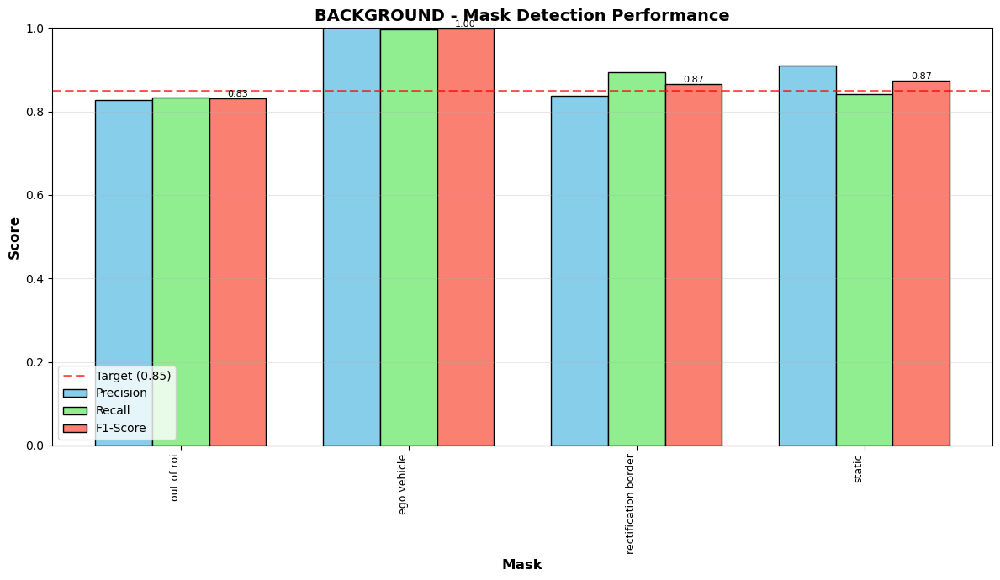

   ✅ Performans grafiği kaydedildi

   ✅ BACKGROUND test tamamlandı!
   Test edilen mask sayısı: 4/5
   ⚠️  Test setinde bulunmayan mask'lar: background

📊 STAGE 2 - TÜM DOMAIN'LER ÖZET

📈 Domain Bazında Sonuçlar:
──────────────────────────────────────────────────────────────────────────────────────────
Domain           Masks  Samples   Accuracy   Macro F1            Best Mask
──────────────────────────────────────────────────────────────────────────────────────────
URBAN               15    7,797    68.68%     0.5587                 road
HUMAN_BODY          14    4,163    77.06%     0.7597                 skin
CLOTHING             7    1,270    91.34%     0.6544                cloth
INDOOR               8    1,718    66.94%     0.6594               ground
BACKGROUND           5    1,274    89.64%     0.8921          ego vehicle
──────────────────────────────────────────────────────────────────────────────────────────

✅ Genel Ortalama:
   Average Accuracy: 78.73%
   Average Macro F1: 

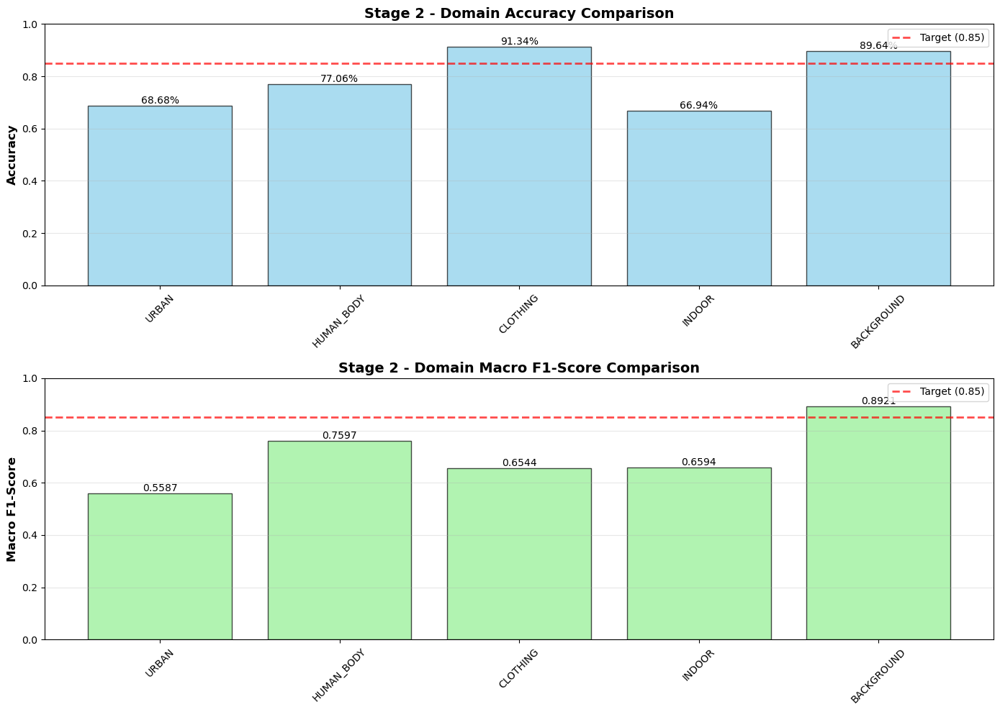

   ✅ Karşılaştırma grafiği kaydedildi

✅ STAGE 2 TEST TAMAMLANDI!


In [26]:
"""
🧪 STAGE 2 TEST VE CONFUSION MATRIX
Domain-Specific Mask Detection için kapsamlı test ve değerlendirme
Her domain için ayrı confusion matrix ve analiz
"""

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from tqdm.auto import tqdm
import os

print("\n" + "="*70)
print("🧪 STAGE 2 - MASK DETECTION TEST (Domain-Specific)")
print("="*70)

# =============================================
# 1️⃣ HAZIRLIK
# =============================================

print("\n1️⃣ Stage 2 modelleri yükleniyor...")

plots_folder = os.path.join("eğitim_sonuçları", NOTEBOOK_NAME, "test_results", "plots")
os.makedirs(plots_folder, exist_ok=True)

stage2_results = {}

# =============================================
# 2️⃣ HER DOMAIN İÇİN TEST
# =============================================

for domain in DOMAIN_NAMES:
    print(f"\n{'='*70}")
    print(f"🎯 DOMAIN: {domain}")
    print(f"{'='*70}")
    
    # Model checkpoint yolu
    checkpoint_path = os.path.join(
        "eğitim_sonuçları", NOTEBOOK_NAME, f"stage2_{domain.lower()}", 
        "models", "best_model.pth"
    )
    
    # Loader kontrolü
    if domain not in domain_loaders:
        print(f"   ⚠️  Loader bulunamadı, atlanıyor")
        continue
    
    if not os.path.exists(checkpoint_path):
        print(f"   ⚠️  Checkpoint bulunamadı: {checkpoint_path}")
        continue
    
    # Checkpoint yükle
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    num_masks = checkpoint['num_masks']
    mask_to_label = checkpoint['mask_to_label']
    label_to_mask_raw = checkpoint['label_to_mask']
    
    # Key tipini normalize et (hem int hem str key'i destekle)
    label_to_mask = {}
    for key, value in label_to_mask_raw.items():
        if isinstance(key, str):
            label_to_mask[int(key)] = value
            label_to_mask[key] = value
        else:
            label_to_mask[key] = value
            label_to_mask[str(key)] = value
    
    # Model oluştur ve yükle
    model = DomainMaskDetector(num_masks=num_masks).to(device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    
    print(f"   ✅ Model yüklendi")
    print(f"   Mask sayısı: {num_masks}")
    print(f"   Best Val Acc: {checkpoint.get('val_acc', 0)*100:.2f}%")
    
    # Validation loader
    val_loader = domain_loaders[domain]['val']
    
    # =============================================
    # TAHMİNLER
    # =============================================
    
    print(f"\n   Testing...")
    
    all_preds = []
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"{domain} Test", leave=False):
            images = images.to(device)
            outputs = model(images)
            
            probs = torch.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.numpy())
            all_probs.extend(probs.cpu().numpy())
    
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    
    print(f"   ✅ {len(all_preds):,} örnek test edildi")
    
    # =============================================
    # CONFUSION MATRIX
    # =============================================
    
    print(f"\n   Confusion matrix hesaplanıyor...")
    
    cm = confusion_matrix(all_labels, all_preds)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    # Mask isimleri (integer key kullan)
    mask_names = [label_to_mask[i] for i in range(num_masks)]
    
    # Confusion matrix görselleştir
    fig, axes = plt.subplots(1, 2, figsize=(max(16, num_masks*1.2), max(7, num_masks*0.6)))
    
    # Sol: Ham sayılar
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=mask_names, yticklabels=mask_names,
                ax=axes[0], cbar_kws={'label': 'Count'}, 
                annot_kws={'size': max(6, 12 - num_masks//2)})
    axes[0].set_xlabel('Predicted Mask', fontsize=11, fontweight='bold')
    axes[0].set_ylabel('True Mask', fontsize=11, fontweight='bold')
    axes[0].set_title(f'{domain} - Confusion Matrix (Counts)', fontsize=13, fontweight='bold')
    axes[0].tick_params(axis='x', rotation=90, labelsize=max(7, 10 - num_masks//3))
    axes[0].tick_params(axis='y', rotation=0, labelsize=max(7, 10 - num_masks//3))
    
    # Sağ: Yüzdeler
    sns.heatmap(cm_normalized, annot=True, fmt='.1f', cmap='RdYlGn',
                xticklabels=mask_names, yticklabels=mask_names,
                ax=axes[1], cbar_kws={'label': 'Percentage (%)'}, 
                annot_kws={'size': max(6, 12 - num_masks//2)},
                vmin=0, vmax=100)
    axes[1].set_xlabel('Predicted Mask', fontsize=11, fontweight='bold')
    axes[1].set_ylabel('True Mask', fontsize=11, fontweight='bold')
    axes[1].set_title(f'{domain} - Confusion Matrix (Percentages)', fontsize=13, fontweight='bold')
    axes[1].tick_params(axis='x', rotation=90, labelsize=max(7, 10 - num_masks//3))
    axes[1].tick_params(axis='y', rotation=0, labelsize=max(7, 10 - num_masks//3))
    
    plt.tight_layout()
    plt.savefig(os.path.join(plots_folder, f'stage2_{domain.lower()}_confusion_matrix.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"   ✅ Confusion matrix kaydedildi")
    
    # =============================================
    # CLASSIFICATION REPORT
    # =============================================
    
    print(f"\n   Classification report...")
    
    # Test setinde gerçekten olan sınıfları bul
    unique_labels = np.unique(np.concatenate([all_labels, all_preds]))
    present_mask_names = [mask_names[i] for i in unique_labels if i < len(mask_names)]
    
    report = classification_report(all_labels, all_preds, 
                                   labels=unique_labels,  # Sadece mevcut sınıflar
                                   target_names=present_mask_names,
                                   output_dict=True,
                                   zero_division=0)
    
    # CSV'ye kaydet
    report_df = pd.DataFrame(report).transpose()
    report_csv_path = os.path.join("eğitim_sonuçları", NOTEBOOK_NAME, 
                                    "test_results", f"stage2_{domain.lower()}_classification_report.csv")
    report_df.to_csv(report_csv_path)
    
    # Konsola yazdır (kısa)
    print(f"\n   📊 {domain} CLASSIFICATION REPORT:")
    print(f"   {'─'*60}")
    print(f"   {'Mask':<20} {'Precision':>10} {'Recall':>10} {'F1':>10}")
    print(f"   {'─'*60}")
    
    for mask in present_mask_names:  # Sadece mevcut mask'lar
        if mask in report:
            print(f"   {mask:<20} {report[mask]['precision']:>10.3f} "
                  f"{report[mask]['recall']:>10.3f} "
                  f"{report[mask]['f1-score']:>10.3f}")
    
    print(f"   {'─'*60}")
    print(f"   {'Overall Accuracy':<20} {report['accuracy']:>30.4f}")
    print(f"   {'─'*60}")
    
    # =============================================
    # PERFORMANS GRAFİĞİ
    # =============================================
    
    print(f"\n   Performans grafiği...")
    
    fig, ax = plt.subplots(1, 1, figsize=(max(12, len(present_mask_names)*0.8), 7))
    
    x = np.arange(len(present_mask_names))
    width = 0.25
    
    precisions = [report[m]['precision'] for m in present_mask_names]
    recalls = [report[m]['recall'] for m in present_mask_names]
    f1_scores = [report[m]['f1-score'] for m in present_mask_names]
    
    bars1 = ax.bar(x - width, precisions, width, label='Precision', 
                   color='skyblue', edgecolor='black')
    bars2 = ax.bar(x, recalls, width, label='Recall', 
                   color='lightgreen', edgecolor='black')
    bars3 = ax.bar(x + width, f1_scores, width, label='F1-Score', 
                   color='salmon', edgecolor='black')
    
    ax.axhline(y=0.85, color='red', linestyle='--', linewidth=2, 
              alpha=0.7, label='Target (0.85)')
    
    ax.set_xlabel('Mask', fontsize=12, fontweight='bold')
    ax.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax.set_title(f'{domain} - Mask Detection Performance', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(present_mask_names, rotation=90, ha='right', 
                       fontsize=max(7, 10 - len(present_mask_names)//3))
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_ylim([0, 1.0])
    
    # Bar üzerine değerleri yaz (sadece F1-score)
    for bar in bars3:
        height = bar.get_height()
        if height > 0.1:  # Küçük değerleri gösterme
            ax.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.2f}',
                    ha='center', va='bottom', 
                    fontsize=max(6, 9 - num_masks//4), rotation=0)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plots_folder, f'stage2_{domain.lower()}_performance.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"   ✅ Performans grafiği kaydedildi")
    
    # =============================================
    # SONUÇLARI KAYDET
    # =============================================
    
    stage2_results[domain] = {
        'num_masks': num_masks,
        'num_samples': len(all_preds),
        'accuracy': report['accuracy'],
        'macro_f1': report['macro avg']['f1-score'],
        'weighted_f1': report['weighted avg']['f1-score'],
        'best_mask': max(present_mask_names, key=lambda m: report.get(m, {}).get('f1-score', 0)),
        'best_f1': max([report.get(m, {}).get('f1-score', 0) for m in present_mask_names]),
        'worst_mask': min(present_mask_names, key=lambda m: report.get(m, {}).get('f1-score', 1)),
        'worst_f1': min([report.get(m, {}).get('f1-score', 1) for m in present_mask_names]),
        'avg_confidence_correct': np.max(all_probs, axis=1)[all_preds == all_labels].mean(),
        'avg_confidence_incorrect': np.max(all_probs, axis=1)[all_preds != all_labels].mean() if (all_preds != all_labels).sum() > 0 else 0.0
    }
    
    print(f"\n   ✅ {domain} test tamamlandı!")
    print(f"   Test edilen mask sayısı: {len(present_mask_names)}/{num_masks}")
    if len(present_mask_names) < num_masks:
        missing_masks = [m for i, m in enumerate(mask_names) if i not in unique_labels]
        print(f"   ⚠️  Test setinde bulunmayan mask'lar: {', '.join(missing_masks[:3])}"
              f"{' ...' if len(missing_masks) > 3 else ''}")

# =============================================
# 3️⃣ STAGE 2 GENEL ÖZET
# =============================================

print(f"\n{'='*70}")
print(f"📊 STAGE 2 - TÜM DOMAIN'LER ÖZET")
print(f"{'='*70}")

if len(stage2_results) > 0:
    print(f"\n📈 Domain Bazında Sonuçlar:")
    print(f"{'─'*90}")
    print(f"{'Domain':<15} {'Masks':>6} {'Samples':>8} {'Accuracy':>10} {'Macro F1':>10} {'Best Mask':>20}")
    print(f"{'─'*90}")
    
    for domain, results in stage2_results.items():
        print(f"{domain:<15} {results['num_masks']:>6} {results['num_samples']:>8,} "
              f"{results['accuracy']:>9.2%} {results['macro_f1']:>10.4f} "
              f"{results['best_mask'][:18]:>20}")
    
    print(f"{'─'*90}")
    
    # Genel ortalamalar
    avg_accuracy = np.mean([r['accuracy'] for r in stage2_results.values()])
    avg_macro_f1 = np.mean([r['macro_f1'] for r in stage2_results.values()])
    
    print(f"\n✅ Genel Ortalama:")
    print(f"   Average Accuracy: {avg_accuracy:.2%}")
    print(f"   Average Macro F1: {avg_macro_f1:.4f}")
    
    # En iyi ve en kötü domain
    best_domain = max(stage2_results.items(), key=lambda x: x[1]['accuracy'])
    worst_domain = min(stage2_results.items(), key=lambda x: x[1]['accuracy'])
    
    print(f"\n🏆 En İyi Domain:")
    print(f"   {best_domain[0]}: Accuracy={best_domain[1]['accuracy']:.2%}, F1={best_domain[1]['macro_f1']:.4f}")
    
    print(f"\n⚠️  En Düşük Domain:")
    print(f"   {worst_domain[0]}: Accuracy={worst_domain[1]['accuracy']:.2%}, F1={worst_domain[1]['macro_f1']:.4f}")
    
    # Karşılaştırma grafiği
    print(f"\n📊 Domain karşılaştırma grafiği oluşturuluyor...")
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    
    domains_list = list(stage2_results.keys())
    accuracies = [stage2_results[d]['accuracy'] for d in domains_list]
    macro_f1s = [stage2_results[d]['macro_f1'] for d in domains_list]
    
    # Accuracy
    bars = axes[0].bar(domains_list, accuracies, color='skyblue', 
                       edgecolor='black', alpha=0.7)
    axes[0].axhline(y=0.85, color='red', linestyle='--', linewidth=2, 
                    alpha=0.7, label='Target (0.85)')
    axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
    axes[0].set_title('Stage 2 - Domain Accuracy Comparison', fontsize=14, fontweight='bold')
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].legend()
    axes[0].grid(True, alpha=0.3, axis='y')
    axes[0].set_ylim([0, 1.0])
    
    for bar, value in zip(bars, accuracies):
        axes[0].text(bar.get_x() + bar.get_width()/2., value,
                    f'{value:.2%}',
                    ha='center', va='bottom', fontsize=10)
    
    # Macro F1
    bars = axes[1].bar(domains_list, macro_f1s, color='lightgreen', 
                       edgecolor='black', alpha=0.7)
    axes[1].axhline(y=0.85, color='red', linestyle='--', linewidth=2, 
                    alpha=0.7, label='Target (0.85)')
    axes[1].set_ylabel('Macro F1-Score', fontsize=12, fontweight='bold')
    axes[1].set_title('Stage 2 - Domain Macro F1-Score Comparison', fontsize=14, fontweight='bold')
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].legend()
    axes[1].grid(True, alpha=0.3, axis='y')
    axes[1].set_ylim([0, 1.0])
    
    for bar, value in zip(bars, macro_f1s):
        axes[1].text(bar.get_x() + bar.get_width()/2., value,
                    f'{value:.4f}',
                    ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plots_folder, 'stage2_domain_comparison.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"   ✅ Karşılaştırma grafiği kaydedildi")

else:
    print("\n⚠️  Hiçbir domain test edilemedi!")

print("\n" + "="*70)
print("✅ STAGE 2 TEST TAMAMLANDI!")
print("="*70)

In [8]:
"""
🔗 HİYERARŞİK TEST - NOTEBOOK HÜCRE
Bu hücreyi notebook'unuzun sonuna ekleyin
"""

# =============================================
# 📥 ÖNCE VALİDATİON LOADER VE MAPPINGS HAZIR OLMALI
# =============================================

# Bu değişkenler zaten notebook'ta tanımlı olmalı:
# - val_loader_s1: Validation DataLoader
# - domain_to_label: Domain → label mapping
# - label_to_domain: Label → domain mapping
# - DOMAIN_CATEGORIES: Domain categories dict

# Eğer yoksa, hierarchical_mask_detection_FULL.ipynb dosyasındaki
# Hücre 6'yı çalıştır

# =============================================
# 🚀 HİYERARŞİK TEST ÇALIŞTIR
# =============================================

print("\n" + "="*70)
print("🚀 HİYERARŞİK TEST SİSTEMİ BAŞLATILIYOR")
print("="*70)

# Script'i import et
import sys
sys.path.append('.')  # Eğer aynı klasördeyse

from hierarchical_test_analysis import main

# Çalıştır
results, summary = main(
    val_loader=val_loader_s1,
    domain_to_label=domain_to_label,
    label_to_domain=label_to_domain
)

# =============================================
# 📊 ÖZET SONUÇLAR
# =============================================

print("\n" + "="*70)
print("📊 ÖZET SONUÇLAR")
print("="*70)

print(f"\n🎯 Performans Metrikleri:")
print(f"   Stage 1 Domain Accuracy:     {summary['domain_accuracy']:.2%}")
print(f"   Stage 2 Mask Accuracy:       {summary['mask_accuracy_on_correct_domain']:.2%}")
print(f"   Hierarchical Accuracy:       {summary['hierarchical_accuracy']:.2%}")

print(f"\n📊 Sample Breakdown:")
print(f"   Total Samples:               {summary['total_samples']:,}")
print(f"   Correct Domain Predictions:  {summary['correct_domain_samples']:,}")
print(f"   Wrong Domain Predictions:    {summary['wrong_domain_samples']:,}")

print(f"\n⚠️ Stage 1 Yanlışlarından Etkilenen Oran:")
print(f"   {summary['wrong_domain_samples']/summary['total_samples']:.2%} veri yanlış Stage 2 modeline gönderildi")

print("\n" + "="*70)
print("✅ TEST TAMAMLANDI!")
print("="*70)

print(f"\n📂 Sonuçlar 'hierarchical_test_results/' klasöründe:")
print(f"   • hierarchical_test_results.csv         (detaylı sonuçlar)")
print(f"   • stage1_domain_confusion.png           (domain confusion matrix)")
print(f"   • hierarchical_performance_breakdown.png (performans grafiği)")
print(f"   • confidence_distributions.png          (confidence analizi)")

# =============================================
# 🔍 DETAYLı ANALİZ (Opsiyonel)
# =============================================

# Detaylı dataframe'i incele
import pandas as pd
df_results = pd.DataFrame(results)

print("\n" + "="*70)
print("🔍 İLK 10 ÖRNEK (Yanlış Domain Tahminleri)")
print("="*70)

df_wrong = df_results[df_results['domain_correct'] == False]
if len(df_wrong) > 0:
    print(df_wrong[['true_domain_name', 'pred_domain_name', 'domain_confidence', 
                    'true_mask_name', 'pred_mask_name']].head(10))
else:
    print("✅ Tüm domain tahminleri doğru!")


🚀 HİYERARŞİK TEST SİSTEMİ BAŞLATILIYOR
🔗 HİYERARŞİK TEST SİSTEMİ

1️⃣ Stage 1 model yükleniyor...
   Path: eğitim_sonuçları/hierarchical_mask_detection\stage1_domain\models\best_model.pth


C:\Users\emrec\OneDrive\Masaüstü\Bilgisayar_Ders\Sinif3\Yapay_Sinir_Aglari\yeni_modeller\hierarchical_test_analysis.py:407: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sta

   ✅ Stage 1 model yüklendi
   Val Accuracy: 86.01%

2️⃣ Stage 2 models yükleniyor...

   📂 URBAN
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_urban\models\best_model.pth


C:\Users\emrec\OneDrive\Masaüstü\Bilgisayar_Ders\Sinif3\Yapay_Sinir_Aglari\yeni_modeller\hierarchical_test_analysis.py:432: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  che

      ✅ Yüklendi - 15 masks
      Val Accuracy: 68.68%

   📂 HUMAN_BODY
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_human_body\models\best_model.pth
      ✅ Yüklendi - 14 masks
      Val Accuracy: 77.06%

   📂 CLOTHING
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_clothing\models\best_model.pth
      ✅ Yüklendi - 7 masks
      Val Accuracy: 91.34%

   📂 INDOOR
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_indoor\models\best_model.pth
      ✅ Yüklendi - 8 masks
      Val Accuracy: 66.94%

   📂 BACKGROUND
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_background\models\best_model.pth
      ✅ Yüklendi - 5 masks
      Val Accuracy: 89.64%

   ✅ Toplam 5 domain model yüklendi

3️⃣ Hierarchical test başlıyor...
🔄 Hierarchical test başlıyor...
⚠️  Not: Validation loader sadece domain label içeriyor, mask label yok
   Bu yüzden mask doğruluğu hesaplanamayacak, sadece domain → mask pipeline test edilecek


Testing:   0%|          | 0/1014 [00:00<?, ?it/s]


4️⃣ Sonuçlar analiz ediliyor...

📊 HİYERARŞİK TEST SONUÇLARI

🎯 STAGE 1 - DOMAIN CLASSIFICATION

✅ Toplam Örnekler: 16,221
✅ Doğru Domain Tahminleri: 13,951
✅ Domain Accuracy: 86.01%
❌ Yanlış Domain Tahminleri: 2,270

🎯 STAGE 2 - MASK DETECTION (Pipeline Test)

✅ Doğru domain tahmin edilen örnekler: 13,951
   Bu örnekler DOĞRU Stage 2 modeline gönderildi
   Tahmin edilen masklar güvenilir
   Ortalama mask prediction confidence: 0.7899

   Domain bazında mask tahminleri:
             URBAN: 7,228 örnek
                      → building: 1283 kez
                      → vegetation: 964 kez
                      → wall: 953 kez
        BACKGROUND: 1,020 örnek
                      → ego vehicle: 369 kez
                      → rectification border: 320 kez
                      → out of roi: 276 kez
          CLOTHING:   997 örnek
                      → Upper-clothes: 595 kez
                      → Pants: 195 kez
                      → cloth: 181 kez
        HUMAN_BODY: 3,801 örnek
   

KeyError: 'mask_accuracy_on_correct_domain'

In [10]:
"""
🔗 HİYERARŞİK TEST - NOTEBOOK HÜCRE (DÜZELTİLMİŞ)
Bu hücreyi notebook'unuzun sonuna ekleyin
"""

# =============================================
# 🚀 HİYERARŞİK TEST ÇALIŞTIR
# =============================================

print("\n" + "="*70)
print("🚀 HİYERARŞİK TEST SİSTEMİ BAŞLATILIYOR")
print("="*70)

# Cache'i temizle ve import et

from hierarchical_test_analysis import main

# Çalıştır
results, summary = main(
    val_loader=val_loader_s1,
    domain_to_label=domain_to_label,
    label_to_domain=label_to_domain
)

# =============================================
# 📊 ÖZET SONUÇLAR - GÜZELLEŞTİRİLMİŞ
# =============================================

print("\n" + "="*70)
print("📊 ÖZET SONUÇLAR")
print("="*70)

# Temel metrikler
domain_acc = summary['domain_accuracy']
total = summary['total_samples']
correct_domain = summary['correct_domain_samples']
wrong_domain = summary['wrong_domain_samples']
reliable_ratio = summary['reliable_pipeline_ratio']

print(f"""
╔══════════════════════════════════════════════════════════════════════╗
║                    🎯 STAGE 1 - DOMAIN CLASSIFICATION                 ║
╚══════════════════════════════════════════════════════════════════════╝

   📊 Toplam Test Örnekleri:        {total:>8,}
   ✅ Doğru Domain Tahminleri:       {correct_domain:>8,}  ({domain_acc*100:>5.2f}%)
   ❌ Yanlış Domain Tahminleri:      {wrong_domain:>8,}  ({(1-domain_acc)*100:>5.2f}%)

╔══════════════════════════════════════════════════════════════════════╗
║                  🔗 HİYERARŞİK PIPELINE GÜVENİLİRLİĞİ                 ║
╚══════════════════════════════════════════════════════════════════════╝

   ✅ Güvenilir Pipeline (Doğru domain → Doğru Stage 2 model)
      Örnek Sayısı:                  {correct_domain:>8,}
      Oran:                          {reliable_ratio*100:>8.2f}%
      
      Bu örneklerin mask tahminleri GÜVENİLİR ✓

   ❌ Güvenilmez Pipeline (Yanlış domain → Yanlış Stage 2 model)
      Örnek Sayısı:                  {wrong_domain:>8,}
      Oran:                          {(1-reliable_ratio)*100:>8.2f}%
      
      Bu örneklerin mask tahminleri GÜVENİLMEZ ✗

╔══════════════════════════════════════════════════════════════════════╗
║                           ⚠️  KRİTİK BULGULAR                         ║
╚══════════════════════════════════════════════════════════════════════╝
""")

if wrong_domain > 0:
    wrong_percentage = (wrong_domain / total) * 100
    print(f"""   🚨 SORUN: Validation setinin {wrong_percentage:.1f}%'i yanlış Stage 2 modeline gönderildi!
   
   Bu demek oluyor ki:
   • {wrong_domain:,} örnek için domain yanlış tahmin edildi
   • Bu örnekler yanlış domain'in mask detection modeline gitti
   • Örneğin: URBAN bir görsel → HUMAN_BODY modeline gönderildi
   • Bu örneklerin mask tahminleri anlamsız/yanlış
   
   💡 ÇÖZÜMLERİ:
   1. Stage 1 (Domain Classifier) accuracy'sini artır
   2. Low-confidence domain tahminlerini filtrele
   3. Ensemble domain prediction kullan
""")
else:
    print("""   ✨ MÜKEMMEL: Tüm domain tahminleri doğru!
   Hierarchical pipeline tamamen güvenilir.
""")

# Görsel ASCII bar chart
print("\n" + "="*70)
print("📊 GÖRSEL DAĞILIM")
print("="*70 + "\n")

# Domain accuracy bar
correct_bar = "█" * int(domain_acc * 50)
wrong_bar = "░" * int((1 - domain_acc) * 50)
print(f"Domain Accuracy:")
print(f"   [{correct_bar}{wrong_bar}] {domain_acc*100:.1f}%")
print()

# Pipeline reliability bar
reliable_bar = "█" * int(reliable_ratio * 50)
unreliable_bar = "░" * int((1 - reliable_ratio) * 50)
print(f"Pipeline Güvenilirliği:")
print(f"   [{reliable_bar}{unreliable_bar}] {reliable_ratio*100:.1f}%")
print()

print("="*70)
print("📂 DETAYLI SONUÇLAR")
print("="*70)

print(f"""
Aşağıdaki dosyalar oluşturuldu:

   📁 hierarchical_test_results/
      ├── 📄 hierarchical_test_results.csv
      │    └─ Her örnek için detaylı sonuçlar:
      │       • True domain vs Predicted domain
      │       • Domain confidence
      │       • Predicted mask name
      │       • Mask confidence
      │
      ├── 📊 stage1_domain_confusion.png
      │    └─ Domain confusion matrix
      │       (Hangi domain'ler karışıyor?)
      │
      ├── 📊 pipeline_reliability.png
      │    └─ Güvenilir vs Güvenilmez pipeline oranı
      │
      └── 📊 confidence_distribution.png
           └─ Doğru/Yanlış tahminlerin confidence dağılımı
""")

print("\n" + "="*70)
print("✅ TEST TAMAMLANDI!")
print("="*70)

# =============================================
# 🔍 DETAYLI ANALİZ (Opsiyonel - DataFrame görüntüleme)
# =============================================

import pandas as pd
df_results = pd.DataFrame(results)

print("\n" + "="*70)
print("🔍 İLK 10 ÖRNEK DETAY")
print("="*70)

# Yanlış domain tahminleri
df_wrong = df_results[df_results['domain_correct'] == False]

if len(df_wrong) > 0:
    print(f"\n❌ Yanlış Domain Tahminleri (İlk 10):\n")
    display_cols = ['true_domain_name', 'pred_domain_name', 'domain_confidence', 
                    'pred_mask_name', 'mask_confidence']
    print(df_wrong[display_cols].head(10).to_string(index=False))
    
    print(f"\n\n📊 En Çok Karışan Domain Çiftleri:\n")
    confusion_pairs = df_wrong.groupby(['true_domain_name', 'pred_domain_name']).size()
    top_confusions = confusion_pairs.sort_values(ascending=False).head(5)
    
    for (true_dom, pred_dom), count in top_confusions.items():
        percentage = (count / len(df_wrong)) * 100
        bar = "█" * int(percentage / 2)
        print(f"   {true_dom:>15} → {pred_dom:>15} : {count:>4} kez {bar} ({percentage:.1f}%)")
else:
    print("\n✅ Tüm domain tahminleri doğru! Hiç yanlış yok.")

print("\n" + "="*70)
print("💡 SONRAKİ ADIMLAR")
print("="*70)

print(f"""
1️⃣  CSV dosyasını incele:
    df = pd.read_csv('hierarchical_test_results/hierarchical_test_results.csv')
    
2️⃣  Low-confidence yanlışları analiz et:
    low_conf_wrong = df[(df['domain_correct']==False) & (df['domain_confidence']<0.7)]
    
3️⃣  Stage 1 modelini iyileştir:
    • Daha fazla epoch
    • Data augmentation
    • Class balancing
    
4️⃣  Confidence threshold ekle:
    • Düşük confidence → Reject
    • Sadece yüksek confidence tahminleri kullan
""")


🚀 HİYERARŞİK TEST SİSTEMİ BAŞLATILIYOR
🔗 HİYERARŞİK TEST SİSTEMİ

1️⃣ Stage 1 model yükleniyor...
   Path: eğitim_sonuçları/hierarchical_mask_detection\stage1_domain\models\best_model.pth


C:\Users\emrec\OneDrive\Masaüstü\Bilgisayar_Ders\Sinif3\Yapay_Sinir_Aglari\yeni_modeller\hierarchical_test_analysis.py:407: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sta

   ✅ Stage 1 model yüklendi
   Val Accuracy: 86.01%

2️⃣ Stage 2 models yükleniyor...

   📂 URBAN
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_urban\models\best_model.pth


C:\Users\emrec\OneDrive\Masaüstü\Bilgisayar_Ders\Sinif3\Yapay_Sinir_Aglari\yeni_modeller\hierarchical_test_analysis.py:432: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  che

      ✅ Yüklendi - 15 masks
      Val Accuracy: 68.68%

   📂 HUMAN_BODY
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_human_body\models\best_model.pth
      ✅ Yüklendi - 14 masks
      Val Accuracy: 77.06%

   📂 CLOTHING
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_clothing\models\best_model.pth
      ✅ Yüklendi - 7 masks
      Val Accuracy: 91.34%

   📂 INDOOR
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_indoor\models\best_model.pth
      ✅ Yüklendi - 8 masks
      Val Accuracy: 66.94%

   📂 BACKGROUND
      Path: eğitim_sonuçları/hierarchical_mask_detection\stage2_background\models\best_model.pth
      ✅ Yüklendi - 5 masks
      Val Accuracy: 89.64%

   ✅ Toplam 5 domain model yüklendi

3️⃣ Hierarchical test başlıyor...
🔄 Hierarchical test başlıyor...
⚠️  Not: Validation loader sadece domain label içeriyor, mask label yok
   Bu yüzden mask doğruluğu hesaplanamayacak, sadece domain → mask pipeline test edilecek


Testing:   0%|          | 0/1014 [00:00<?, ?it/s]


4️⃣ Sonuçlar analiz ediliyor...

📊 HİYERARŞİK TEST SONUÇLARI

🎯 STAGE 1 - DOMAIN CLASSIFICATION

✅ Toplam Örnekler: 16,221
✅ Doğru Domain Tahminleri: 13,951
✅ Domain Accuracy: 86.01%
❌ Yanlış Domain Tahminleri: 2,270

🎯 STAGE 2 - MASK DETECTION (Pipeline Test)

✅ Doğru domain tahmin edilen örnekler: 13,951
   Bu örnekler DOĞRU Stage 2 modeline gönderildi
   Tahmin edilen masklar güvenilir
   Ortalama mask prediction confidence: 0.7899

   Domain bazında mask tahminleri:
             URBAN: 7,228 örnek
                      → building: 1283 kez
                      → vegetation: 964 kez
                      → wall: 953 kez
        BACKGROUND: 1,020 örnek
                      → ego vehicle: 369 kez
                      → rectification border: 320 kez
                      → out of roi: 276 kez
          CLOTHING:   997 örnek
                      → Upper-clothes: 595 kez
                      → Pants: 195 kez
                      → cloth: 181 kez
        HUMAN_BODY: 3,801 örnek
   

# 🔬 KAPSAMLI HİYERARŞİK VALİDATİON TEST SİSTEMİ

## Bu bölümde:
1. **HierarchicalDataset**: Hem domain hem mask label'ı içeren dataset
2. **Validation Loader Oluşturma**: CSV'den mask mapping ile
3. **Stage 1 → Stage 2 Pipeline Test**: Tüm validation verisi için
4. **Hata Analizi**: Hangi verilerin nerede yanlış sınıflandırıldığı
5. **Profesyonel Görselleştirmeler**:
   - Confusion Matrices (Stage 1 ve Stage 2)
   - Error Flow Sankey Diagram
   - Per-Domain Accuracy Charts
   - Confidence Distribution Plots
   - Misclassified Sample Image Grids


In [ ]:
"""
🔬 HÜCRE 18 - HİYERARŞİK DATASET VE HELPER FUNCTIONS
Hem domain hem mask label'ını içeren dataset sınıfı
"""

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import pandas as pd
import os
import json
import random
from collections import defaultdict
from tqdm.auto import tqdm

print("\n" + "="*70)
print("🔬 HİYERARŞİK VALİDASYON TEST SİSTEMİ")
print("="*70)

# =============================================
# 📦 HİYERARŞİK DATASET CLASS
# =============================================

class HierarchicalValidationDataset(Dataset):
    """
    Hem domain hem mask label'ını döndüren dataset.
    Stage 1 ve Stage 2 testleri için gerekli tüm bilgileri içerir.
    """
    
    def __init__(self, image_paths, domain_labels, mask_names, mask_labels, 
                 domain_names_list, transform=None):
        """
        Args:
            image_paths: List of image file paths
            domain_labels: List of domain label indices (0-4)
            mask_names: List of actual mask names (string)
            mask_labels: List of mask label indices (domain-specific)
            domain_names_list: List of domain name strings (for reference)
            transform: Image transforms
        """
        self.image_paths = image_paths
        self.domain_labels = domain_labels
        self.mask_names = mask_names
        self.mask_labels = mask_labels
        self.domain_names_list = domain_names_list
        self.transform = transform
        
        # Validate lengths
        assert len(image_paths) == len(domain_labels) == len(mask_names) == len(mask_labels), \
            f"Length mismatch! paths:{len(image_paths)}, domains:{len(domain_labels)}, " \
            f"mask_names:{len(mask_names)}, mask_labels:{len(mask_labels)}"
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        try:
            img = Image.open(self.image_paths[idx]).convert('RGB')
            if self.transform:
                img = self.transform(img)
            
            domain_label = self.domain_labels[idx]
            mask_name = self.mask_names[idx]
            mask_label = self.mask_labels[idx]
            
            return img, domain_label, mask_label, idx  # idx for tracking
            
        except Exception as e:
            print(f"Error loading {self.image_paths[idx]}: {e}")
            # Fallback to random valid sample
            return self.__getitem__(random.randint(0, len(self) - 1))

# =============================================
# 🛠️ HELPER FUNCTIONS
# =============================================

def load_hierarchical_config(config_path):
    """Hierarchical config JSON'ı yükle"""
    with open(config_path, 'r', encoding='utf-8') as f:
        config = json.load(f)
    return config

def create_stage2_mask_mappings(config):
    """Stage 2 mask mappings'i oluştur"""
    mappings = {}
    for domain_name, domain_info in config['stage2'].items():
        mappings[domain_name] = {
            'mask_to_label': domain_info['mask_to_label'],
            'label_to_mask': {int(k): v for k, v in domain_info['label_to_mask'].items()},
            'num_masks': domain_info['num_masks']
        }
    return mappings

def get_mask_label_for_domain(mask_name, domain_name, stage2_mappings):
    """Belirli bir domain için mask label'ı döndür"""
    if domain_name not in stage2_mappings:
        return None
    
    mapping = stage2_mappings[domain_name]
    if mask_name in mapping['mask_to_label']:
        return mapping['mask_to_label'][mask_name]
    return None

print("✅ HierarchicalValidationDataset sınıfı tanımlandı")
print("✅ Helper functions tanımlandı")



🔬 HİYERARŞİK VALİDASYON TEST SİSTEMİ
✅ HierarchicalValidationDataset sınıfı tanımlandı
✅ Helper functions tanımlandı


In [ ]:
"""
📦 HÜCRE 19 - HİYERARŞİK VALİDASYON LOADER OLUŞTURMA
CSV'den mask bilgilerini alarak hierarchical validation loader hazırla

NOT: Bu hücre df_with_domain, all_image_paths, all_labels, val_indices 
değişkenlerinin tanımlı olmasını gerektirir (Cell 3 ve Cell 6)
"""

import re  # regex için

print("\n" + "="*70)
print("📦 HİYERARŞİK VALİDASYON LOADER OLUŞTURMA")
print("="*70)

# =============================================
# 0️⃣ GEREKLİ DEĞİŞKENLERİ KONTROL ET
# =============================================

print("\n0️⃣ Gerekli değişkenler kontrol ediliyor...")

required_vars = ['df_with_domain', 'all_image_paths', 'all_labels', 'val_indices', 
                 'domain_to_label', 'label_to_domain', 'DOMAIN_NAMES', 'DOMAIN_CATEGORIES']
missing_vars = [v for v in required_vars if v not in globals()]

if missing_vars:
    print(f"   ❌ Eksik değişkenler: {missing_vars}")
    print("   ⚠️  Önce Cell 1-6'yı çalıştırın!")
    raise NameError(f"Eksik değişkenler: {missing_vars}")
else:
    print(f"   ✅ Tüm gerekli değişkenler mevcut")
    print(f"      df_with_domain: {len(df_with_domain):,} kayıt")
    print(f"      all_image_paths: {len(all_image_paths):,} dosya")
    print(f"      val_indices: {len(val_indices):,} örnek")

# =============================================
# 1️⃣ CONFIG VE MAPPINGS YÜKLE
# =============================================

print("\n1️⃣ Config ve mappings yükleniyor...")

config_path = os.path.join("eğitim_sonuçları", NOTEBOOK_NAME, "veriler", "hierarchical_config.json")

if not os.path.exists(config_path):
    raise FileNotFoundError(f"Config bulunamadı: {config_path}")

hierarchical_config = load_hierarchical_config(config_path)
stage2_mappings = create_stage2_mask_mappings(hierarchical_config)

print(f"   ✅ Config yüklendi: {config_path}")
print(f"   Stage 1 best accuracy: {hierarchical_config['stage1']['best_val_acc']*100:.2f}%")

for domain, info in stage2_mappings.items():
    print(f"   Stage 2 {domain}: {info['num_masks']} masks")

# =============================================
# 2️⃣ IMAGE PATH → MASK NAME MAPPING OLUŞTUR
# =============================================

print("\n2️⃣ Image → Mask mapping oluşturuluyor...")

# df_with_domain zaten notebook'ta tanımlı (Cell 3'ten)
# Dataset bazlı mask dictionary oluştur - perturbed_img_id → mask_name
mask_dict_by_dataset = {}

for _, row in df_with_domain.iterrows():
    img_id = str(row['perturbed_img_id'])
    mask_name = row['mask_name']
    dataset_key = row['dataset']
    
    if dataset_key not in mask_dict_by_dataset:
        mask_dict_by_dataset[dataset_key] = {}
    
    # Farklı key formatları için (Cell 6'daki mantıkla aynı)
    for ext in ['', '.png', '.jpg', '.jpeg']:
        mask_dict_by_dataset[dataset_key][img_id + ext] = mask_name

print(f"   ✅ {len(mask_dict_by_dataset)} dataset için mask mapping oluşturuldu")
for ds, masks in mask_dict_by_dataset.items():
    unique_masks = len(set(masks.values()))
    print(f"      {ds}: {len(masks)//4:,} image, {unique_masks} unique mask")

# =============================================
# 3️⃣ VALİDATION SET İÇİN LABEL'LARI HAZIRLA
# =============================================

print("\n3️⃣ Validation set için label'lar hazırlanıyor...")

# val_indices zaten tanımlı (Cell 6'dan)
# all_image_paths ve all_labels zaten tanımlı

val_image_paths = []
val_domain_labels = []
val_mask_names = []
val_mask_labels = []

skipped_no_domain = 0
skipped_no_dataset = 0
skipped_no_mask = 0
skipped_no_mapping = 0

# Detaylı istatistik için
found_datasets = defaultdict(int)
found_domains = defaultdict(int)

for idx in tqdm(val_indices, desc="Processing validation set", leave=False):
    img_path = all_image_paths[idx]
    domain_label = all_labels[idx]
    
    # Domain name bul - label_to_domain'ın key tipi değişebilir
    domain_name = label_to_domain.get(domain_label) or label_to_domain.get(str(domain_label))
    if domain_name is None and isinstance(domain_label, (np.integer, np.int64)):
        domain_name = label_to_domain.get(int(domain_label))
    
    if domain_name is None:
        skipped_no_domain += 1
        continue
    
    # Image path'den dataset key'i çıkar
    # Path format: .../inpainting/{parent}/{model}/.../{filename}
    path_parts = img_path.replace('\\', '/').split('/')
    
    dataset_key = None
    for i, part in enumerate(path_parts):
        if part == 'inpainting' and i + 2 < len(path_parts):
            parent = path_parts[i + 1]
            model = path_parts[i + 2]
            dataset_key = f"{parent}_{model}"
            break
    
    if dataset_key is None or dataset_key not in mask_dict_by_dataset:
        skipped_no_dataset += 1
        continue
    
    found_datasets[dataset_key] += 1
    
    # Filename'den mask name bul
    filename = os.path.basename(img_path)
    filename_no_ext = os.path.splitext(filename)[0]
    
    mask_dict = mask_dict_by_dataset[dataset_key]
    mask_name = None
    
    # Key arama - Cell 6'daki mantıkla aynı
    for key in [filename, filename_no_ext, 
                filename_no_ext + '.png', filename_no_ext + '.jpg', filename_no_ext + '.jpeg']:
        if key in mask_dict:
            mask_name = mask_dict[key]
            break
    
    if mask_name is None:
        skipped_no_mask += 1
        continue
    
    # Mask label (domain-specific)
    mask_label = get_mask_label_for_domain(mask_name, domain_name, stage2_mappings)
    
    if mask_label is None:
        skipped_no_mapping += 1
        continue
    
    found_domains[domain_name] += 1
    
    # Tüm bilgileri ekle
    val_image_paths.append(img_path)
    val_domain_labels.append(domain_label)
    val_mask_names.append(mask_name)
    val_mask_labels.append(mask_label)

print(f"\n   ✅ {len(val_image_paths):,} örnek hazır")

total_skipped = skipped_no_domain + skipped_no_dataset + skipped_no_mask + skipped_no_mapping
if total_skipped > 0:
    print(f"\n   ⚠️ Atlanan örnek detayları:")
    print(f"      Domain bulunamadı: {skipped_no_domain:,}")
    print(f"      Dataset bulunamadı: {skipped_no_dataset:,}")
    print(f"      Mask bulunamadı: {skipped_no_mask:,}")
    print(f"      Mask label bulunamadı: {skipped_no_mapping:,}")
    print(f"      TOPLAM atlanan: {total_skipped:,}")

print(f"\n   📊 Bulunan dataset dağılımı:")
for ds, count in sorted(found_datasets.items(), key=lambda x: -x[1]):
    print(f"      {ds}: {count:,}")

print(f"\n   📊 Bulunan domain dağılımı:")
for dom, count in sorted(found_domains.items(), key=lambda x: -x[1]):
    print(f"      {dom}: {count:,}")

# =============================================
# 4️⃣ DATASET VE DATALOADER OLUŞTUR
# =============================================

print("\n4️⃣ Dataset ve DataLoader oluşturuluyor...")

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

hierarchical_val_dataset = HierarchicalValidationDataset(
    image_paths=val_image_paths,
    domain_labels=val_domain_labels,
    mask_names=val_mask_names,
    mask_labels=val_mask_labels,
    domain_names_list=DOMAIN_NAMES,
    transform=val_transform
)

hierarchical_val_loader = DataLoader(
    hierarchical_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True,
    drop_last=False
)

print(f"   ✅ DataLoader hazır")
print(f"   Batch sayısı: {len(hierarchical_val_loader)}")
print(f"   Toplam örnek: {len(hierarchical_val_dataset):,}")

# =============================================
# 5️⃣ DOMAIN DAĞILIMI
# =============================================

print("\n5️⃣ Domain dağılımı:")

domain_dist = defaultdict(int)
mask_dist_per_domain = defaultdict(lambda: defaultdict(int))

for domain_label, mask_name in zip(val_domain_labels, val_mask_names):
    domain_name = label_to_domain.get(domain_label) or label_to_domain.get(str(domain_label))
    domain_dist[domain_name] += 1
    mask_dist_per_domain[domain_name][mask_name] += 1

print(f"\n   {'Domain':<15} {'Samples':>10} {'Unique Masks':>12} {'%':>8}")
print(f"   {'-'*50}")

total_samples = len(val_domain_labels)
for domain in DOMAIN_NAMES:
    count = domain_dist[domain]
    unique_masks = len(mask_dist_per_domain[domain])
    pct = (count / total_samples) * 100 if total_samples > 0 else 0
    print(f"   {domain:<15} {count:>10,} {unique_masks:>12} {pct:>7.1f}%")

print(f"   {'-'*50}")
print(f"   {'TOPLAM':<15} {total_samples:>10,}")

# =============================================
# 6️⃣ DOĞRULAMA TESTİ
# =============================================

print("\n6️⃣ Doğrulama testi...")

# İlk batch'i test et
for images, domains, masks, indices in hierarchical_val_loader:
    print(f"\n   ✅ İlk batch kontrol:")
    print(f"      Images shape: {images.shape}")
    print(f"      Domains shape: {domains.shape} (min={domains.min()}, max={domains.max()})")
    print(f"      Masks shape: {masks.shape} (min={masks.min()}, max={masks.max()})")
    print(f"      Indices: {indices[:5].tolist()}...")
    break

print("\n" + "="*70)
print("✅ HİYERARŞİK VALİDASYON LOADER HAZIR!")
print("="*70)



📦 HİYERARŞİK VALİDASYON LOADER OLUŞTURMA

0️⃣ Gerekli değişkenler kontrol ediliyor...
   ✅ Tüm gerekli değişkenler mevcut
      df_with_domain: 121,314 kayıt
      all_image_paths: 6,367 dosya
      val_indices: 1,274 örnek

1️⃣ Config ve mappings yükleniyor...
   ✅ Config yüklendi: eğitim_sonuçları\hierarchical_mask_detection - Kopya (2)\veriler\hierarchical_config.json
   Stage 1 best accuracy: 86.01%
   Stage 2 URBAN: 15 masks
   Stage 2 HUMAN_BODY: 14 masks
   Stage 2 CLOTHING: 7 masks
   Stage 2 INDOOR: 8 masks
   Stage 2 BACKGROUND: 5 masks

2️⃣ Image → Mask mapping oluşturuluyor...
   ✅ 6 dataset için mask mapping oluşturuldu
      ADE20K_StableDiffusion_v5: 26,559 image, 30 unique mask
      ADE20K_StableDiffusion_XL: 26,657 image, 30 unique mask
      CelebAHQ_Kandinsky_2_2: 13,727 image, 11 unique mask
      CityScapes_Kandinsky_2_2: 40,946 image, 16 unique mask
      HumanParsing_OpenJourney: 13,215 image, 6 unique mask
      OpenImages_StableDiffusion_XL: 210 image, 4 uniq

Processing validation set:   0%|          | 0/1274 [00:00<?, ?it/s]


   ✅ 276 örnek hazır

   ⚠️ Atlanan örnek detayları:
      Domain bulunamadı: 0
      Dataset bulunamadı: 0
      Mask bulunamadı: 0
      Mask label bulunamadı: 998
      TOPLAM atlanan: 998

   📊 Bulunan dataset dağılımı:
      CityScapes_Kandinsky_2_2: 1,274

   📊 Bulunan domain dağılımı:
      BACKGROUND: 276

4️⃣ Dataset ve DataLoader oluşturuluyor...
   ✅ DataLoader hazır
   Batch sayısı: 35
   Toplam örnek: 276

5️⃣ Domain dağılımı:

   Domain             Samples Unique Masks        %
   --------------------------------------------------
   URBAN                    0            0     0.0%
   HUMAN_BODY               0            0     0.0%
   CLOTHING                 0            0     0.0%
   INDOOR                   0            0     0.0%
   BACKGROUND             276            1   100.0%
   --------------------------------------------------
   TOPLAM                 276

6️⃣ Doğrulama testi...

   ✅ İlk batch kontrol:
      Images shape: torch.Size([8, 3, 224, 224])
      

In [ ]:
"""
🔄 HÜCRE 20 - HİYERARŞİK TEST PIPELINE (STAGE 1 → STAGE 2)
Tüm modelleri yükle ve validation setini test et
"""

print("\n" + "="*70)
print("🔄 HİYERARŞİK TEST PIPELINE")
print("="*70)

# =============================================
# 1️⃣ STAGE 1 MODEL YÜKLE
# =============================================

print("\n1️⃣ Stage 1 model yükleniyor...")

stage1_model_path = hierarchical_config['stage1']['model_path']
if not os.path.exists(stage1_model_path):
    stage1_model_path = os.path.join("eğitim_sonuçları", NOTEBOOK_NAME, "stage1_domain", "models", "best_model.pth")

stage1_checkpoint = torch.load(stage1_model_path, map_location=device, weights_only=False)
stage1_model = DomainClassifier(num_domains=NUM_DOMAINS).to(device)
stage1_model.load_state_dict(stage1_checkpoint['model_state_dict'])
stage1_model.eval()

print(f"   ✅ Stage 1 model yüklendi")
print(f"   Path: {stage1_model_path}")
print(f"   Val Accuracy: {stage1_checkpoint.get('val_acc', 0)*100:.2f}%")

# =============================================
# 2️⃣ STAGE 2 MODELS YÜKLE
# =============================================

print("\n2️⃣ Stage 2 models yükleniyor...")

stage2_models = {}

for domain_name in DOMAIN_NAMES:
    model_path = hierarchical_config['stage2'][domain_name]['model_path']
    if not os.path.exists(model_path):
        model_path = os.path.join("eğitim_sonuçları", NOTEBOOK_NAME, 
                                  f"stage2_{domain_name.lower()}", "models", "best_model.pth")
    
    if not os.path.exists(model_path):
        print(f"   ⚠️  {domain_name}: Model bulunamadı!")
        continue
    
    checkpoint = torch.load(model_path, map_location=device, weights_only=False)
    num_masks = checkpoint['num_masks']
    
    model = DomainMaskDetector(num_masks=num_masks).to(device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    
    stage2_models[domain_name] = {
        'model': model,
        'num_masks': num_masks,
        'label_to_mask': checkpoint['label_to_mask'],
        'val_acc': checkpoint.get('val_acc', 0)
    }
    
    print(f"   ✅ {domain_name}: {num_masks} masks, Acc={checkpoint.get('val_acc', 0)*100:.2f}%")

print(f"\n   Toplam {len(stage2_models)} Stage 2 model yüklendi")

# =============================================
# 3️⃣ HİYERARŞİK TEST BAŞLAT
# =============================================

print("\n3️⃣ Hierarchical test başlatılıyor...")
print(f"   Toplam örnek: {len(hierarchical_val_dataset):,}")
print(f"   Batch sayısı: {len(hierarchical_val_loader)}")

# Sonuçları saklamak için listeler
all_results = []

with torch.no_grad():
    for batch_idx, (images, true_domains, true_masks, sample_indices) in enumerate(
        tqdm(hierarchical_val_loader, desc="Hierarchical Testing")
    ):
        images = images.to(device)
        batch_size = images.size(0)
        
        # ============================================
        # STAGE 1: Domain Classification
        # ============================================
        
        domain_outputs = stage1_model(images)
        domain_probs = torch.softmax(domain_outputs, dim=1)
        domain_confidences, pred_domains = torch.max(domain_probs, 1)
        
        # CPU'ya taşı
        pred_domains = pred_domains.cpu().numpy()
        domain_confidences = domain_confidences.cpu().numpy()
        true_domains_np = true_domains.numpy()
        true_masks_np = true_masks.numpy()
        sample_indices_np = sample_indices.numpy()
        
        # ============================================
        # STAGE 2: Mask Classification (Domain-based routing)
        # ============================================
        
        for i in range(batch_size):
            img = images[i:i+1]  # Keep batch dimension
            
            true_domain_label = true_domains_np[i]
            pred_domain_label = pred_domains[i]
            domain_conf = domain_confidences[i]
            true_mask_label = true_masks_np[i]
            sample_idx = sample_indices_np[i]
            
            # Domain names
            true_domain_name = label_to_domain.get(true_domain_label) or label_to_domain.get(str(true_domain_label))
            pred_domain_name = label_to_domain.get(pred_domain_label) or label_to_domain.get(str(pred_domain_label))
            
            # True mask name (dataset'ten)
            true_mask_name = hierarchical_val_dataset.mask_names[sample_idx]
            
            # Stage 2: Tahmin edilen domain'e göre mask predict et
            pred_mask_label = -1
            pred_mask_name = "UNKNOWN"
            mask_confidence = 0.0
            
            if pred_domain_name in stage2_models:
                s2_model = stage2_models[pred_domain_name]['model']
                s2_outputs = s2_model(img)
                s2_probs = torch.softmax(s2_outputs, dim=1)
                mask_conf, mask_pred = torch.max(s2_probs, 1)
                
                pred_mask_label = mask_pred.item()
                mask_confidence = mask_conf.item()
                
                # Label to mask name
                l2m = stage2_models[pred_domain_name]['label_to_mask']
                pred_mask_name = l2m.get(pred_mask_label) or l2m.get(str(pred_mask_label), "UNKNOWN")
            
            # Domain doğruluğu
            domain_correct = (pred_domain_label == true_domain_label)
            
            # Mask doğruluğu (sadece domain doğruysa anlamlı)
            # True mask'ın tahmin edilen domain'deki label'ını bul
            if domain_correct:
                expected_mask_label = get_mask_label_for_domain(true_mask_name, true_domain_name, stage2_mappings)
                mask_correct = (pred_mask_label == expected_mask_label) if expected_mask_label is not None else False
            else:
                mask_correct = False  # Domain yanlışsa mask değerlendirmesi anlamsız
            
            # Sonucu kaydet
            result = {
                'sample_idx': sample_idx,
                'image_path': hierarchical_val_dataset.image_paths[sample_idx],
                'true_domain_label': true_domain_label,
                'pred_domain_label': pred_domain_label,
                'true_domain_name': true_domain_name,
                'pred_domain_name': pred_domain_name,
                'domain_confidence': domain_conf,
                'domain_correct': domain_correct,
                'true_mask_label': true_mask_label,
                'pred_mask_label': pred_mask_label,
                'true_mask_name': true_mask_name,
                'pred_mask_name': pred_mask_name,
                'mask_confidence': mask_confidence,
                'mask_correct': mask_correct,
                'pipeline_correct': domain_correct and mask_correct
            }
            
            all_results.append(result)

# DataFrame oluştur
df_results = pd.DataFrame(all_results)

print(f"\n   ✅ Test tamamlandı: {len(df_results):,} örnek")

# =============================================
# 4️⃣ TEMEL METRİKLER
# =============================================

print("\n4️⃣ Temel metrikler hesaplanıyor...")

total_samples = len(df_results)
domain_correct_count = df_results['domain_correct'].sum()
domain_accuracy = domain_correct_count / total_samples

# Mask accuracy (sadece domain doğru olanlar için)
df_domain_correct = df_results[df_results['domain_correct'] == True]
mask_correct_count = df_domain_correct['mask_correct'].sum()
mask_accuracy_on_correct = mask_correct_count / len(df_domain_correct) if len(df_domain_correct) > 0 else 0

# Full pipeline accuracy
pipeline_correct_count = df_results['pipeline_correct'].sum()
pipeline_accuracy = pipeline_correct_count / total_samples

print(f"\n   📊 STAGE 1 - Domain Classification:")
print(f"      Accuracy: {domain_accuracy*100:.2f}%")
print(f"      Doğru: {domain_correct_count:,} / {total_samples:,}")
print(f"      Yanlış: {total_samples - domain_correct_count:,}")

print(f"\n   📊 STAGE 2 - Mask Detection (Domain doğru olanlar için):")
print(f"      Accuracy: {mask_accuracy_on_correct*100:.2f}%")
print(f"      Doğru: {mask_correct_count:,} / {len(df_domain_correct):,}")

print(f"\n   📊 FULL PIPELINE (Stage 1 + Stage 2):")
print(f"      Accuracy: {pipeline_accuracy*100:.2f}%")
print(f"      Doğru: {pipeline_correct_count:,} / {total_samples:,}")

# Summary dict oluştur
test_summary = {
    'total_samples': total_samples,
    'domain_accuracy': domain_accuracy,
    'domain_correct': domain_correct_count,
    'domain_wrong': total_samples - domain_correct_count,
    'mask_accuracy_on_correct_domain': mask_accuracy_on_correct,
    'mask_correct': mask_correct_count,
    'pipeline_accuracy': pipeline_accuracy,
    'pipeline_correct': pipeline_correct_count
}

print("\n" + "="*70)
print("✅ HİYERARŞİK TEST TAMAMLANDI!")
print("="*70)



🔄 HİYERARŞİK TEST PIPELINE

1️⃣ Stage 1 model yükleniyor...


NameError: name 'hierarchical_config' is not defined

In [ ]:
"""
🔍 HÜCRE 21 - DETAYLI HATA ANALİZİ
Hata tiplerini kategorize et ve detaylı analiz yap
"""

print("\n" + "="*70)
print("🔍 DETAYLI HATA ANALİZİ")
print("="*70)

# =============================================
# 1️⃣ HATA KATEGORİLERİ
# =============================================

print("\n1️⃣ Hata kategorileri oluşturuluyor...")

# Kategorilere ayır
df_stage1_correct_stage2_correct = df_results[(df_results['domain_correct'] == True) & (df_results['mask_correct'] == True)]
df_stage1_correct_stage2_wrong = df_results[(df_results['domain_correct'] == True) & (df_results['mask_correct'] == False)]
df_stage1_wrong = df_results[df_results['domain_correct'] == False]

error_categories = {
    'Stage1✓_Stage2✓': len(df_stage1_correct_stage2_correct),
    'Stage1✓_Stage2✗': len(df_stage1_correct_stage2_wrong),
    'Stage1✗': len(df_stage1_wrong)
}

print(f"\n   📊 HATA KATEGORİLERİ:")
print(f"   {'-'*60}")
print(f"   {'Kategori':<30} {'Sayı':>10} {'Oran':>10}")
print(f"   {'-'*60}")

for category, count in error_categories.items():
    pct = (count / total_samples) * 100
    print(f"   {category:<30} {count:>10,} {pct:>9.2f}%")

print(f"   {'-'*60}")
print(f"   {'TOPLAM':<30} {total_samples:>10,}")

# =============================================
# 2️⃣ DOMAIN BAZINDA HATA ANALİZİ
# =============================================

print("\n2️⃣ Domain bazında hata analizi...")

domain_error_analysis = []

for domain in DOMAIN_NAMES:
    df_domain = df_results[df_results['true_domain_name'] == domain]
    
    if len(df_domain) == 0:
        continue
    
    domain_correct = df_domain['domain_correct'].sum()
    domain_wrong = len(df_domain) - domain_correct
    
    df_domain_correct_subset = df_domain[df_domain['domain_correct'] == True]
    mask_correct = df_domain_correct_subset['mask_correct'].sum() if len(df_domain_correct_subset) > 0 else 0
    mask_wrong = len(df_domain_correct_subset) - mask_correct if len(df_domain_correct_subset) > 0 else 0
    
    pipeline_correct = df_domain['pipeline_correct'].sum()
    
    domain_error_analysis.append({
        'domain': domain,
        'total': len(df_domain),
        'stage1_correct': domain_correct,
        'stage1_wrong': domain_wrong,
        'stage1_accuracy': domain_correct / len(df_domain),
        'stage2_correct': mask_correct,
        'stage2_wrong': mask_wrong,
        'stage2_accuracy': mask_correct / domain_correct if domain_correct > 0 else 0,
        'pipeline_correct': pipeline_correct,
        'pipeline_accuracy': pipeline_correct / len(df_domain)
    })

df_domain_analysis = pd.DataFrame(domain_error_analysis)

print(f"\n   {'Domain':<15} {'Total':>8} {'S1 Acc':>10} {'S2 Acc':>10} {'Pipeline':>10}")
print(f"   {'-'*60}")

for _, row in df_domain_analysis.iterrows():
    print(f"   {row['domain']:<15} {row['total']:>8,} "
          f"{row['stage1_accuracy']*100:>9.2f}% "
          f"{row['stage2_accuracy']*100:>9.2f}% "
          f"{row['pipeline_accuracy']*100:>9.2f}%")

# =============================================
# 3️⃣ EN ÇOK KARIŞTIRILAN DOMAIN ÇİFTLERİ
# =============================================

print("\n3️⃣ En çok karıştırılan domain çiftleri...")

domain_confusion_pairs = df_stage1_wrong.groupby(['true_domain_name', 'pred_domain_name']).size().reset_index(name='count')
domain_confusion_pairs = domain_confusion_pairs.sort_values('count', ascending=False)

print(f"\n   {'True Domain':<15} {'Pred Domain':<15} {'Count':>8} {'%':>8}")
print(f"   {'-'*50}")

for _, row in domain_confusion_pairs.head(10).iterrows():
    pct = (row['count'] / len(df_stage1_wrong)) * 100 if len(df_stage1_wrong) > 0 else 0
    print(f"   {row['true_domain_name']:<15} {row['pred_domain_name']:<15} {row['count']:>8,} {pct:>7.2f}%")

# =============================================
# 4️⃣ EN ÇOK KARIŞTIRILAN MASK'LAR (Domain Doğru Olanlar İçin)
# =============================================

print("\n4️⃣ En çok karıştırılan mask'lar (domain doğru olanlar için)...")

for domain in DOMAIN_NAMES:
    df_domain_s2_wrong = df_stage1_correct_stage2_wrong[df_stage1_correct_stage2_wrong['true_domain_name'] == domain]
    
    if len(df_domain_s2_wrong) == 0:
        continue
    
    mask_confusion = df_domain_s2_wrong.groupby(['true_mask_name', 'pred_mask_name']).size().reset_index(name='count')
    mask_confusion = mask_confusion.sort_values('count', ascending=False)
    
    print(f"\n   🎯 {domain}:")
    for _, row in mask_confusion.head(5).iterrows():
        print(f"      {row['true_mask_name']:<20} → {row['pred_mask_name']:<20} ({row['count']})")

# =============================================
# 5️⃣ CONFIDENCE ANALİZİ
# =============================================

print("\n5️⃣ Confidence analizi...")

# Domain confidence by correctness
avg_conf_correct = df_results[df_results['domain_correct'] == True]['domain_confidence'].mean()
avg_conf_wrong = df_results[df_results['domain_correct'] == False]['domain_confidence'].mean()

print(f"\n   📊 Domain Confidence:")
print(f"      Doğru tahminler ortalama confidence: {avg_conf_correct:.4f}")
print(f"      Yanlış tahminler ortalama confidence: {avg_conf_wrong:.4f}")
print(f"      Fark: {avg_conf_correct - avg_conf_wrong:.4f}")

# Low confidence analysis
low_conf_threshold = 0.7
df_low_conf = df_results[df_results['domain_confidence'] < low_conf_threshold]
low_conf_wrong = df_low_conf[df_low_conf['domain_correct'] == False]

print(f"\n   📊 Düşük Confidence (<{low_conf_threshold}) Analizi:")
print(f"      Toplam düşük confidence: {len(df_low_conf):,} ({len(df_low_conf)/total_samples*100:.2f}%)")
print(f"      Bunların yanlış olanları: {len(low_conf_wrong):,} ({len(low_conf_wrong)/len(df_low_conf)*100:.2f}% of low conf)")

# High confidence analysis
high_conf_threshold = 0.9
df_high_conf = df_results[df_results['domain_confidence'] >= high_conf_threshold]
high_conf_correct = df_high_conf[df_high_conf['domain_correct'] == True]

print(f"\n   📊 Yüksek Confidence (≥{high_conf_threshold}) Analizi:")
print(f"      Toplam yüksek confidence: {len(df_high_conf):,} ({len(df_high_conf)/total_samples*100:.2f}%)")
print(f"      Bunların doğru olanları: {len(high_conf_correct):,} ({len(high_conf_correct)/len(df_high_conf)*100:.2f}% of high conf)")

# =============================================
# 6️⃣ HATA ANALİZİ ÖZET
# =============================================

error_analysis_summary = {
    'error_categories': error_categories,
    'domain_analysis': df_domain_analysis.to_dict('records'),
    'top_domain_confusions': domain_confusion_pairs.head(10).to_dict('records'),
    'avg_confidence_correct': avg_conf_correct,
    'avg_confidence_wrong': avg_conf_wrong,
    'low_confidence_samples': len(df_low_conf),
    'low_confidence_error_rate': len(low_conf_wrong) / len(df_low_conf) if len(df_low_conf) > 0 else 0,
    'high_confidence_samples': len(df_high_conf),
    'high_confidence_accuracy': len(high_conf_correct) / len(df_high_conf) if len(df_high_conf) > 0 else 0
}

print("\n" + "="*70)
print("✅ HATA ANALİZİ TAMAMLANDI!")
print("="*70)



🔍 DETAYLI HATA ANALİZİ

1️⃣ Hata kategorileri oluşturuluyor...

   📊 HATA KATEGORİLERİ:
   ------------------------------------------------------------
   Kategori                             Sayı       Oran
   ------------------------------------------------------------
   Stage1✓_Stage2✓                     7,967     49.12%
   Stage1✓_Stage2✗                     5,984     36.89%
   Stage1✗                             2,270     13.99%
   ------------------------------------------------------------
   TOPLAM                             16,221

2️⃣ Domain bazında hata analizi...

   Domain             Total     S1 Acc     S2 Acc   Pipeline
   ------------------------------------------------------------
   URBAN              7,852     92.05%     51.51%     47.41%
   HUMAN_BODY         4,054     93.76%     59.27%     55.57%
   CLOTHING           1,284     77.65%     77.13%     59.89%
   INDOOR             1,754     51.60%     31.93%     16.48%
   BACKGROUND         1,277     79.87%     9


📊 PROFESYONEL GÖRSELLEŞTİRME - BÖLÜM 1

1️⃣ Stage 1 Confusion Matrix oluşturuluyor...


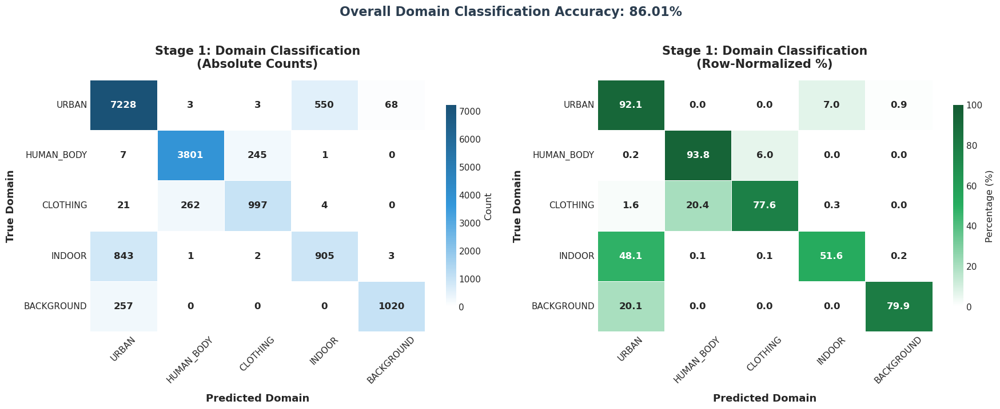

   ✅ Stage 1 confusion matrix kaydedildi

2️⃣ Stage 2 Confusion Matrices oluşturuluyor...


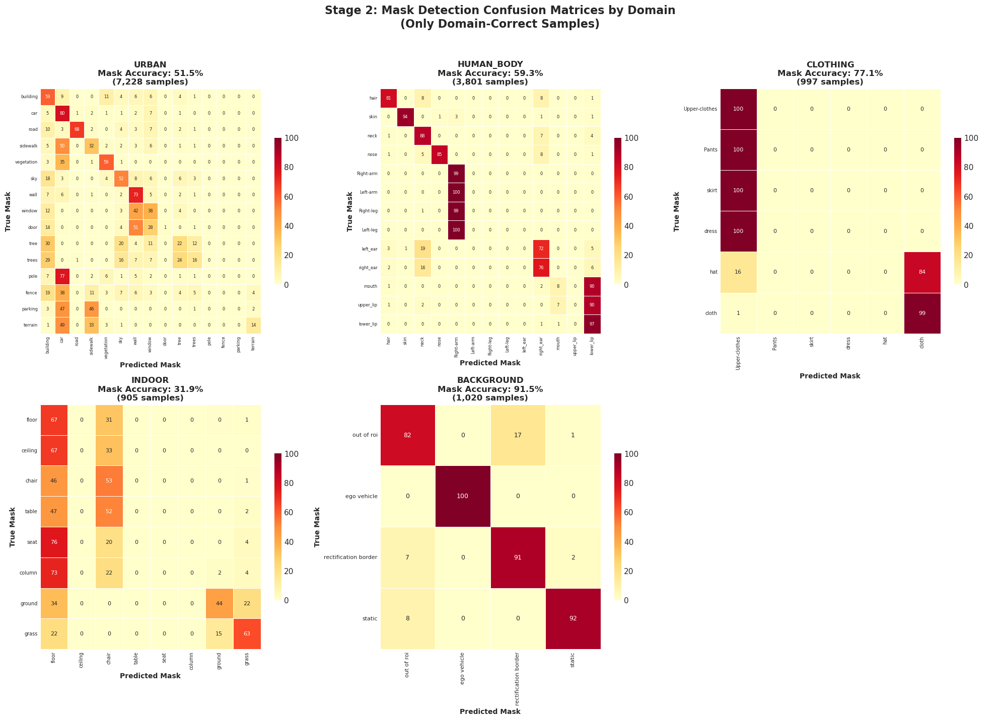

   ✅ Stage 2 confusion matrices kaydedildi

3️⃣ Per-domain accuracy chart oluşturuluyor...


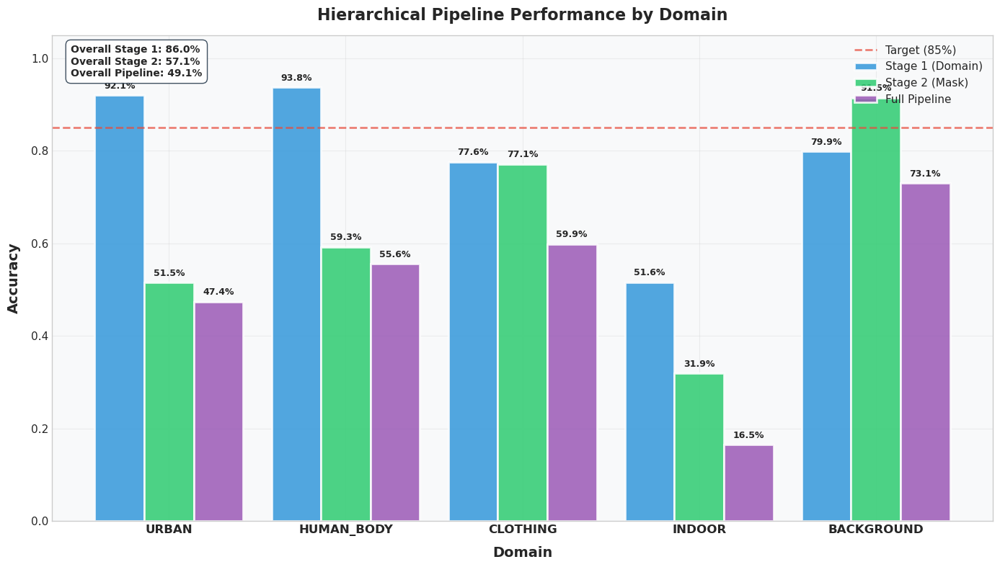

   ✅ Per-domain accuracy chart kaydedildi

✅ GÖRSELLEŞTİRME BÖLÜM 1 TAMAMLANDI!


In [ ]:
"""
📊 HÜCRE 22 - PROFESYONEL GÖRSELLEŞTİRME - BÖLÜM 1
Confusion Matrices ve Performance Charts
"""

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap

print("\n" + "="*70)
print("📊 PROFESYONEL GÖRSELLEŞTİRME - BÖLÜM 1")
print("="*70)

# Çıktı klasörü
output_folder = "hierarchical_validation_test_results"
viz_folder = os.path.join(output_folder, "visualizations")
os.makedirs(viz_folder, exist_ok=True)

# Custom color palette
COLORS = {
    'correct': '#2ecc71',      # Green
    'wrong': '#e74c3c',        # Red
    'domain_correct': '#3498db',  # Blue
    'mask_wrong': '#f39c12',   # Orange
    'neutral': '#95a5a6',      # Gray
    'background': '#2c3e50',   # Dark blue
    'accent': '#9b59b6'        # Purple
}

# Profesyonel style ayarları
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = '#f8f9fa'
plt.rcParams['grid.alpha'] = 0.3

# =============================================
# 1️⃣ STAGE 1 CONFUSION MATRIX (5x5 Domain)
# =============================================

print("\n1️⃣ Stage 1 Confusion Matrix oluşturuluyor...")

# Confusion matrix hesapla
true_domains = df_results['true_domain_label'].values
pred_domains = df_results['pred_domain_label'].values

cm_domain = confusion_matrix(true_domains, pred_domains, labels=range(NUM_DOMAINS))
cm_domain_normalized = cm_domain.astype('float') / cm_domain.sum(axis=1)[:, np.newaxis] * 100

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Custom colormap
cmap_counts = LinearSegmentedColormap.from_list('custom_blues', ['#ffffff', '#3498db', '#1a5276'])
cmap_pct = LinearSegmentedColormap.from_list('custom_greens', ['#ffffff', '#27ae60', '#145a32'])

# Sol: Raw counts
sns.heatmap(cm_domain, annot=True, fmt='d', cmap=cmap_counts,
            xticklabels=DOMAIN_NAMES, yticklabels=DOMAIN_NAMES,
            ax=axes[0], cbar_kws={'label': 'Count', 'shrink': 0.8},
            annot_kws={'size': 12, 'weight': 'bold'},
            linewidths=0.5, linecolor='white')
axes[0].set_xlabel('Predicted Domain', fontsize=13, fontweight='bold', labelpad=10)
axes[0].set_ylabel('True Domain', fontsize=13, fontweight='bold', labelpad=10)
axes[0].set_title('Stage 1: Domain Classification\n(Absolute Counts)', fontsize=15, fontweight='bold', pad=15)
axes[0].tick_params(axis='x', rotation=45, labelsize=11)
axes[0].tick_params(axis='y', rotation=0, labelsize=11)

# Sağ: Percentages
sns.heatmap(cm_domain_normalized, annot=True, fmt='.1f', cmap=cmap_pct,
            xticklabels=DOMAIN_NAMES, yticklabels=DOMAIN_NAMES,
            ax=axes[1], cbar_kws={'label': 'Percentage (%)', 'shrink': 0.8},
            annot_kws={'size': 12, 'weight': 'bold'},
            linewidths=0.5, linecolor='white', vmin=0, vmax=100)
axes[1].set_xlabel('Predicted Domain', fontsize=13, fontweight='bold', labelpad=10)
axes[1].set_ylabel('True Domain', fontsize=13, fontweight='bold', labelpad=10)
axes[1].set_title('Stage 1: Domain Classification\n(Row-Normalized %)', fontsize=15, fontweight='bold', pad=15)
axes[1].tick_params(axis='x', rotation=45, labelsize=11)
axes[1].tick_params(axis='y', rotation=0, labelsize=11)

# Accuracy text
overall_acc = np.trace(cm_domain) / cm_domain.sum()
fig.suptitle(f'Overall Domain Classification Accuracy: {overall_acc*100:.2f}%', 
             fontsize=16, fontweight='bold', y=1.02, color=COLORS['background'])

plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'stage1_domain_confusion_matrix.png'), 
            dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
plt.show()

print(f"   ✅ Stage 1 confusion matrix kaydedildi")

# =============================================
# 2️⃣ STAGE 2 CONFUSION MATRICES (Her domain için)
# =============================================

print("\n2️⃣ Stage 2 Confusion Matrices oluşturuluyor...")

# Her domain için ayrı confusion matrix
fig, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.flatten()

for idx, domain in enumerate(DOMAIN_NAMES):
    ax = axes[idx]
    
    # Bu domain için doğru tahmin edilen örnekleri al
    df_domain_correct = df_results[(df_results['true_domain_name'] == domain) & 
                                    (df_results['domain_correct'] == True)]
    
    if len(df_domain_correct) == 0:
        ax.text(0.5, 0.5, f'{domain}\nNo data', ha='center', va='center', fontsize=14)
        ax.set_title(f'{domain} - No Data')
        continue
    
    # Mask labels (true and predicted)
    true_masks = df_domain_correct['true_mask_label'].values
    pred_masks = df_domain_correct['pred_mask_label'].values
    
    # Unique labels
    unique_labels = sorted(set(true_masks) | set(pred_masks))
    
    if len(unique_labels) == 0:
        ax.text(0.5, 0.5, f'{domain}\nNo valid masks', ha='center', va='center', fontsize=14)
        continue
    
    # Mask names for this domain
    l2m = stage2_models[domain]['label_to_mask'] if domain in stage2_models else {}
    mask_names = [l2m.get(l) or l2m.get(str(l), f"Mask{l}") for l in unique_labels]
    
    # Confusion matrix
    cm_mask = confusion_matrix(true_masks, pred_masks, labels=unique_labels)
    cm_mask_norm = cm_mask.astype('float') / (cm_mask.sum(axis=1)[:, np.newaxis] + 1e-10) * 100
    
    # Plot
    sns.heatmap(cm_mask_norm, annot=True, fmt='.0f', cmap='YlOrRd',
                xticklabels=mask_names, yticklabels=mask_names,
                ax=ax, cbar_kws={'shrink': 0.6},
                annot_kws={'size': max(6, 10 - len(unique_labels)//3)},
                linewidths=0.5, linecolor='white', vmin=0, vmax=100)
    
    # Accuracy for this domain
    domain_mask_acc = np.trace(cm_mask) / cm_mask.sum() if cm_mask.sum() > 0 else 0
    
    ax.set_xlabel('Predicted Mask', fontsize=10, fontweight='bold')
    ax.set_ylabel('True Mask', fontsize=10, fontweight='bold')
    ax.set_title(f'{domain}\nMask Accuracy: {domain_mask_acc*100:.1f}%\n({len(df_domain_correct):,} samples)', 
                fontsize=12, fontweight='bold')
    ax.tick_params(axis='x', rotation=90, labelsize=max(6, 9 - len(unique_labels)//3))
    ax.tick_params(axis='y', rotation=0, labelsize=max(6, 9 - len(unique_labels)//3))

# Son subplot'u gizle
axes[5].axis('off')

# Başlık
fig.suptitle('Stage 2: Mask Detection Confusion Matrices by Domain\n(Only Domain-Correct Samples)', 
            fontsize=16, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'stage2_mask_confusion_matrices.png'), 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Stage 2 confusion matrices kaydedildi")

# =============================================
# 3️⃣ PER-DOMAIN ACCURACY BAR CHART
# =============================================

print("\n3️⃣ Per-domain accuracy chart oluşturuluyor...")

fig, ax = plt.subplots(figsize=(14, 8))

x = np.arange(len(DOMAIN_NAMES))
width = 0.28

# Accuracy values from domain analysis
s1_accs = [df_domain_analysis[df_domain_analysis['domain'] == d]['stage1_accuracy'].values[0] 
           if d in df_domain_analysis['domain'].values else 0 for d in DOMAIN_NAMES]
s2_accs = [df_domain_analysis[df_domain_analysis['domain'] == d]['stage2_accuracy'].values[0]
           if d in df_domain_analysis['domain'].values else 0 for d in DOMAIN_NAMES]
pipeline_accs = [df_domain_analysis[df_domain_analysis['domain'] == d]['pipeline_accuracy'].values[0]
                 if d in df_domain_analysis['domain'].values else 0 for d in DOMAIN_NAMES]

# Bars
bars1 = ax.bar(x - width, s1_accs, width, label='Stage 1 (Domain)', color=COLORS['domain_correct'], 
               edgecolor='white', linewidth=2, alpha=0.85)
bars2 = ax.bar(x, s2_accs, width, label='Stage 2 (Mask)', color=COLORS['correct'], 
               edgecolor='white', linewidth=2, alpha=0.85)
bars3 = ax.bar(x + width, pipeline_accs, width, label='Full Pipeline', color=COLORS['accent'], 
               edgecolor='white', linewidth=2, alpha=0.85)

# Target line
ax.axhline(y=0.85, color=COLORS['wrong'], linestyle='--', linewidth=2, 
          alpha=0.7, label='Target (85%)')

# Labels
ax.set_xlabel('Domain', fontsize=14, fontweight='bold', labelpad=10)
ax.set_ylabel('Accuracy', fontsize=14, fontweight='bold', labelpad=10)
ax.set_title('Hierarchical Pipeline Performance by Domain', fontsize=16, fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(DOMAIN_NAMES, fontsize=12, fontweight='bold')
ax.legend(fontsize=11, loc='upper right', framealpha=0.9)
ax.set_ylim([0, 1.05])
ax.grid(True, alpha=0.3, axis='y')

# Bar labels
for bars, values in [(bars1, s1_accs), (bars2, s2_accs), (bars3, pipeline_accs)]:
    for bar, val in zip(bars, values):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{val*100:.1f}%',
                ha='center', va='bottom', fontsize=9, fontweight='bold', rotation=0)

# Overall stats annotation
textstr = f'Overall Stage 1: {domain_accuracy*100:.1f}%\nOverall Stage 2: {mask_accuracy_on_correct*100:.1f}%\nOverall Pipeline: {pipeline_accuracy*100:.1f}%'
props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor=COLORS['background'])
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', bbox=props, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'per_domain_accuracy.png'), 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Per-domain accuracy chart kaydedildi")

print("\n" + "="*70)
print("✅ GÖRSELLEŞTİRME BÖLÜM 1 TAMAMLANDI!")
print("="*70)



📊 PROFESYONEL GÖRSELLEŞTİRME - BÖLÜM 2

4️⃣ Error Flow Diagram oluşturuluyor...


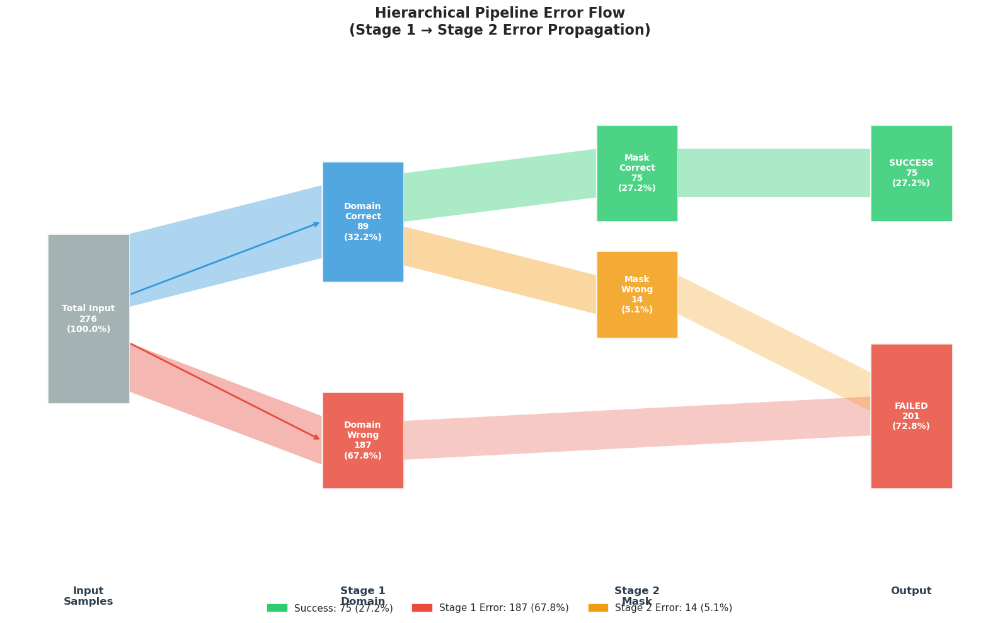

   ✅ Error flow diagram kaydedildi

5️⃣ Confidence Distribution Plots oluşturuluyor...


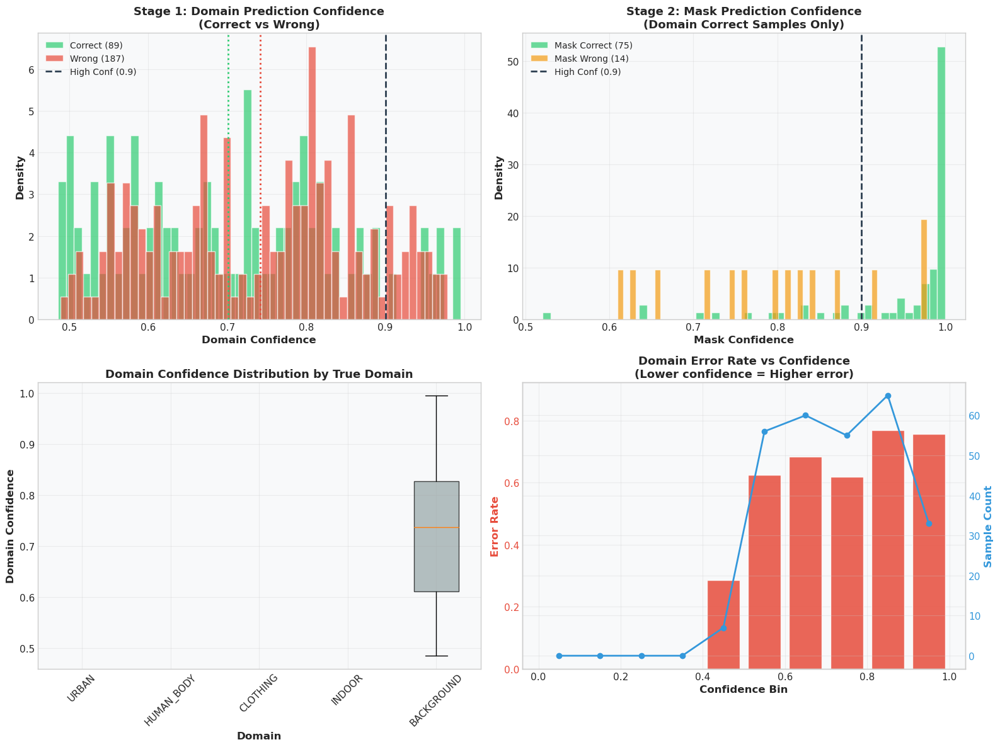

   ✅ Confidence distribution plots kaydedildi

6️⃣ Error Breakdown Pie Chart oluşturuluyor...


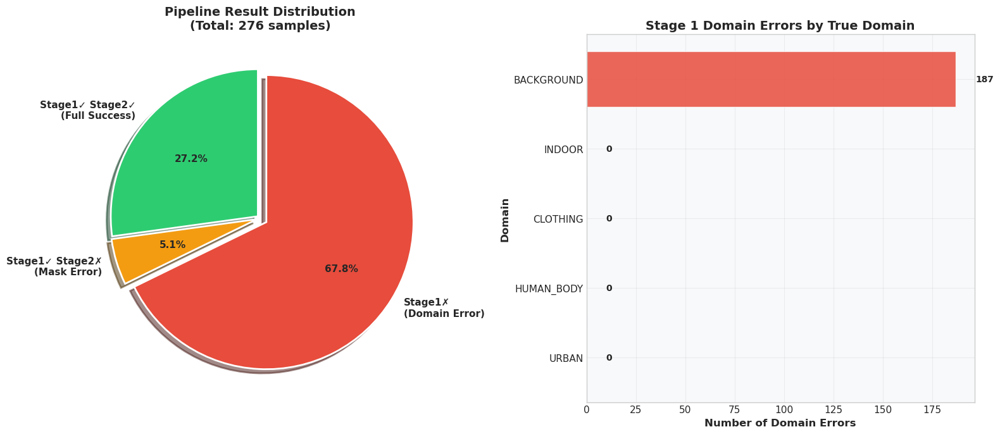

   ✅ Error breakdown pie chart kaydedildi

✅ GÖRSELLEŞTİRME BÖLÜM 2 TAMAMLANDI!


In [ ]:
"""
📊 HÜCRE 23 - PROFESYONEL GÖRSELLEŞTİRME - BÖLÜM 2
Error Flow Diagram, Confidence Distributions, Error Breakdown
"""

print("\n" + "="*70)
print("📊 PROFESYONEL GÖRSELLEŞTİRME - BÖLÜM 2")
print("="*70)

# =============================================
# 4️⃣ ERROR FLOW DIAGRAM (Sankey-style)
# =============================================

print("\n4️⃣ Error Flow Diagram oluşturuluyor...")

fig, ax = plt.subplots(figsize=(16, 10))

# Hesaplamalar
n_total = len(df_results)
n_s1_correct = len(df_stage1_correct_stage2_correct) + len(df_stage1_correct_stage2_wrong)
n_s1_wrong = len(df_stage1_wrong)
n_s2_correct = len(df_stage1_correct_stage2_correct)
n_s2_wrong = len(df_stage1_correct_stage2_wrong)

# Stage konumları
stages = ['Input\nSamples', 'Stage 1\nDomain', 'Stage 2\nMask', 'Output']
stage_x = [0, 1, 2, 3]

# Y pozisyonları (akış yükseklikleri)
y_positions = {
    'total': 0.5,
    's1_correct': 0.65,
    's1_wrong': 0.25,
    's2_correct': 0.75,
    's2_wrong': 0.55,
    'final_correct': 0.75,
    'final_wrong': 0.35
}

# Box'ları çiz
def draw_box(ax, x, y, width, height, color, label, count, pct):
    rect = plt.Rectangle((x - width/2, y - height/2), width, height, 
                         facecolor=color, edgecolor='white', linewidth=2, alpha=0.85)
    ax.add_patch(rect)
    ax.text(x, y, f'{label}\n{count:,}\n({pct:.1f}%)', 
            ha='center', va='center', fontsize=10, fontweight='bold', color='white')

# Akış çizgileri
def draw_flow(ax, x1, y1, x2, y2, width, color, alpha=0.4):
    from matplotlib.patches import FancyBboxPatch, ConnectionPatch
    # Basit çizgi çiz
    ax.fill([x1, x2, x2, x1], [y1-width/2, y2-width/2, y2+width/2, y1+width/2], 
            color=color, alpha=alpha, linewidth=0)

# Total input
draw_box(ax, 0, 0.5, 0.3, 0.35, COLORS['neutral'], 'Total Input', n_total, 100)

# Stage 1 outputs
s1_correct_pct = n_s1_correct/n_total*100
s1_wrong_pct = n_s1_wrong/n_total*100
draw_box(ax, 1, 0.7, 0.3, 0.25, COLORS['domain_correct'], 'Domain\nCorrect', n_s1_correct, s1_correct_pct)
draw_box(ax, 1, 0.25, 0.3, 0.2, COLORS['wrong'], 'Domain\nWrong', n_s1_wrong, s1_wrong_pct)

# Stage 2 outputs (sadece S1 doğru olanlar için)
s2_correct_pct = n_s2_correct/n_total*100
s2_wrong_pct = n_s2_wrong/n_total*100
draw_box(ax, 2, 0.8, 0.3, 0.2, COLORS['correct'], 'Mask\nCorrect', n_s2_correct, s2_correct_pct)
draw_box(ax, 2, 0.55, 0.3, 0.18, COLORS['mask_wrong'], 'Mask\nWrong', n_s2_wrong, s2_wrong_pct)

# Final outputs
final_correct = n_s2_correct
final_wrong = n_s1_wrong + n_s2_wrong
final_correct_pct = final_correct/n_total*100
final_wrong_pct = final_wrong/n_total*100
draw_box(ax, 3, 0.8, 0.3, 0.2, COLORS['correct'], 'SUCCESS', final_correct, final_correct_pct)
draw_box(ax, 3, 0.3, 0.3, 0.3, COLORS['wrong'], 'FAILED', final_wrong, final_wrong_pct)

# Akış çizgileri
# Input → S1 Correct
draw_flow(ax, 0.15, 0.6, 0.85, 0.7, 0.15, COLORS['domain_correct'])
# Input → S1 Wrong
draw_flow(ax, 0.15, 0.4, 0.85, 0.25, 0.1, COLORS['wrong'])
# S1 Correct → S2 Correct
draw_flow(ax, 1.15, 0.75, 1.85, 0.8, 0.1, COLORS['correct'])
# S1 Correct → S2 Wrong
draw_flow(ax, 1.15, 0.65, 1.85, 0.55, 0.08, COLORS['mask_wrong'])
# S1 Wrong → Final Wrong
draw_flow(ax, 1.15, 0.25, 2.85, 0.3, 0.08, COLORS['wrong'], alpha=0.3)
# S2 Correct → Final Correct
draw_flow(ax, 2.15, 0.8, 2.85, 0.8, 0.1, COLORS['correct'])
# S2 Wrong → Final Wrong
draw_flow(ax, 2.15, 0.55, 2.85, 0.35, 0.08, COLORS['mask_wrong'], alpha=0.3)

# Oklar ve etiketler
ax.annotate('', xy=(0.85, 0.7), xytext=(0.15, 0.55), 
            arrowprops=dict(arrowstyle='->', color=COLORS['domain_correct'], lw=2))
ax.annotate('', xy=(0.85, 0.25), xytext=(0.15, 0.45), 
            arrowprops=dict(arrowstyle='->', color=COLORS['wrong'], lw=2))

# Stage labels
for i, stage in enumerate(stages):
    ax.text(i, -0.05, stage, ha='center', va='top', fontsize=12, fontweight='bold', 
            color=COLORS['background'])

# Başlık ve legend
ax.set_xlim(-0.3, 3.3)
ax.set_ylim(-0.1, 1.05)
ax.axis('off')
ax.set_title('Hierarchical Pipeline Error Flow\n(Stage 1 → Stage 2 Error Propagation)', 
            fontsize=16, fontweight='bold', pad=20)

# Legend
legend_elements = [
    mpatches.Patch(color=COLORS['correct'], label=f'Success: {final_correct:,} ({final_correct_pct:.1f}%)'),
    mpatches.Patch(color=COLORS['wrong'], label=f'Stage 1 Error: {n_s1_wrong:,} ({s1_wrong_pct:.1f}%)'),
    mpatches.Patch(color=COLORS['mask_wrong'], label=f'Stage 2 Error: {n_s2_wrong:,} ({s2_wrong_pct:.1f}%)')
]
ax.legend(handles=legend_elements, loc='lower center', ncol=3, fontsize=11, 
         framealpha=0.9, bbox_to_anchor=(0.5, -0.02))

plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'error_flow_diagram.png'), 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Error flow diagram kaydedildi")

# =============================================
# 5️⃣ CONFIDENCE DISTRIBUTION PLOTS
# =============================================

print("\n5️⃣ Confidence Distribution Plots oluşturuluyor...")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 5a. Domain Confidence - Correct vs Wrong
ax = axes[0, 0]
correct_confs = df_results[df_results['domain_correct'] == True]['domain_confidence'].values
wrong_confs = df_results[df_results['domain_correct'] == False]['domain_confidence'].values

ax.hist(correct_confs, bins=50, alpha=0.7, color=COLORS['correct'], 
        label=f'Correct ({len(correct_confs):,})', density=True, edgecolor='white')
ax.hist(wrong_confs, bins=50, alpha=0.7, color=COLORS['wrong'], 
        label=f'Wrong ({len(wrong_confs):,})', density=True, edgecolor='white')
ax.axvline(x=0.9, color=COLORS['background'], linestyle='--', linewidth=2, label='High Conf (0.9)')
ax.axvline(x=correct_confs.mean(), color=COLORS['correct'], linestyle=':', linewidth=2)
ax.axvline(x=wrong_confs.mean() if len(wrong_confs) > 0 else 0, color=COLORS['wrong'], linestyle=':', linewidth=2)
ax.set_xlabel('Domain Confidence', fontsize=12, fontweight='bold')
ax.set_ylabel('Density', fontsize=12, fontweight='bold')
ax.set_title('Stage 1: Domain Prediction Confidence\n(Correct vs Wrong)', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)

# 5b. Mask Confidence (Domain Correct olanlar için)
ax = axes[0, 1]
mask_correct_confs = df_stage1_correct_stage2_correct['mask_confidence'].values
mask_wrong_confs = df_stage1_correct_stage2_wrong['mask_confidence'].values

if len(mask_correct_confs) > 0:
    ax.hist(mask_correct_confs, bins=50, alpha=0.7, color=COLORS['correct'], 
            label=f'Mask Correct ({len(mask_correct_confs):,})', density=True, edgecolor='white')
if len(mask_wrong_confs) > 0:
    ax.hist(mask_wrong_confs, bins=50, alpha=0.7, color=COLORS['mask_wrong'], 
            label=f'Mask Wrong ({len(mask_wrong_confs):,})', density=True, edgecolor='white')
ax.axvline(x=0.9, color=COLORS['background'], linestyle='--', linewidth=2, label='High Conf (0.9)')
ax.set_xlabel('Mask Confidence', fontsize=12, fontweight='bold')
ax.set_ylabel('Density', fontsize=12, fontweight='bold')
ax.set_title('Stage 2: Mask Prediction Confidence\n(Domain Correct Samples Only)', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)

# 5c. Box Plot - Domain Confidence by Domain
ax = axes[1, 0]
domain_conf_data = []
domain_labels = []
for domain in DOMAIN_NAMES:
    df_dom = df_results[df_results['true_domain_name'] == domain]
    domain_conf_data.append(df_dom['domain_confidence'].values)
    domain_labels.append(domain)

bp = ax.boxplot(domain_conf_data, labels=domain_labels, patch_artist=True)
colors_box = [COLORS['domain_correct'], COLORS['correct'], COLORS['mask_wrong'], 
              COLORS['accent'], COLORS['neutral']]
for patch, color in zip(bp['boxes'], colors_box):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax.set_xlabel('Domain', fontsize=12, fontweight='bold')
ax.set_ylabel('Domain Confidence', fontsize=12, fontweight='bold')
ax.set_title('Domain Confidence Distribution by True Domain', fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
ax.tick_params(axis='x', rotation=45)

# 5d. Confidence vs Error Rate
ax = axes[1, 1]
conf_bins = np.linspace(0, 1, 11)
bin_centers = (conf_bins[:-1] + conf_bins[1:]) / 2
error_rates = []
sample_counts = []

for i in range(len(conf_bins) - 1):
    mask = (df_results['domain_confidence'] >= conf_bins[i]) & (df_results['domain_confidence'] < conf_bins[i+1])
    df_bin = df_results[mask]
    if len(df_bin) > 0:
        error_rate = 1 - df_bin['domain_correct'].mean()
        error_rates.append(error_rate)
        sample_counts.append(len(df_bin))
    else:
        error_rates.append(0)
        sample_counts.append(0)

# Bar plot
bars = ax.bar(bin_centers, error_rates, width=0.08, color=COLORS['wrong'], 
              edgecolor='white', alpha=0.85)

# Sample count as secondary y-axis
ax2 = ax.twinx()
ax2.plot(bin_centers, sample_counts, color=COLORS['domain_correct'], 
         marker='o', linewidth=2, label='Sample Count')
ax2.set_ylabel('Sample Count', fontsize=12, fontweight='bold', color=COLORS['domain_correct'])
ax2.tick_params(axis='y', labelcolor=COLORS['domain_correct'])

ax.set_xlabel('Confidence Bin', fontsize=12, fontweight='bold')
ax.set_ylabel('Error Rate', fontsize=12, fontweight='bold', color=COLORS['wrong'])
ax.tick_params(axis='y', labelcolor=COLORS['wrong'])
ax.set_title('Domain Error Rate vs Confidence\n(Lower confidence = Higher error)', fontsize=13, fontweight='bold')
ax.set_ylim([0, max(error_rates)*1.2 if error_rates else 1])
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'confidence_distributions.png'), 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Confidence distribution plots kaydedildi")

# =============================================
# 6️⃣ ERROR BREAKDOWN PIE CHART
# =============================================

print("\n6️⃣ Error Breakdown Pie Chart oluşturuluyor...")

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Sol: Genel breakdown
ax = axes[0]
labels = ['Stage1✓ Stage2✓\n(Full Success)', 'Stage1✓ Stage2✗\n(Mask Error)', 'Stage1✗\n(Domain Error)']
sizes = [len(df_stage1_correct_stage2_correct), len(df_stage1_correct_stage2_wrong), len(df_stage1_wrong)]
colors = [COLORS['correct'], COLORS['mask_wrong'], COLORS['wrong']]
explode = (0.02, 0.02, 0.05)

wedges, texts, autotexts = ax.pie(sizes, explode=explode, labels=labels, colors=colors,
                                   autopct='%1.1f%%', shadow=True, startangle=90,
                                   textprops={'fontsize': 11, 'fontweight': 'bold'},
                                   wedgeprops={'edgecolor': 'white', 'linewidth': 2})
ax.set_title(f'Pipeline Result Distribution\n(Total: {n_total:,} samples)', 
            fontsize=14, fontweight='bold')

# Sağ: Domain bazında error breakdown
ax = axes[1]
domain_errors = []
for domain in DOMAIN_NAMES:
    df_dom = df_results[df_results['true_domain_name'] == domain]
    domain_errors.append(len(df_dom[df_dom['domain_correct'] == False]))

bars = ax.barh(DOMAIN_NAMES, domain_errors, color=COLORS['wrong'], 
               edgecolor='white', alpha=0.85)
ax.set_xlabel('Number of Domain Errors', fontsize=12, fontweight='bold')
ax.set_ylabel('Domain', fontsize=12, fontweight='bold')
ax.set_title('Stage 1 Domain Errors by True Domain', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='x')

# Bar labels
for bar, err in zip(bars, domain_errors):
    width = bar.get_width()
    ax.text(width + 10, bar.get_y() + bar.get_height()/2.,
            f'{err:,}',
            ha='left', va='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'error_breakdown.png'), 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Error breakdown pie chart kaydedildi")

print("\n" + "="*70)
print("✅ GÖRSELLEŞTİRME BÖLÜM 2 TAMAMLANDI!")
print("="*70)



🖼️ YANLIŞ SINIFLANDIRILAN ÖRNEK GÖRSELLER

7️⃣ Misclassified samples grid oluşturuluyor...

   📷 Stage 1 errors (domain wrong)...


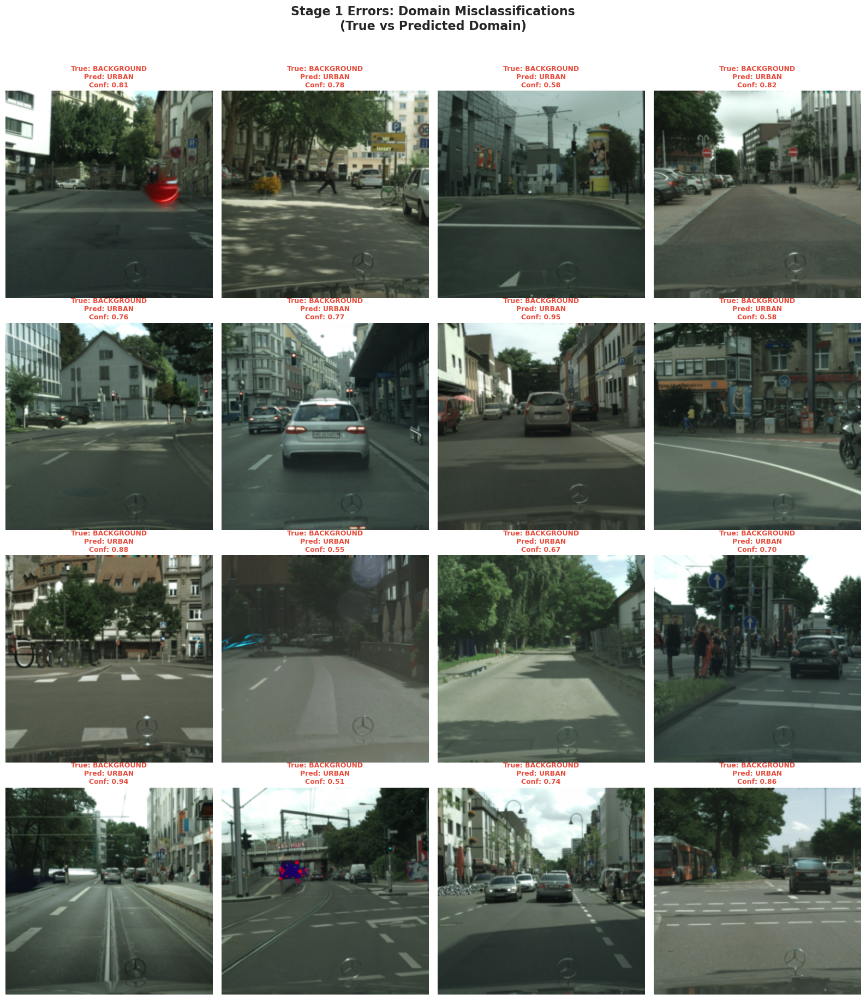

   ✅ Stage 1 error samples kaydedildi (16 görsel)

   📷 Stage 2 errors (domain correct, mask wrong)...


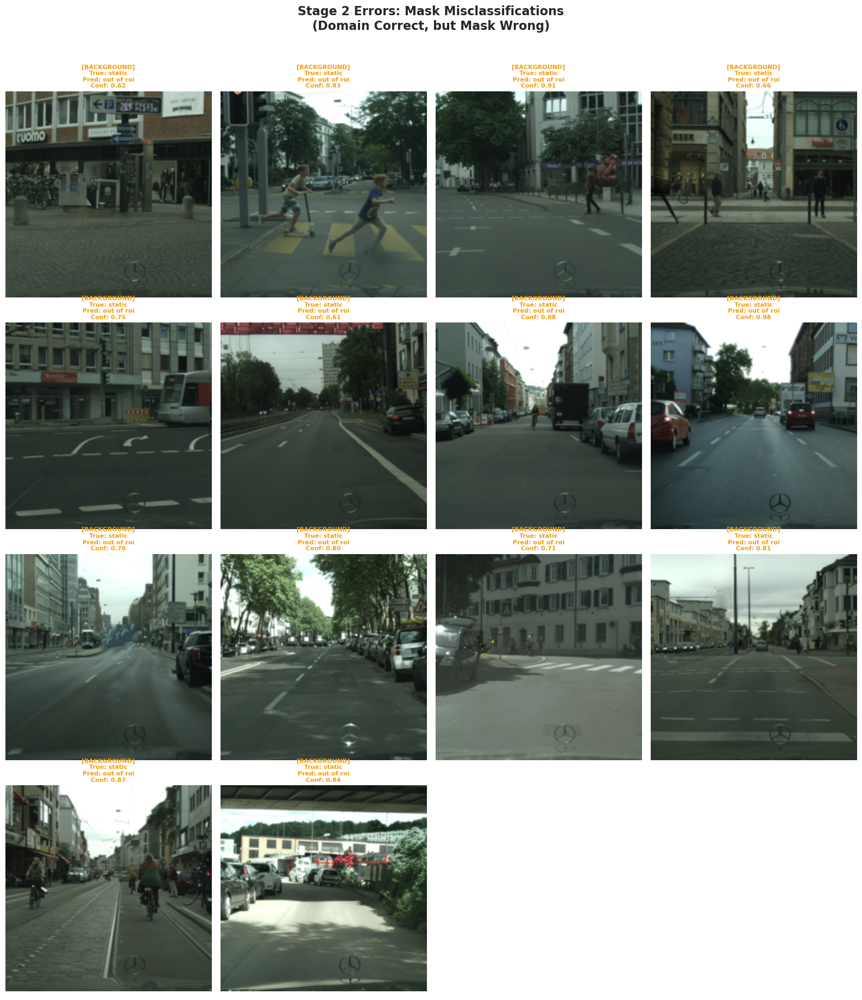

   ✅ Stage 2 error samples kaydedildi (14 görsel)

   📷 Success samples (full pipeline correct)...


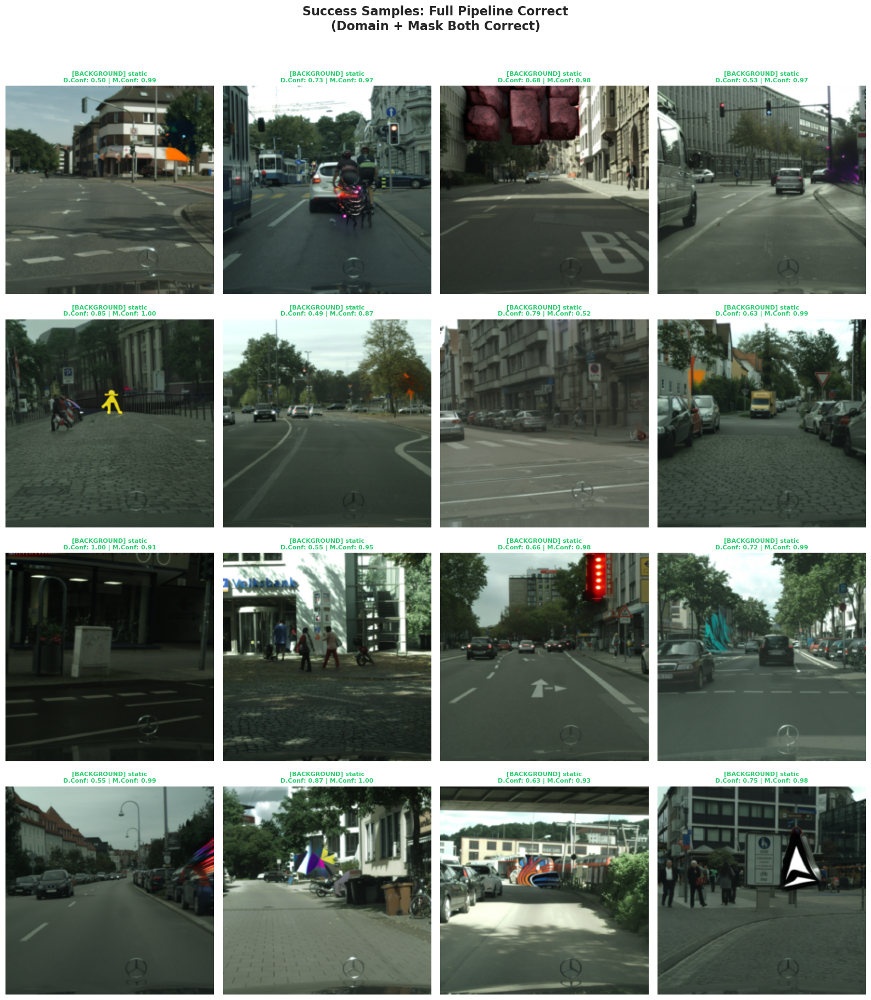

   ✅ Success samples kaydedildi (16 görsel)

✅ ÖRNEK GÖRSEL GRIDLERİ TAMAMLANDI!


In [ ]:
"""
🖼️ HÜCRE 24 - YANLIŞ SINIFLANDIRILAN ÖRNEK GÖRSELLER
Misclassified sample image grids for visual inspection
"""

print("\n" + "="*70)
print("🖼️ YANLIŞ SINIFLANDIRILAN ÖRNEK GÖRSELLER")
print("="*70)

# =============================================
# 7️⃣ MISCLASSIFIED SAMPLES GRID
# =============================================

def denormalize_image(tensor):
    """Normalize edilmiş tensörü görüntülenebilir hale getir"""
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    # Tensor to numpy
    if torch.is_tensor(tensor):
        img = tensor.cpu().numpy()
    else:
        img = tensor
    
    # CHW -> HWC
    if img.shape[0] == 3:
        img = img.transpose(1, 2, 0)
    
    # Denormalize
    img = std * img + mean
    img = np.clip(img, 0, 1)
    
    return img

def load_sample_image(image_path, transform=None):
    """Örnek görsel yükle"""
    try:
        img = Image.open(image_path).convert('RGB')
        if transform:
            return transform(img)
        return np.array(img) / 255.0
    except Exception as e:
        print(f"Error loading {image_path}: {e}")
        return None

print("\n7️⃣ Misclassified samples grid oluşturuluyor...")

# Transform for loading (no normalization for display)
display_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

# =============================================
# 7a. Stage 1 Errors (Domain Wrong)
# =============================================

print("\n   📷 Stage 1 errors (domain wrong)...")

n_samples = 16  # 4x4 grid
df_s1_errors = df_stage1_wrong.head(n_samples * 5)  # Get extra in case some fail

fig, axes = plt.subplots(4, 4, figsize=(16, 18))
axes = axes.flatten()

sample_count = 0
for idx, row in df_s1_errors.iterrows():
    if sample_count >= n_samples:
        break
    
    ax = axes[sample_count]
    
    # Load image
    img_path = row['image_path']
    img = load_sample_image(img_path, display_transform)
    
    if img is None:
        continue
    
    # Display
    if torch.is_tensor(img):
        img = img.permute(1, 2, 0).numpy()
    
    ax.imshow(img)
    ax.axis('off')
    
    # Title with error info
    true_dom = row['true_domain_name']
    pred_dom = row['pred_domain_name']
    conf = row['domain_confidence']
    
    title = f"True: {true_dom}\nPred: {pred_dom}\nConf: {conf:.2f}"
    ax.set_title(title, fontsize=9, fontweight='bold', 
                color=COLORS['wrong'], pad=5)
    
    # Border color
    for spine in ax.spines.values():
        spine.set_edgecolor(COLORS['wrong'])
        spine.set_linewidth(3)
        spine.set_visible(True)
    
    sample_count += 1

# Hide unused axes
for i in range(sample_count, len(axes)):
    axes[i].axis('off')

fig.suptitle('Stage 1 Errors: Domain Misclassifications\n(True vs Predicted Domain)', 
            fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'misclassified_stage1_errors.png'), 
            dpi=200, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Stage 1 error samples kaydedildi ({sample_count} görsel)")

# =============================================
# 7b. Stage 2 Errors (Domain Correct, Mask Wrong)
# =============================================

print("\n   📷 Stage 2 errors (domain correct, mask wrong)...")

df_s2_errors = df_stage1_correct_stage2_wrong.head(n_samples * 5)

fig, axes = plt.subplots(4, 4, figsize=(16, 18))
axes = axes.flatten()

sample_count = 0
for idx, row in df_s2_errors.iterrows():
    if sample_count >= n_samples:
        break
    
    ax = axes[sample_count]
    
    # Load image
    img_path = row['image_path']
    img = load_sample_image(img_path, display_transform)
    
    if img is None:
        continue
    
    # Display
    if torch.is_tensor(img):
        img = img.permute(1, 2, 0).numpy()
    
    ax.imshow(img)
    ax.axis('off')
    
    # Title with error info
    domain = row['true_domain_name']
    true_mask = row['true_mask_name']
    pred_mask = row['pred_mask_name']
    conf = row['mask_confidence']
    
    title = f"[{domain}]\nTrue: {true_mask}\nPred: {pred_mask}\nConf: {conf:.2f}"
    ax.set_title(title, fontsize=8, fontweight='bold', 
                color=COLORS['mask_wrong'], pad=5)
    
    # Border color
    for spine in ax.spines.values():
        spine.set_edgecolor(COLORS['mask_wrong'])
        spine.set_linewidth(3)
        spine.set_visible(True)
    
    sample_count += 1

# Hide unused axes
for i in range(sample_count, len(axes)):
    axes[i].axis('off')

fig.suptitle('Stage 2 Errors: Mask Misclassifications\n(Domain Correct, but Mask Wrong)', 
            fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'misclassified_stage2_errors.png'), 
            dpi=200, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Stage 2 error samples kaydedildi ({sample_count} görsel)")

# =============================================
# 7c. Success Samples (Full Pipeline Correct)
# =============================================

print("\n   📷 Success samples (full pipeline correct)...")

df_success = df_stage1_correct_stage2_correct.head(n_samples * 5)

fig, axes = plt.subplots(4, 4, figsize=(16, 18))
axes = axes.flatten()

sample_count = 0
for idx, row in df_success.iterrows():
    if sample_count >= n_samples:
        break
    
    ax = axes[sample_count]
    
    # Load image
    img_path = row['image_path']
    img = load_sample_image(img_path, display_transform)
    
    if img is None:
        continue
    
    # Display
    if torch.is_tensor(img):
        img = img.permute(1, 2, 0).numpy()
    
    ax.imshow(img)
    ax.axis('off')
    
    # Title with success info
    domain = row['true_domain_name']
    mask = row['true_mask_name']
    dom_conf = row['domain_confidence']
    mask_conf = row['mask_confidence']
    
    title = f"[{domain}] {mask}\nD.Conf: {dom_conf:.2f} | M.Conf: {mask_conf:.2f}"
    ax.set_title(title, fontsize=8, fontweight='bold', 
                color=COLORS['correct'], pad=5)
    
    # Border color
    for spine in ax.spines.values():
        spine.set_edgecolor(COLORS['correct'])
        spine.set_linewidth(3)
        spine.set_visible(True)
    
    sample_count += 1

# Hide unused axes
for i in range(sample_count, len(axes)):
    axes[i].axis('off')

fig.suptitle('Success Samples: Full Pipeline Correct\n(Domain + Mask Both Correct)', 
            fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(viz_folder, 'success_samples.png'), 
            dpi=200, bbox_inches='tight', facecolor='white')
plt.show()

print(f"   ✅ Success samples kaydedildi ({sample_count} görsel)")

print("\n" + "="*70)
print("✅ ÖRNEK GÖRSEL GRIDLERİ TAMAMLANDI!")
print("="*70)


In [ ]:
"""
💾 HÜCRE 25 - SONUÇLARI DIŞA AKTAR VE ÖZET RAPOR
CSV, JSON ve HTML formatlarında sonuçları kaydet
"""

from datetime import datetime
import json

print("\n" + "="*70)
print("💾 SONUÇLARI DIŞA AKTAR")
print("="*70)

# =============================================
# 8️⃣ CSV EXPORT
# =============================================

print("\n8️⃣ Detaylı sonuçlar CSV'ye kaydediliyor...")

# Main results CSV
csv_path = os.path.join(output_folder, 'detailed_results.csv')
df_results.to_csv(csv_path, index=False)
print(f"   ✅ Detaylı sonuçlar: {csv_path}")

# Domain analysis CSV
domain_csv_path = os.path.join(output_folder, 'domain_analysis.csv')
df_domain_analysis.to_csv(domain_csv_path, index=False)
print(f"   ✅ Domain analizi: {domain_csv_path}")

# Error pairs CSV
error_pairs_path = os.path.join(output_folder, 'domain_confusion_pairs.csv')
domain_confusion_pairs.to_csv(error_pairs_path, index=False)
print(f"   ✅ Domain karışıklık çiftleri: {error_pairs_path}")

# =============================================
# 9️⃣ JSON SUMMARY EXPORT
# =============================================

print("\n9️⃣ Özet metrikler JSON'a kaydediliyor...")

summary_json = {
    'metadata': {
        'generated_at': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
        'notebook': NOTEBOOK_NAME,
        'total_validation_samples': int(total_samples)
    },
    'stage1_domain_classification': {
        'accuracy': float(domain_accuracy),
        'correct_count': int(domain_correct_count),
        'wrong_count': int(total_samples - domain_correct_count),
        'per_domain_accuracy': {
            row['domain']: float(row['stage1_accuracy']) 
            for _, row in df_domain_analysis.iterrows()
        }
    },
    'stage2_mask_detection': {
        'accuracy_on_correct_domain': float(mask_accuracy_on_correct),
        'correct_count': int(mask_correct_count),
        'wrong_count': int(len(df_domain_correct) - mask_correct_count) if len(df_domain_correct) > 0 else 0,
        'per_domain_accuracy': {
            row['domain']: float(row['stage2_accuracy']) 
            for _, row in df_domain_analysis.iterrows()
        }
    },
    'full_pipeline': {
        'accuracy': float(pipeline_accuracy),
        'correct_count': int(pipeline_correct_count),
        'wrong_count': int(total_samples - pipeline_correct_count),
        'per_domain_accuracy': {
            row['domain']: float(row['pipeline_accuracy']) 
            for _, row in df_domain_analysis.iterrows()
        }
    },
    'error_breakdown': {
        'stage1_correct_stage2_correct': int(len(df_stage1_correct_stage2_correct)),
        'stage1_correct_stage2_wrong': int(len(df_stage1_correct_stage2_wrong)),
        'stage1_wrong': int(len(df_stage1_wrong))
    },
    'confidence_analysis': {
        'avg_confidence_correct_domain': float(avg_conf_correct),
        'avg_confidence_wrong_domain': float(avg_conf_wrong),
        'low_confidence_threshold': 0.7,
        'low_confidence_samples': int(len(df_low_conf)),
        'high_confidence_threshold': 0.9,
        'high_confidence_samples': int(len(df_high_conf))
    },
    'top_domain_confusions': [
        {
            'true_domain': row['true_domain_name'],
            'pred_domain': row['pred_domain_name'],
            'count': int(row['count'])
        }
        for _, row in domain_confusion_pairs.head(5).iterrows()
    ]
}

json_path = os.path.join(output_folder, 'summary_metrics.json')
with open(json_path, 'w', encoding='utf-8') as f:
    json.dump(summary_json, f, indent=2, ensure_ascii=False)
print(f"   ✅ Özet metrikler: {json_path}")

# =============================================
# 🔟 FINAL SUMMARY DISPLAY
# =============================================

print("\n" + "="*70)
print("📊 KAPSAMLI HİYERARŞİK VALİDASYON TEST SONUÇLARI")
print("="*70)

print(f"""
╔══════════════════════════════════════════════════════════════════════╗
║                         📋 TEST ÖZETİ                                 ║
╚══════════════════════════════════════════════════════════════════════╝

   📅 Tarih: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}
   📊 Toplam Test Örnekleri: {total_samples:,}

╔══════════════════════════════════════════════════════════════════════╗
║                    🎯 STAGE 1 - DOMAIN CLASSIFICATION                 ║
╚══════════════════════════════════════════════════════════════════════╝

   ✅ Accuracy: {domain_accuracy*100:.2f}%
   ✅ Doğru:    {domain_correct_count:,} örnek
   ❌ Yanlış:   {total_samples - domain_correct_count:,} örnek

╔══════════════════════════════════════════════════════════════════════╗
║                    🎭 STAGE 2 - MASK DETECTION                        ║
║                  (Sadece Domain Doğru Olanlar İçin)                   ║
╚══════════════════════════════════════════════════════════════════════╝

   ✅ Accuracy: {mask_accuracy_on_correct*100:.2f}%
   ✅ Doğru:    {mask_correct_count:,} örnek
   ❌ Yanlış:   {len(df_domain_correct) - mask_correct_count:,} örnek

╔══════════════════════════════════════════════════════════════════════╗
║                    🔗 FULL PIPELINE PERFORMANCE                       ║
╚══════════════════════════════════════════════════════════════════════╝

   ✅ Pipeline Accuracy: {pipeline_accuracy*100:.2f}%
   ✅ Tam Başarı:  {pipeline_correct_count:,} örnek ({pipeline_accuracy*100:.1f}%)
   ⚠️ Stage 1 Hatası: {len(df_stage1_wrong):,} örnek ({len(df_stage1_wrong)/total_samples*100:.1f}%)
   ⚠️ Stage 2 Hatası: {len(df_stage1_correct_stage2_wrong):,} örnek ({len(df_stage1_correct_stage2_wrong)/total_samples*100:.1f}%)

╔══════════════════════════════════════════════════════════════════════╗
║                         📊 DOMAIN BAZINDA                             ║
╚══════════════════════════════════════════════════════════════════════╝
""")

print(f"   {'Domain':<15} {'S1 Acc':>10} {'S2 Acc':>10} {'Pipeline':>10}")
print(f"   {'-'*50}")
for _, row in df_domain_analysis.iterrows():
    print(f"   {row['domain']:<15} {row['stage1_accuracy']*100:>9.1f}% {row['stage2_accuracy']*100:>9.1f}% {row['pipeline_accuracy']*100:>9.1f}%")

print(f"""
╔══════════════════════════════════════════════════════════════════════╗
║                         📂 OLUŞTURULAN DOSYALAR                       ║
╚══════════════════════════════════════════════════════════════════════╝

   📁 {output_folder}/
      ├── 📄 detailed_results.csv          (Her örnek için detaylı sonuçlar)
      ├── 📄 domain_analysis.csv           (Domain bazında analiz)
      ├── 📄 domain_confusion_pairs.csv    (Domain karışıklık çiftleri)
      ├── 📄 summary_metrics.json          (Özet metrikler)
      │
      └── 📁 visualizations/
          ├── 📊 stage1_domain_confusion_matrix.png
          ├── 📊 stage2_mask_confusion_matrices.png
          ├── 📊 per_domain_accuracy.png
          ├── 📊 error_flow_diagram.png
          ├── 📊 confidence_distributions.png
          ├── 📊 error_breakdown.png
          ├── 🖼️ misclassified_stage1_errors.png
          ├── 🖼️ misclassified_stage2_errors.png
          └── 🖼️ success_samples.png

╔══════════════════════════════════════════════════════════════════════╗
║                         💡 ÖNERİLER                                   ║
╚══════════════════════════════════════════════════════════════════════╝
""")

# Recommendations based on results
if domain_accuracy < 0.85:
    print(f"   ⚠️ Stage 1 accuracy düşük ({domain_accuracy*100:.1f}% < 85%)")
    print(f"      → Domain classifier modelini iyileştir")
    print(f"      → Daha fazla epoch veya data augmentation dene")

if mask_accuracy_on_correct < 0.75:
    print(f"   ⚠️ Stage 2 accuracy düşük ({mask_accuracy_on_correct*100:.1f}% < 75%)")
    print(f"      → Domain-specific mask detector'ları iyileştir")
    print(f"      → Sınıf dengesizliği için class weighting dene")

if len(df_stage1_wrong) > total_samples * 0.2:
    print(f"   🚨 Yüksek Stage 1 hata oranı!")
    print(f"      → {len(df_stage1_wrong):,} örnek yanlış domain'e gitti")
    print(f"      → En çok karışan domain çiftlerini incele")

if avg_conf_wrong > 0.7:
    print(f"   ⚠️ Yanlış tahminlerin confidence'ı yüksek ({avg_conf_wrong:.2f})")
    print(f"      → Model calibration gerekebilir")
    print(f"      → Label smoothing veya temperature scaling dene")

print(f"""
══════════════════════════════════════════════════════════════════════
                    ✅ TEST TAMAMLANDI!
══════════════════════════════════════════════════════════════════════
""")



💾 SONUÇLARI DIŞA AKTAR

8️⃣ Detaylı sonuçlar CSV'ye kaydediliyor...
   ✅ Detaylı sonuçlar: hierarchical_validation_test_results\detailed_results.csv
   ✅ Domain analizi: hierarchical_validation_test_results\domain_analysis.csv
   ✅ Domain karışıklık çiftleri: hierarchical_validation_test_results\domain_confusion_pairs.csv

9️⃣ Özet metrikler JSON'a kaydediliyor...
   ✅ Özet metrikler: hierarchical_validation_test_results\summary_metrics.json

📊 KAPSAMLI HİYERARŞİK VALİDASYON TEST SONUÇLARI

╔══════════════════════════════════════════════════════════════════════╗
║                         📋 TEST ÖZETİ                                 ║
╚══════════════════════════════════════════════════════════════════════╝

   📅 Tarih: 2025-12-04 08:58:23
   📊 Toplam Test Örnekleri: 276

╔══════════════════════════════════════════════════════════════════════╗
║                    🎯 STAGE 1 - DOMAIN CLASSIFICATION                 ║
╚══════════════════════════════════════════════════════════════════════╝